# SET UP

### Import necessary libraries

In [1]:
import json
import csv
import calendar
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.patches as mpatches
from termcolor import colored
from gboml import GbomlGraph
from gboml.compiler.classes import Expression 
import argparse 
from statistics import mean
import seaborn as sns
import matplotlib.colors as mcolors
import matplotlib
from IPython.display import display
from builtins import sum as sum
import plotly.graph_objects as go
from collections import defaultdict
import Object as ob
from pandas import DataFrame as df
import os
import sys

project_root = os.path.abspath(os.path.join(os.getcwd(),'..'))
sys.path.append(os.path.join(project_root, 'Modules'))

import GBOML_function as gf
import process_funct as pf
import analyzer_funct as af

from process_funct import merge_dictionaries as merge
from process_funct import convert_mmr_to_dict as convert
from process_funct import transform_dict_into_table_several_column as table
from process_funct import all_cost_prod_dict_per_cluster as node_stat

### Load the model dictionaries for each scenario and the folder path

In [2]:
belgian_data_folder = os.path.join(project_root, 'Data', 'Belgian_model') 
template_folder = os.path.join(project_root, 'Templates')
model_folder = os.path.join(project_root, 'Models GBOML','No efuel')   

### Initialization of the dictionary 

- Where to save plot and results

In [ ]:
scenario_result_folder = os.path.join(project_root, 'Plots' ) 
simulation_folder = os.path.join(project_root, 'Simulations') 

- The dictionnaries:

In [4]:
model = 'scenario_dme_base_case_1years.json' 

model_obj = gf.MakeMeReadable(gf.json.load(open(os.path.join(simulation_folder, model))))
file_path = os.path.join(simulation_folder, model)
with open(file_path, 'r') as myfile:
    data = myfile.read()
model_dict = json.loads(data)

## Class

In [5]:
def dfzoom(data, zoom, value_name='value'):

    if zoom == 'month':
        axis = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    else:
        axis = list(range(1, len(data)+1))
        
    return pd.DataFrame({zoom: axis[:len(data)], value_name: data})

def stats(data, col=None):
    """Stats concises + outliers avec index"""
    s = data[col] if isinstance(data, pd.DataFrame) else pd.Series(data)
    s = s.dropna()
    
    # Stats basics
    stats = {
        'n': len(s), 'sum': s.mean(), 'median': s.median(),
        'min': s.min(), 'max': s.max(), 'std': s.std(),
        'q1': s.quantile(0.25), 'q3': s.quantile(0.75)
    }
    
    # Outliers
    iqr = stats['q3'] - stats['q1']
    bounds = stats['q1'] - 1.5*iqr, stats['q3'] + 1.5*iqr
    outliers = s[(s < bounds[0]) | (s > bounds[1])]
    
    return stats, outliers

In [6]:
class Import: # Ancien nom: Object
    def __init__(self, model, solution, name = None):
        
        self.name = name if name is not None else model.get('name', 'No name')
        self.model = model if model is not None else {}
        self.solution = solution if solution is not None else {}
        
        # Parameters (Note: Si l'objet est un fallback, il pourrait ne pas avoir de 'parameters')
        self.parameters = model.get('parameters', {}) 
        # Tente d'initialiser param() uniquement si 'parameters' est présent
        if self.parameters:
            self.param() 
        
        # Variables
        self.variables = solution.get('variables', {})
        # Tente d'initialiser var() uniquement si 'variables' est présent
        if self.variables:
            self.var()
        
        # Objectives
        # Note: L'attribut 'cost' doit être présent même sans objectifs nommés.
        self.objectives = solution.get('objectives', {})
        # Utiliser la valeur 'cost' brute si possible, sinon calculer à partir des objectifs
        self.cost = solution.get('cost', 0.0) 
        
        # Tente de calculer les objectifs si présents
        if self.objectives.get('named'):
            self.objectives_cost()
        
        # Si 'cost' n'a pas été chargé par solution.get('cost', 0.0) ET objectives_cost n'a pas été appelé
        if not hasattr(self, 'cost'):
            setattr(self, 'cost', 0) 
            
    # [Le reste des méthodes attr, get_param, get_var, get_obj, param, var, objectives_cost restent]
    
    def attr(self): 
        for attr, value in vars(self).items():
            print(f"{attr}")
    
    def get_param(self):
        # Utiliser self.parameters sans self.model.get('parameters')
        display(pd.DataFrame(list(self.parameters.keys()), columns=["Parameters"]).style.hide(axis='index'))
        
    def get_var(self):
        # Utiliser self.variables
        display(pd.DataFrame(list(self.variables.keys()), columns=["Variables"]).style.hide(axis='index'))
        
    def get_obj(self):
        display(pd.DataFrame(list(self.objectives.get('named', {}).keys()), columns=["Objectives"]).style.hide(axis="index"))
    
    def param(self):
        for par in self.parameters.keys(): 
            value = self.parameters[par][0] if len(self.parameters[par]) == 1 else self.parameters[par] 
            setattr(self, par, value)
    
    def var(self):
        for var in self.variables.keys(): 
            try: 
                value = self.variables[var]['values'][0] if len(self.variables[var]['values']) == 1 else self.variables[var]['values'] 
            except: 
                value = self.variables[var]
            setattr(self, var, value)

    
    def objectives_cost(self):
        # Cette méthode est appelée SEULEMENT si self.objectives.get('named') est True
        obj = self.objectives.get('named')
        total = 0 
        for o in obj.keys(): 
            value = obj.get(o) 
            setattr(self, o, value) 
            total += value 
        setattr(self, 'cost', total)

class Balance:
    def __init__(self, model, solution, name = None):
        
        self.name = name if name is not None else model.get('name', 'No name')
        self.model = model if model is not None else {}
        self.solution = solution if solution is not None else {}
        self.dual()  # Initialize duals as attributes

    def attr(self): 
        for attr, value in vars(self).items():
            print(f"{attr}")
            
    def dual(self):
        duals = self.solution.get('constraints')
        for d in duals.keys(): 
            value = duals.get(d).get('Pi') 
            setattr(self, d, value)  # Attribut de classe
            
    def node(self):
        display(pd.DataFrame(list(self.model.get('variables_used').keys()), columns=["Nodes"]).style.hide(axis='index'))
        
    def var_used(self):
        display(pd.DataFrame(list(dict.fromkeys(var for vars_list in self.model.get('variables_used', {}).values() for var in vars_list)), columns=["Variables used"]).style.hide(axis='index'))
    
class Node:
    def __init__(self, model, solution, name = None):
        
        self.name = name if name is not None else model.get('name', 'No name')
        self.model = model if model is not None else {}
        self.solution = solution if solution is not None else {}
        
        # Parameters
        self.parameters = model.get('parameters') 
        self.param()  # Initialize parameters as attributes
        
        # Variables
        self.variables = solution.get('variables')
        self.var()  # Initialize variables as attributes
        
        # Objectives
        self.objectives = solution.get('objectives')
        self.objectives_cost()
        
        # Capacity
        self.capacity()
        
    def attr(self): 
        for attr, value in vars(self).items():
            print(f"{attr}")
            
    def info(self):
        print(colored('Node information:', 'blue', attrs=['bold', 'underline']))
        print(f"Name: {self.name}")
        print(f'Number of constraints: {self.model.get("number_constraints")}')
        print(f'Number of variables: {self.model.get("number_variables")}')
        print(f'Number of parameters: {self.model.get("number_parameters")}') 
    
    def get_param(self):
        display(pd.DataFrame(list(self.parameters.keys()), columns=["Parameters"]).style.hide(axis='index'))
        
    def get_var(self):
        display(pd.DataFrame(list(self.variables.keys()), columns=["Variables"]).style.hide(axis='index'))
        
    def get_obj(self):
        display(pd.DataFrame(list(self.objectives.get('named').keys()), columns=["Objectives"]).style.hide(axis="index"))
    
    def param(self):
        for par in self.parameters.keys(): 
            value = self.parameters[par][0] if len(self.parameters[par]) == 1 else self.parameters[par] 
            setattr(self, par, value)  # Attribut de classe
    
    def var(self):
        for var in self.variables.keys(): 
            try: 
                value = self.variables[var]['values'][0] if len(self.variables[var]['values']) == 1 else self.variables[var]['values'] 
            except: 
                value = self.variables[var]
            setattr(self, var, value)  # Attribut de classe
    
    def objectives_cost(self):
        obj = self.solution.get('objectives').get('named')
        total = 0      
        for o in obj.keys(): 
            value = obj.get(o) 
            setattr(self, o, value)  # Attribut de classe
            total += value 
        setattr(self, 'cost', total)  # Attribut de classe
    
    def capacity(self):
        cap = self.pre_installed_capacity + self.new_capacity
        setattr(self, 'capacity', cap)
    
    def cap_table(self, unit = None): 
        df = pd.DataFrame({"Node": [self.name], "Max Capacity": [self.max_capacity], "Pre-installed Capacity": [self.pre_installed_capacity], 
                            "New Capacity": [self.new_capacity], "Installed Capacity": [self.capacity]})
        if unit is not None:
            df.insert(1, "Unit", unit)
        return (df.style.hide(axis="index"))
        
    def stat(self, var, unit = ' ', unit_energy = ' '):
        
        values = getattr(self, var)
        return (pd.DataFrame({"Capacity " + unit: [self.capacity], "Yearly Production " + unit_energy: [sum(values)],
            "Max Production " + unit_energy: [max(values)], "Min Production " + unit_energy: [min(values)], "Average Production " + unit_energy: [mean(values)]}).style.hide(axis="index"))
        
    def summary(self):
        print(colored('Node summary:', 'blue', attrs=['bold', 'underline']))
        print(f"Name: {self.name}")
        print(f"Cost: {round(self.cost,2)} M€")
        print(f"Installed Capacity: {round(self.capacity,2)}")
        for var in self.variables.keys():
            if 'capacity' in var:
                continue
            print(f'{var.replace("_", " ").capitalize()}: {sum(getattr(self, var))}')

class Storage:
    def __init__(self, model, solution, name = None):
        
        self.name = name if name is not None else model.get('name', ' - ')
        self.model = model if model is not None else {}
        self.solution = solution if solution is not None else {}
        
        # Parameters
        self.parameters = model.get('parameters') 
        self.param()  # Initialize parameters as attributes
        
        # Variables
        self.variables = solution.get('variables')
        self.var()  # Initialize variables as attributes
        self.net()
        
        # Objectives
        self.objectives = solution.get('objectives')
        self.objectives_cost()
        
        # Capacity
        self.capacity()
        
        # Net flow rate
        char, disch = [], []

        
    def attr(self): 
        for attr, value in vars(self).items():
            print(f"{attr}")
        
    def info(self):
        print(colored('Node information:', 'blue', attrs=['bold', 'underline']))
        print(f"Name: {self.name}")
        print(f'Number of constraints: {self.model.get("number_constraints")}')
        print(f'Number of variables: {self.model.get("number_variables")}')
        print(f'Number of parameters: {self.model.get("number_parameters")}') 
    
    def get_param(self):
        display(pd.DataFrame(list(self.parameters.keys()), columns=["Parameters"]).style.hide(axis='index'))
        
    def get_var(self):
        display(pd.DataFrame(list(self.variables.keys()), columns=["Variables"]).style.hide(axis='index'))
        
    def get_obj(self):
        display(pd.DataFrame(list(self.objectives.get('named').keys()), columns=["Objectives"]).style.hide(axis="index"))
    
    def param(self):
        for par in self.parameters.keys(): 
            value = self.parameters[par][0] if len(self.parameters[par]) == 1 else self.parameters[par] 
            setattr(self, par, value)  # Attribut de classe
    
    def var(self):
        for var in self.variables.keys(): 
            try: 
                value = self.variables[var]['values'][0] if len(self.variables[var]['values']) == 1 else self.variables[var]['values'] 
            except: 
                value = self.variables[var]
            setattr(self, var, value)  # Attribut de classe
    
    def objectives_cost(self):
        obj = self.solution.get('objectives').get('named')
        total = 0      
        for o in obj.keys(): 
            value = obj.get(o) 
            setattr(self, o, value)  # Attribut de classe
            total += value 
        setattr(self, 'cost', total)  # Attribut de classe
    
    def net(self):
        char = getattr(self, next(key for key in self.variables.keys() if 'charged' in key))
        disch = getattr(self, next(key for key in self.variables.keys() if 'discharged' in key))

        net = [d - c for c, d in zip(char, disch)]
        setattr(self, 'net_flow', net)
        
    
    def capacity(self):
        
        setattr(self, 'max_capacity_energy', self.max_capacity_energy if 'max_capacity_energy' in self.parameters.keys() else self.max_capacity_stock)
        setattr(self, 'max_capacity_power', self.max_capacity_power if 'max_capacity_power' in self.parameters.keys() else self.max_capacity_flow)
        setattr(self, 'pre_installed_capacity_energy', self.pre_installed_capacity_energy if 'pre_installed_capacity_energy' in self.parameters.keys() else self.pre_installed_capacity_stock)
        setattr(self, 'pre_installed_capacity_power', self.pre_installed_capacity_power if 'pre_installed_capacity_power' in self.parameters.keys() else self.pre_installed_capacity_flow)
        setattr(self, 'new_energy_capacity', self.new_energy_capacity if 'new_energy_capacity' in self.variables.keys() else self.capacity_stock)
        setattr(self, 'new_power_capacity', self.new_power_capacity if 'new_power_capacity' in self.variables.keys() else self.capacity_flow)
        
        cap_energy = self.pre_installed_capacity_energy + self.new_energy_capacity
        setattr(self, 'storage_capacity', cap_energy)
        
        cap_power = self.pre_installed_capacity_power + self.new_power_capacity 
        setattr(self, 'discharged_rate', cap_power)
        
        if 'max_charged' in self.parameters.keys():
            setattr(self, 'charged_rate', self.discharged_rate * self.max_charged)
        else:
            setattr(self, 'charged_rate', self.discharged_rate)
            
        
    def cap_table(self, unit = None): 
        
        
            
        df = pd.DataFrame({"Node": [self.name], 
                            "Max Storage capacity": [self.max_capacity_energy], "Pre-installed Storage capacity": [self.pre_installed_capacity_energy], 
                            "New storage capacity": [self.new_energy_capacity], "Installed Capacity": [self.storage_capacity],
                            
                            "Max Flow rate": [self.max_capacity_power], "Max Discharge Flow rate": [self.discharged_rate], "Max Charged Flow rate": [self.charged_rate],})
        if unit is not None:
            df.insert(1, "Unit", unit)
        return (df.style.hide(axis="index"))
        
    def stat(self, unit = ' ', unit_energy = ' '):
        
        
        return (pd.DataFrame({'Name': self.name, "Storage capacity " + unit: [self.storage_capacity], "Net yearly energy stored " + unit_energy: [sum(self.net_flow)],
            "Max charge flow rate " + unit_energy: [self.charged_rate], 
            'Energy charged yearly ' + unit_energy: [sum(getattr(self, next((k for k in self.variables.keys() if 'charged' in k), None)) )],
            "Max discharge flow rate " + unit_energy: [self.discharged_rate], 
            'Energy discharged yearly ' + unit_energy: [sum(getattr(self, next((k for k in self.variables.keys() if 'discharged' in k), None)) )]}).style.hide(axis="index"))
        
        
    def summary(self):
        print(colored('Node summary:', 'blue', attrs=['bold', 'underline']))
        print(f"Name: {self.name}")
        print(f"Cost: {round(self.cost,2)} M€")
        print(f"Storage capacity: {round(self.storage_capacity,2)}")
        print(f"Max charge flow rate: {round(self.charged_rate,2)}")
        print(f"Max discharge flow rate: {round(self.discharged_rate,2)}")

class Cluster: 
    
    def __init__(self, model, solution, name = None):
        
        self.name = name if name is not None else model.get('name', 'No name')
        self.model = model if model is not None else {}
        self.solution = solution if solution is not None else {}
        
        # Parameters
        self.parameters = model.get('parameters') 
        self.param()  # Initialize parameters as attributes
        
        # Variables
        self.variables = solution.get('variables')
        self.var()  # Initialize variables as attributes
        
        # Assets
        try:
            self.asset()
        except:
            pass
        
        # Objectives
        self.objectives = solution.get('objectives')
        self.objectives_cost()
        
        # Constraints
        self.constraints()
        try:
            self.dual()
        except:
            pass
        
    def attr(self): 
        for attr, value in vars(self).items():
            print(f"{attr}")
            
    def get_param(self):
        display(pd.DataFrame(list(self.parameters.keys()), columns=["Parameters"]).style.hide(axis='index'))
        
    def get_var(self):
        display(pd.DataFrame(list(self.variables.keys()), columns=["Variables"]).style.hide(axis='index'))
        
    def get_obj(self):
        return(pd.DataFrame(list(self.objectives.get('named').keys()), columns=["Objectives"]).style.hide(axis="index"))
    
    def param(self):
        for par in self.parameters.keys(): 
            value = self.parameters[par][0] if len(self.parameters[par]) == 1 else self.parameters[par] 
            setattr(self, par, value)  # Attribut de classe
    
    def var(self):
        for var in self.variables.keys(): 
            try: 
                value = self.variables[var]['values'][0] if len(self.variables[var]['values']) == 1 else self.variables[var]['values'] 
            except: 
                value = self.variables[var]
            setattr(self, var, value)  # Attribut de classe
    
    def cost_table(self):
        df = pd.DataFrame([{'Node': n, 'Cost (M€)': round(float(getattr(getattr(self, n, None), 'cost', 0)), 2)} 
                        for n in self.solution.get('sub_elements', {}) 
                        # CORRECTION : La condition 'if ... != 0' est retirée ici.
                        ])
        return (df.style.hide(axis='index'))
        
    def objectives_cost(self):
        obj = self.solution.get('objectives', {}).get('named', {})
        
        # CORRECTION: Suppression de la condition 'if ... != 0' pour inclure tous les nœuds dans le coût total.
        nodes = sum(float(getattr(getattr(self, n, None), 'cost', 0)) for n in self.solution.get('sub_elements', {}))
        setattr(self, 'nodes_cost', nodes)
        
        # Si pas d'objectifs nommés, le coût total est le coût des nœuds.
        if not obj:
            setattr(self, 'cost', nodes)
            return
        
        # Si objectifs nommés existent (ENS, par exemple) :
        cluster = sum(obj.values())
        setattr(self, 'cluster_cost', cluster)
        
        for o, value in obj.items(): 
            setattr(self, o, value)
        
        # Le coût total est la somme des coûts des objectifs (cluster) et des nœuds.
        setattr(self, 'cost', cluster + nodes)

    def constraints(self):
        cons = self.solution.get('constraints', {})  # {} par défaut
        for c in cons.keys(): 
            value = cons.get(c).get('Pi') 
            setattr(self, c, value)
            
    def asset(self): 
        node = self.solution.get('sub_elements') 
        for n in node.keys():
            sub_model = self.model.get('sub_nodes', {}).get(n, {})
            sub_solution = self.solution.get('sub_elements', {}).get(n, {})
            
            # 1. Initialisation : node_obj stockera l'objet créé (Balance, Storage, Node, ou Import)
            node_obj = None
            
            # 2. Test Balance
            if sub_solution.get('constraints'):
                try:
                    # Tente de créer un objet Balance
                    balance = Balance(sub_model, sub_solution, n)
                    # Vérifie la validité du Balance (présence de contraintes)
                    if balance.solution.get('constraints'):
                        node_obj = balance
                except:
                    pass # Si Balance échoue, on continue aux tests suivants
            
            # 3. Test Storage (exécuté SEULEMENT si Balance n'a pas été créé)
            if node_obj is None: 
                storage_vars = sub_solution.get('variables', {})
                has_charge = any('charged' in key for key in storage_vars.keys())
                has_discharge = any('discharged' in key for key in storage_vars.keys())
                
                if has_charge and has_discharge:
                    try:
                        node_obj = Storage(sub_model, sub_solution, n)
                    except:
                        pass # Si Storage échoue, on continue au test par défaut
                
            # 4. Default: standard Node ou Import (exécuté SEULEMENT si aucun type spécifique n'a été créé)
            if node_obj is None: 
                try:
                    node_obj = Node(sub_model, sub_solution, n)
                except:
                    # Dernier recours : Utilisation de la classe de fallback 'Import'
                    # REMPLACÉ: Object(sub_model, sub_solution, n)
                    node_obj = Import(sub_model, sub_solution, n)
                    
            # 5. Attacher l'objet créé à l'instance Cluster
            setattr(self, n, node_obj) 
            
            # 6. Fiabilité du Coût : Assurer que l'attribut 'cost' est présent et correct
            # Cette étape est cruciale si les constructeurs de Balance/Storage/Node ont manqué de le charger.
            if not hasattr(node_obj, 'cost'):
                cost_value = sub_solution.get('cost', 0.0)
                setattr(node_obj, 'cost', cost_value)
                
                
    try:
        def cap_table(self, unit = None): 
            df = pd.DataFrame({"Node": [self.name], "Max Capacity": [self.max_capacity], "Pre-installed Capacity": [self.pre_installed_capacity], 
                                "New Capacity": [self.new_capacity], "Installed Capacity": [self.pre_installed_capacity + self.new_capacity]})
            if unit is not None:
                df.insert(1, "Unit", unit)
            return (df.style.hide(axis="index"))
            
        def stat(self, var, unit = ' ', unit_energy = ' '):
            
            values = getattr(self, var)
            return (pd.DataFrame({"Capacity " + unit: [self.pre_installed_capacity + self.new_capacity], "Yearly Production " + unit_energy: [sum(values)],
                "Max Production " + unit_energy: [max(values)], "Min Production " + unit_energy: [min(values)], "Average Production " + unit_energy: [mean(values)]}).style.hide(axis="index"))   

    except:
        def capacity(self):
            
            setattr(self, 'max_capacity_energy', self.max_capacity_energy if 'max_capacity_energy' in self.parameters.keys() else self.max_capacity_stock)
            setattr(self, 'max_capacity_power', self.max_capacity_power if 'max_capacity_power' in self.parameters.keys() else self.max_capacity_flow)
            setattr(self, 'pre_installed_capacity_energy', self.pre_installed_capacity_energy if 'pre_installed_capacity_energy' in self.parameters.keys() else self.pre_installed_capacity_stock)
            setattr(self, 'pre_installed_capacity_power', self.pre_installed_capacity_power if 'pre_installed_capacity_power' in self.parameters.keys() else self.pre_installed_capacity_flow)
            setattr(self, 'new_energy_capacity', self.new_energy_capacity if 'new_energy_capacity' in self.variables.keys() else self.capacity_stock)
            setattr(self, 'new_power_capacity', self.new_power_capacity if 'new_power_capacity' in self.variables.keys() else self.capacity_flow)
            
            cap_energy = self.pre_installed_capacity_energy + self.new_energy_capacity
            setattr(self, 'storage_capacity', cap_energy)
            
            cap_power = self.pre_installed_capacity_power + self.new_power_capacity 
            setattr(self, 'discharged_rate', cap_power)
            
            if 'max_charged' in self.parameters.keys():
                setattr(self, 'charged_rate', self.discharged_rate * self.max_charged)
            else:
                setattr(self, 'charged_rate', self.discharged_rate)
                
            
        def cap_table(self, unit = None): 
            
            
                
            df = pd.DataFrame({"Node": [self.name], 
                                "Max Storage capacity": [self.max_capacity_energy], "Pre-installed Storage capacity": [self.pre_installed_capacity_energy], 
                                "New storage capacity": [self.new_energy_capacity], "Installed Capacity": [self.storage_capacity],
                                
                                "Max Flow rate": [self.max_capacity_power], "Max Discharge Flow rate": [self.discharged_rate], "Max Charged Flow rate": [self.charged_rate],})
            if unit is not None:
                df.insert(1, "Unit", unit)
            return (df.style.hide(axis="index"))
        
        
        
    def search(self, name):
        result = {}
        sub_elements = self.solution.get('sub_elements', {}) 
        
        for node in sub_elements.keys():
            node_obj = getattr(self, node) 
            if hasattr(node_obj, name):
                result[node] = getattr(node_obj, name)   
        
        return result
    
    def dual(self):
        duals = self.solution.get('constraints')
        for d in duals.keys(): 
            value = duals.get(d).get('Pi') 
            setattr(self, d, value)  # Attribut de classe            

class System:
    def __init__(self, model_dict, name = None):
        self.name = name if name is not None else model_dict.get('model', {}).get('name', 'No name')
        self.clusters = {}
        self.model_dict = model_dict
        self.parameters = model_dict.get('model', {}).get('global_parameters', {})  # ← Ajouter cette ligne
        self.load_all_clusters()
        self.load_all_balances()
        self.global_parameters()
        self.cost = model_dict.get('solution', {}).get('objective', {})  # ← Ajouter cette ligne 
    
        self.list_clusters()

    def attr(self): 
        for attr, value in vars(self).items():
            print(f"{attr}")
            
    def load_all_clusters(self):
        for cluster_name in self.model_dict['model']['nodes'].keys():
            model = self.model_dict['model']['nodes'][cluster_name]
            solution = self.model_dict['solution']['elements'][cluster_name]
            # try: 
            self.clusters[cluster_name] = Cluster(model, solution, cluster_name)
            # except:
            #     self.clusters[cluster_name] = Object(model, solution, cluster_name)
            
    def load_all_balances(self):
        for cluster_name in self.model_dict['model']['hyperedges'].keys(): 
            model = self.model_dict['model']['hyperedges'][cluster_name]
            solution = self.model_dict['solution']['elements'][cluster_name]
            try: 
                self.clusters[cluster_name] = Balance(model, solution, cluster_name)
            except:
                self.clusters[cluster_name] = Object(model, solution, cluster_name) 
            
    def __getattr__(self, name):
        if name in self.clusters:
            return self.clusters[name]
        raise AttributeError(f"Cluster '{name}' not found")
    
    def list_clusters(self):
        setattr(self, 'cluster',list(self.clusters.keys()))
    
    def get_cluster(self, name):
        return self.clusters.get(name)
    
    def global_parameters(self):
        for par in self.parameters.keys(): 
            value = self.parameters[par][0] if len(self.parameters[par]) == 1 else self.parameters[par] 
            setattr(self, par, value)
    
    def get_global_param(self):
        return (pd.DataFrame(list(self.parameters.keys()), columns=["Global Parameters"]).style.hide(axis='index'))
        
    def system_cost(self):
        cost = {}
        for cluster in self.cluster:
            # print(f"{cluster}: {round(getattr(self, cluster).cost, 2)} M€") if hasattr(getattr(self, cluster), 'cost') else f"{cluster}: 0 M€"   
            cost[cluster] = round(getattr(self, cluster).cost, 2) if hasattr(getattr(self, cluster), 'cost') and round(getattr(self, cluster).cost, 2) != 0 else 0
        return (pd.DataFrame(list(cost.items()), columns=["Cluster", "Cost (M€)"]).style.hide(axis='index'))
    
    def search(self, name):
        dict = {}
        
        for cluster in self.clusters.keys():
            cluster_obj = getattr(self, cluster) 
            try:
                dict[cluster] = cluster_obj.search(name)
            except:
                pass

        return dict

# Results

In [7]:
sys = System(model_dict)

lhv_h2 = 33.33  # kWh/kg
lhv_nh3 = 6.25 # kWh/kg
lhv_methanol = 5.51 # kWh/kg
lhv_dme = 8.01 # kWh/kg
lhv_kerosene = 12.22 

## Cost

In [8]:
print(f'Total system cost: {round(sys.cost,3)} M€')
_, system_node_dict = pf.system_cost(model_dict) 

display(pd.DataFrame(list({c: round(getattr(getattr(sys, c), 'cost', 0), 3) for c in sys.cluster if getattr(getattr(sys, c), 'cost', 0) > 0}.items()), columns=['Cluster', 'Cost (M€)']).style.hide(axis='index')) if any(getattr(getattr(sys, c), 'cost', 0) > 0 for c in sys.cluster) else print('No cluster with cost > 0')


# INLAND TABLE
print(colored('\nINLAND TABLE', 'green', attrs=['bold', 'underline']))
inland = pf.transform_dict_into_table_several_column(system_node_dict['INLAND'], show='yes', zero_print='no')  

# ZEEBRUGGE TABLE
print(colored('\nZEEBRUGGE TABLE', 'green', attrs=['bold', 'underline']))
zeebrugge = pf.transform_dict_into_table_several_column(system_node_dict['ZEEBRUGGE'], show='yes', zero_print='no')

# OFFSHORE TABLE
print(colored('\OFFSHORE TABLE', 'green', attrs=['bold', 'underline']))
offshore = pf.transform_dict_into_table_several_column(system_node_dict['OFFSHORE'], show='yes', zero_print='no')

Total system cost: 22271.508 M€


Cluster,Cost (M€)
DENMARK,53.356000
DEUTSCHLAND,210.314000
FRANCE,316.014000
HV_OFF_ZB,156.466000
HV_ZB_INL,41.256000
INLAND,15086.919000
LUXEMBOURG,0.517000
NETHERLANDS,135.374000
OFFSHORE,1640.774000
PIPE_H2_OFF_ZB,0.148000



INLAND TABLE


,BATTERIES,BIOMETHANE,CCGT,CO2_EXPORT,CO2_STORAGE,DAC,DME_PLANTS,ELECTROLYSIS_PEM,H2_INTERCONNECTION_NL,JET_FUEL_PLANTS,LOAD_SHEDDING_1,LOAD_SHEDDING_2,LOAD_SHEDDING_4,LOAD_SHEDDING_8,LOAD_SHEDDING_UNLIM,LOAD_SHIFTING,NG_INTERCONNECTION_DE,PCCC_CCGT,PV,WIND_ONSHORE
Cost [M€],81.722,517.412,1023.654,206.025,0.068,408.941,112.775,11.095,6315.304,693.725,0.64,3.568,6.408,6.128,26.945,4.466,2028.283,811.38,1969.071,839.468



ZEEBRUGGE TABLE


,BATTERIES,ELECTROLYSIS_PEM,NG_INTERCONNECTION_FR,NG_INTERCONNECTION_NV
Cost [M€],108.853,80.026,4100.86,0.266


\OFFSHORE TABLE


,BATTERIES,DESALINATION,ELECTROLYSIS_PEM,H2O_STORAGE,WIND_OFFSHORE
Cost [M€],0.002,0.027,4.228,0.047,1636.471


- Carbon taxes 

In [9]:
cost_co2 = sys.CO2_QUOTA.co2_neutral
print('CO2 Cost:', round(-cost_co2[0],2), "M€/kton")
print('Cost at which CO2 taxes to have Carbon neutrality:', round(-cost_co2[0]*1000,2), '€/ton')

CO2 Cost: 0.23 M€/kton
Cost at which CO2 taxes to have Carbon neutrality: 230.96 €/ton


In [10]:
########################## Efuel ##########################

print(colored('\nEfuel Summary', 'green', attrs=['bold', 'underline']))
cost_dme = sys.INLAND.DME_PLANTS.cost
print('Total DME Cost (M€):', round(cost_dme,1))
cost_jet_fuel = sys.INLAND.JET_FUEL_PLANTS.cost
print('Total Jet Fuel Cost (M€):', round(cost_jet_fuel,1))


Efuel Summary
Total DME Cost (M€): 112.8
Total Jet Fuel Cost (M€): 693.7


In [11]:
########################## Carbon dioxide ##########################

# PCCC
print('\n' + colored('Carbon dioxide summary:', 'blue', attrs=['bold', 'underline']))
cost_pccc_CCGT = sys.INLAND.PCCC_CCGT.cost
print('Total PCCC_CCGT Cost (M€):', round(cost_pccc_CCGT,1))
cost_dac = sys.INLAND.DAC.cost
print('Total DAC Cost (M€):', round(cost_dac,1))
cost_co2_storage = sys.INLAND.CO2_STORAGE.cost
print('Total CO2 Storage Cost (M€):', round(cost_co2_storage,1))
cost_co2_export = sys.INLAND.CO2_EXPORT.cost
print('Total CO2 Export Cost (M€):', round(cost_co2_export,1))


Carbon dioxide summary:
Total PCCC_CCGT Cost (M€): 811.4
Total DAC Cost (M€): 408.9
Total CO2 Storage Cost (M€): 0.1
Total CO2 Export Cost (M€): 206.0


In [12]:
########################## Hydrogen ##########################

# Import
print(colored('\nHydrogen Import', 'green', attrs=['bold', 'underline']))
cost_h2_imp = sys.INLAND.H2_INTERCONNECTION_NL.cost   
print('Total hydrogen import Cost (M€):', round(cost_h2_imp,1))

# Production
print(colored('\nHydrogen Production', 'green', attrs=['bold', 'underline']))
cost_h2_electrolyser_inl = sys.INLAND.ELECTROLYSIS_PEM.cost + sys.INLAND.ELECTROLYSIS_AEC.cost
print('Total hydrogen production Cost inland (M€):', round(cost_h2_electrolyser_inl,1))
cost_h2_electrolyser_zee = sys.ZEEBRUGGE.ELECTROLYSIS_PEM.cost + sys.ZEEBRUGGE.ELECTROLYSIS_AEC.cost
print('Total hydrogen production Cost zee (M€):', round(cost_h2_electrolyser_zee,1))
cost_h2_electrolyser_off = sys.OFFSHORE.ELECTROLYSIS_PEM.cost  
print('Total hydrogen production Cost offshore (M€):', round(cost_h2_electrolyser_off,1))
print('Total hydrogen production Cost (M€):', round(cost_h2_electrolyser_inl + cost_h2_electrolyser_zee + cost_h2_electrolyser_off,1))


Hydrogen Import
Total hydrogen import Cost (M€): 6315.3

Hydrogen Production
Total hydrogen production Cost inland (M€): 11.1
Total hydrogen production Cost zee (M€): 80.0
Total hydrogen production Cost offshore (M€): 4.2
Total hydrogen production Cost (M€): 95.3


In [13]:
########################## Methane ##########################

# Import 
print(colored('\nMethane Import:', 'green', attrs=['bold', 'underline']))
cost_de_imp = sys.INLAND.NG_INTERCONNECTION_DE.cost
print('Total cost DE import (M€):', round(cost_de_imp,1))
cost_fr_imp = sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.cost
print('Total cost FR import (M€):', round(cost_fr_imp,1))
cost_nv_imp = sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.cost
print('Total cost NV import (M€):', round(cost_nv_imp,1))
total_cost_imp = cost_de_imp + cost_fr_imp + cost_nv_imp
print('Total cost import (M€):', round(total_cost_imp,1))

# Production
print(colored('\nMethane Production:', 'green', attrs=['bold', 'underline']))
cost_biometh = sys.INLAND.BIOMETHANE.cost 
print('Total cost biomethane production (M€):', round(cost_biometh,1)) 


Methane Import:
Total cost DE import (M€): 2028.3
Total cost FR import (M€): 4100.9
Total cost NV import (M€): 0.3
Total cost import (M€): 6129.4

Methane Production:
Total cost biomethane production (M€): 517.4


In [14]:
########################## Electricity ##########################

# Import
print(colored('\nElectricity import Cost:', 'green', attrs=['bold', 'underline']))
cost_fr_imp = sys.FRANCE.cost
print('France import Cost (M€):', round(cost_fr_imp,1))
cost_de_imp = sys.DEUTSCHLAND.cost
print('Germany import Cost (M€):', round(cost_de_imp,1))
cost_dk_imp = sys.DENMARK.cost
print('Denmark import Cost (M€):', round(cost_dk_imp,1))
cost_uk_imp = sys.UNITED_KINGDOM.cost
print('United Kingdom import Cost (M€):', round(cost_uk_imp,1))
cost_nl_imp = sys.NETHERLANDS.cost
print('Netherlands import Cost (M€):', round(cost_nl_imp,1))
cost_lu_imp = sys.LUXEMBOURG.cost
print('Luxembourg import Cost (M€):', round(cost_lu_imp,1))
cost_imp = cost_fr_imp + cost_de_imp + cost_dk_imp + cost_uk_imp + cost_nl_imp + cost_lu_imp
print('\nTotal electricity import Cost (M€):', round(cost_imp,1))

# Production
print(colored('\nElectricity production Cost:', 'green', attrs=['bold', 'underline']))
cost_pv = sys.INLAND.PV.cost
print('PV production Cost (M€):', round(cost_pv,1))
cost_won = sys.INLAND.WIND_ONSHORE.cost
print('Wind onshore production Cost (M€):', round(cost_won,1))
cost_woff = sys.OFFSHORE.WIND_OFFSHORE.cost
print('Wind offshore production Cost (M€):', round(cost_woff,1))
cost_ccgt = sys.INLAND.CCGT.cost
print('CCGT production Cost (M€):', round(cost_ccgt,1))

# DSR
print(colored('\nDemand Side Response Cost:', 'green', attrs=['bold', 'underline']))
cost_load_shedding = sys.INLAND.LOAD_SHEDDING_1.cost + sys.INLAND.LOAD_SHEDDING_2.cost + sys.INLAND.LOAD_SHEDDING_4.cost + sys.INLAND.LOAD_SHEDDING_8.cost + sys.INLAND.LOAD_SHEDDING_UNLIM.cost
print('Load shedding Cost (M€):', round(cost_load_shedding,1))
cost_load_shifting = sys.INLAND.LOAD_SHIFTING.cost
print('Load shifting Cost (M€):', round(cost_load_shifting,1))

# Storage 
print(colored('\nElectricity storage Cost:', 'green', attrs=['bold', 'underline']))
cost_batt_inl = sys.INLAND.BATTERIES.cost
print('Batteries inland Cost (M€):', round(cost_batt_inl,1))
cost_batt_zee = sys.ZEEBRUGGE.BATTERIES.cost
print('Batteries zeebrugge Cost (M€):', round(cost_batt_zee,1)) 
cost_batt_off = sys.OFFSHORE.BATTERIES.cost
print('Batteries offshore Cost (M€):', round(cost_batt_off,1))

# HVAC lines
print(colored('\nElectricity HVAC lines Cost:', 'green', attrs=['bold', 'underline']))
cost_hvac_off_zee = sys.HV_OFF_ZB.cost
print('HVAC offshore-zeebrugge Cost (M€):', round(cost_hvac_off_zee,1))
cost_hvac_zee_inl = sys.HV_ZB_INL.cost
print('HVAC zeebrugge-inland Cost (M€):', round(cost_hvac_zee_inl,1))


Electricity import Cost:
France import Cost (M€): 316.0
Germany import Cost (M€): 210.3
Denmark import Cost (M€): 53.4
United Kingdom import Cost (M€): 335.6
Netherlands import Cost (M€): 135.4
Luxembourg import Cost (M€): 0.5

Total electricity import Cost (M€): 1051.1

Electricity production Cost:
PV production Cost (M€): 1969.1
Wind onshore production Cost (M€): 839.5
Wind offshore production Cost (M€): 1636.5
CCGT production Cost (M€): 1023.7

Demand Side Response Cost:
Load shedding Cost (M€): 43.7
Load shifting Cost (M€): 4.5

Electricity storage Cost:
Batteries inland Cost (M€): 81.7
Batteries zeebrugge Cost (M€): 108.9
Batteries offshore Cost (M€): 0.0

Electricity HVAC lines Cost:
HVAC offshore-zeebrugge Cost (M€): 156.5
HVAC zeebrugge-inland Cost (M€): 41.3


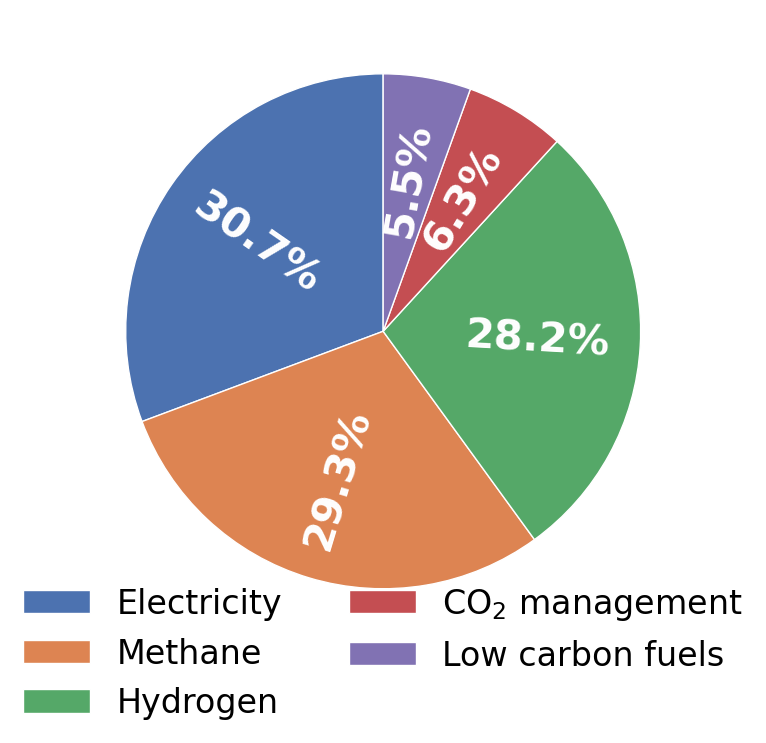

In [15]:
# =======================
# Data
# =======================

labels = [
    "Electricity",
    "Methane",
    "Hydrogen",
    "CO$_2$ management",
    "Low carbon fuels"
]

values = np.array([
    30.7,
    29.3,
    28.2,
    6.3,
    5.5
])

colors = [
    "#4C72B0",  # Electricity
    "#DD8452",  # Methane
    "#55A868",  # Hydrogen
    "#C44E52",  # CO2
    "#8172B3",  # E-fuels
]

# =======================
# Figure
# =======================

fig, ax = plt.subplots(figsize=(8, 8))

wedges, _ = ax.pie(
    values,
    startangle=90,
    colors=colors,
    radius=1,
    wedgeprops=dict(edgecolor="white", linewidth=1)
)

# =======================
# Radial percentage labels
# =======================

for label, wedge, value in zip(labels, wedges, values):

    # Central angle of wedge
    angle = (wedge.theta1 + wedge.theta2) / 2
    angle_rad = np.deg2rad(angle)

    # --- Position along radius ---
    r_text = 0.60
    x = r_text * np.cos(angle_rad)
    y = r_text * np.sin(angle_rad)

    # --- RADIAL rotation ---
    rotation = angle

    # --- Flip text if upside down (blue & green automatically handled) ---
    if 90 < rotation < 270:
        rotation += 180

    ax.text(
        x,
        y,
        f"{value:.1f}%",
        ha="center",
        va="center",
        rotation=rotation,
        rotation_mode="anchor",
        fontsize=30,
        color="white",
        fontweight="bold"
    )

# =======================
# Legend
# =======================

ax.legend(
    wedges,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.15),
    ncol=2,
    frameon=False,
    fontsize=24
)

ax.set(aspect="equal")
plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,'system_cost_breakdown.pdf'), dpi=300, bbox_inches='tight')
plt.show()


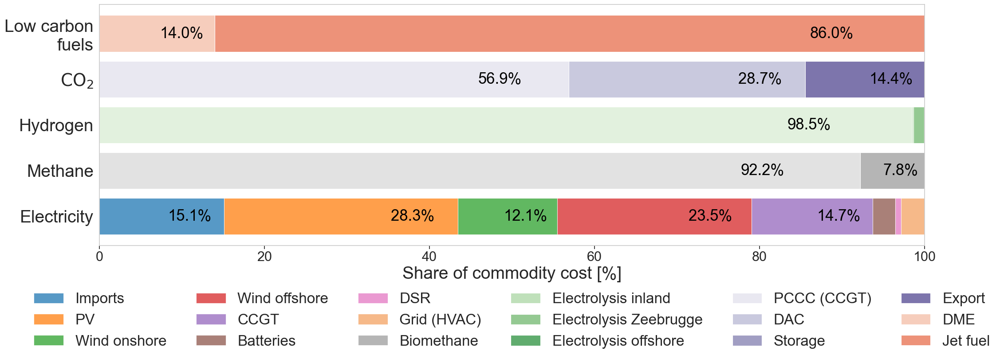

In [16]:
# =========================================================
# ====================== IMPORTS ==========================
# =========================================================
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import seaborn as sns

# =========================================================
# ============== GLOBAL FIGURE STYLE (TFE) ================
# =========================================================
sns.set_theme(style="whitegrid")

mpl.rcParams.update({
    "font.size": 28,
    "axes.labelsize": 28,
    "axes.titlesize": 28,
    "xtick.labelsize": 22,
    "ytick.labelsize": 28,
    "legend.fontsize": 28,
    "figure.titlesize": 28,
})

# =========================================================
# ========== DEFINITION DES COUTS PAR COMMODITE ============
# =========================================================
data = {
    "Electricity": {
        "Imports": (
            sys.FRANCE.cost
            + sys.DEUTSCHLAND.cost
            + sys.DENMARK.cost
            + sys.UNITED_KINGDOM.cost
            + sys.NETHERLANDS.cost
            + sys.LUXEMBOURG.cost
        ),
        "PV": sys.INLAND.PV.cost,
        "Wind onshore": sys.INLAND.WIND_ONSHORE.cost,
        "Wind offshore": sys.OFFSHORE.WIND_OFFSHORE.cost,
        "CCGT": sys.INLAND.CCGT.cost,
        "Batteries": (
            sys.INLAND.BATTERIES.cost
            + sys.ZEEBRUGGE.BATTERIES.cost
            + sys.OFFSHORE.BATTERIES.cost
        ),
        "DSR": (
            sys.INLAND.LOAD_SHEDDING_1.cost
            + sys.INLAND.LOAD_SHEDDING_2.cost
            + sys.INLAND.LOAD_SHEDDING_4.cost
            + sys.INLAND.LOAD_SHEDDING_8.cost
            + sys.INLAND.LOAD_SHEDDING_UNLIM.cost
            + sys.INLAND.LOAD_SHIFTING.cost
        ),
        "Grid (HVAC)": (
            sys.HV_OFF_ZB.cost
            + sys.HV_ZB_INL.cost
        ),
    },

    "Methane": {
        "Imports": (
            sys.INLAND.NG_INTERCONNECTION_DE.cost
            + sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.cost
            + sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.cost
        ),
        "Biomethane": sys.INLAND.BIOMETHANE.cost,
    },

    "Hydrogen": {
        "Imports": sys.INLAND.H2_INTERCONNECTION_NL.cost,
        "Electrolysis inland": (
            sys.INLAND.ELECTROLYSIS_PEM.cost
            + sys.INLAND.ELECTROLYSIS_AEC.cost
        ),
        "Electrolysis Zeebrugge": (
            sys.ZEEBRUGGE.ELECTROLYSIS_PEM.cost
            + sys.ZEEBRUGGE.ELECTROLYSIS_AEC.cost
        ),
        "Electrolysis offshore": sys.OFFSHORE.ELECTROLYSIS_PEM.cost,
    },

    r"$\mathrm{CO_2}$": {
        "PCCC (CCGT)": sys.INLAND.PCCC_CCGT.cost,
        "DAC": sys.INLAND.DAC.cost,
        "Storage": sys.INLAND.CO2_STORAGE.cost,
        "Export": sys.INLAND.CO2_EXPORT.cost,
    },

    "Low carbon fuels": {
        "DME": sys.INLAND.DME_PLANTS.cost,
        "Jet fuel": sys.INLAND.JET_FUEL_PLANTS.cost,
    },
}

# =========================================================
# ============== DATAFRAME EN POURCENTAGE =================
# =========================================================
df = pd.DataFrame(data).fillna(0)
df_pct = df.div(df.sum(axis=0), axis=1) * 100

# =========================================================
# ================= PALETTES DE COULEURS ==================
# =========================================================
palettes = {
    "Electricity": plt.cm.tab10.colors,
    "Hydrogen": sns.color_palette("Greens", 6, desat=0.8),
    "Methane": sns.color_palette("Greys", 4, desat=0.8),
    r"$\mathrm{CO_2}$": sns.color_palette("Purples", 5, desat=0.8),
    "Low carbon fuels": sns.color_palette("Reds", 4, desat=0.8),
}

grid_color = "#f4a261"
alpha_elec = 0.75
threshold = 7.0

# =========================================================
# ============ STACKED BAR HORIZONTAL =====================
# =========================================================
fig, ax = plt.subplots(figsize=(24, 8))

legend_handles = []
legend_labels = []

for commodity in df_pct.columns:
    left = 0
    techs = df_pct.index[df_pct[commodity] > 0]
    colors = palettes[commodity][:len(techs)]

    for tech, color in zip(techs, colors):
        value = df_pct.loc[tech, commodity]
        bar_color = grid_color if tech == "Grid (HVAC)" else color

        bar = ax.barh(
            commodity,
            value,
            left=left,
            color=bar_color,
            alpha=alpha_elec if commodity == "Electricity" else 1.0,
            edgecolor="white",
            linewidth=0.8,
            label=tech
        )

        if tech not in legend_labels:
            legend_handles.append(bar[0])
            legend_labels.append(tech)

        if value >= threshold:
            ax.text(
                left + 0.9 * value,
                commodity,
                f"{value:.1f}%",
                va="center",
                ha="right",
                fontsize=25,
                color="black"
            )

        left += value

# =========================================================
# ======================= FORMAT ==========================
# =========================================================
ax.set_xlim(0, 100)
ax.set_xlabel("Share of commodity cost [%]")

# ---- X ticks en haut uniquement
# ax.xaxis.tick_top()
ax.xaxis.set_label_position("bottom")
ax.tick_params(axis="x", bottom=True, top=False)
ax.grid(False, which="both", axis="both")
False

ax.set_ylabel("")

# ---- Fixer explicitement les ticks AVANT de changer les labels
yticks = ax.get_yticks()
ax.set_yticks(yticks)

ax.set_yticklabels([
    "Electricity",
    "Methane",
    "Hydrogen",
    r"$\mathrm{CO_2}$",
    "Low carbon\nfuels",
])

ax.legend(
    legend_handles,
    legend_labels,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.14),
    ncol=6,
    frameon=False, fontsize = 24
)

# plt.tight_layout(rect=[0, 0.1, 1, 1])
plt.subplots_adjust(bottom=0.2)
plt.savefig(
    os.path.join(scenario_result_folder,"cost_structure_percentage_breakdown.pdf"),
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.1
)

plt.show()


## Electricity 

#### Not served

In [17]:
load_shed_1 = sys.INLAND.LOAD_SHEDDING_1.load_reduction
load_shed_2 = sys.INLAND.LOAD_SHEDDING_2.load_reduction
load_shed_4 = sys.INLAND.LOAD_SHEDDING_4.load_reduction
load_shed_8 = sys.INLAND.LOAD_SHEDDING_8.load_reduction
load_shed_24 = sys.INLAND.LOAD_SHEDDING_UNLIM.load_reduction
load_shift_red = sys.INLAND.LOAD_SHIFTING.load_reduction
load_shift_inc = sys.INLAND.LOAD_SHIFTING.load_increase

print(colored('\nLOAD SHEDDING:', 'green', attrs=['bold', 'underline']))
print('Total load shedding 1h (GWh):', round(-sum(load_shed_1),2))
print('Total load shedding 2h (GWh):', round(-sum(load_shed_2),2))
print('Total load shedding 4h (GWh):', round(-sum(load_shed_4),2))
print('Total load shedding 8h (GWh):', round(-sum(load_shed_8),2))
print('Total load shedding 24h (GWh):', round(-sum(load_shed_24),2))
print('Total load shedding all types (GWh):', round(-sum(load_shed_1) - sum(load_shed_2) - sum(load_shed_4) - sum(load_shed_8) - sum(load_shed_24),2))
 
print(colored('\nLOAD SHIFTING:', 'green', attrs=['bold', 'underline']))
print('Total load reduction (GWh):', round(-sum(load_shift_red),2))


print(colored('\nSummary:', 'green', attrs=['bold', 'underline']))
print("Januarty load shedding 24h (GWh):", round(-sum(load_shed_24[0:31*24]),2))
print("February load shedding 24h (GWh):", round(-sum(load_shed_24[31*24:59*24]),2))


LOAD SHEDDING:
Total load shedding 1h (GWh): -0.26
Total load shedding 2h (GWh): -1.78
Total load shedding 4h (GWh): -4.27
Total load shedding 8h (GWh): -6.13
Total load shedding 24h (GWh): -36.45
Total load shedding all types (GWh): -48.89

LOAD SHIFTING:
Total load reduction (GWh): -44.66

Summary:
Januarty load shedding 24h (GWh): -25.5
February load shedding 24h (GWh): -10.95


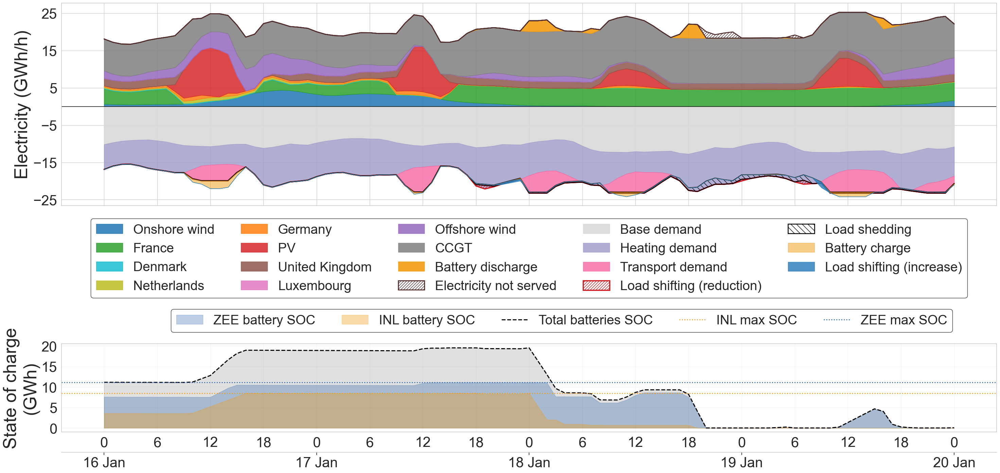

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== GLOBAL STYLE ======================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 26,
    "xtick.labelsize": 30,
    "ytick.labelsize": 30,
    "legend.fontsize": 28
})

# =========================================================
# ===================== TIME WINDOW =======================
# =========================================================
START = 432 - 48   # 16 Jan
END   = 481        # 20 Jan (excluded)

def z_hourly(ts, start=START, end=END):
    return np.array(ts[start:end])

# =========================================================
# ===================== ELECTRICITY NOT SERVED ============
# =========================================================
e_ens = z_hourly(
    model_dict["solution"]["elements"]["INLAND"]["variables"]["e_ens"]["values"]
)

# =========================================================
# ===================== LOAD FLEXIBILITY ==================
# =========================================================
load_shed = (
    z_hourly(sys.INLAND.LOAD_SHEDDING_1.load_reduction)
  + z_hourly(sys.INLAND.LOAD_SHEDDING_2.load_reduction)
  + z_hourly(sys.INLAND.LOAD_SHEDDING_4.load_reduction)
  + z_hourly(sys.INLAND.LOAD_SHEDDING_8.load_reduction)
  + z_hourly(sys.INLAND.LOAD_SHEDDING_UNLIM.load_reduction)
)

load_shift_red = z_hourly(sys.INLAND.LOAD_SHIFTING.load_reduction)
load_shift_inc = z_hourly(sys.INLAND.LOAD_SHIFTING.load_increase)

# =========================================================
# ===================== DEMAND ============================
# =========================================================
el_base = z_hourly(sys.demand_el)
el_ht   = z_hourly(sys.demand_el_ht)
el_tr   = z_hourly(sys.INLAND.demand_el_tr)

# =========================================================
# ===================== SUPPLY ============================
# =========================================================
order = ["on","fr","dk","nl","de","pv","uk","lu","off","ccgt"]
labels = [
    "Onshore wind","France","Denmark","Netherlands","Germany",
    "PV","United Kingdom","Luxembourg","Offshore wind","CCGT"
]

colors = {
    "on": "#1f77b4", "fr": "#2ca02c", "dk": "#17becf", "nl": "#bcbd22",
    "de": "#ff7f0e", "pv": "#d62728", "uk": "#8c564b", "lu": "#e377c2",
    "off": "#9467bd", "ccgt": "#7f7f7f"
}

supply_data = {
    "on": z_hourly(sys.INLAND.WIND_ONSHORE.e_produced),
    "pv": z_hourly(sys.INLAND.PV.e_produced),
    "off": z_hourly(sys.OFFSHORE.WIND_OFFSHORE.e_produced) * 0.93 * 0.93,
    "ccgt": z_hourly(sys.INLAND.CCGT.e_produced),
    "fr": z_hourly(sys.FRANCE.e_imported),
    "de": z_hourly(sys.DEUTSCHLAND.e_imported),
    "nl": z_hourly(sys.NETHERLANDS.e_imported),
    "dk": z_hourly(sys.DENMARK.e_imported) * 0.93,
    "uk": z_hourly(sys.UNITED_KINGDOM.e_imported) * 0.93,
    "lu": z_hourly(sys.LUXEMBOURG.e_imported),
}

# =========================================================
# ===================== BATTERIES =========================
# =========================================================
ORANGE = "#f39c12"

batt_char = (
    z_hourly(sys.INLAND.BATTERIES.e_charged)
  + z_hourly(sys.ZEEBRUGGE.BATTERIES.e_charged)
)

batt_disc = (
    z_hourly(sys.INLAND.BATTERIES.e_discharged)
  + z_hourly(sys.ZEEBRUGGE.BATTERIES.e_discharged)
)

soc_batt_inl = z_hourly(sys.INLAND.BATTERIES.state_of_charge)
soc_batt_zee = z_hourly(sys.ZEEBRUGGE.BATTERIES.state_of_charge)
soc_batt_tot = soc_batt_inl + soc_batt_zee

max_soc_inl = np.max(sys.INLAND.BATTERIES.state_of_charge)
max_soc_zee = np.max(sys.ZEEBRUGGE.BATTERIES.state_of_charge)

# =========================================================
# ===================== TIME AXIS =========================
# =========================================================
T = len(el_base)
t = np.arange(T)

hour_ticks  = np.arange(0, T, 6)
hour_labels = [str(int(h % 24)) for h in hour_ticks]

day_ticks  = [0, 24, 48, 72, 96]
day_labels = ["16 Jan", "17 Jan", "18 Jan", "19 Jan", "20 Jan"]

# =========================================================
# ===================== FIGURE ============================
# =========================================================
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(32, 16),
    sharex=True,
    gridspec_kw={"height_ratios": [2.3, 1], "hspace": 0.95}
)

# =========================================================
# ===================== TOP: BALANCE ======================
# =========================================================
pos = np.zeros(T)

for k, lab in zip(order, labels):
    ax1.fill_between(t, pos, pos + supply_data[k],
                     color=colors[k], alpha=0.85, label=lab)
    pos += supply_data[k]

ax1.fill_between(t, pos, pos + batt_disc,
                 color=ORANGE, alpha=0.9, label="Battery discharge")
pos += batt_disc

ax1.fill_between(t, pos, pos + e_ens,
                 facecolor="none", edgecolor="#502c2c",
                 hatch="////", linewidth=2.0,
                 label="Electricity not served")
pos += e_ens

neg = np.zeros(T)

ax1.fill_between(t, -neg, -(neg + el_base),
                 color="#d9d9d9", alpha=0.9, label="Base demand")
neg += el_base

ax1.fill_between(t, -neg, -(neg + el_ht),
                 color="#9e9ac8", alpha=0.8, label="Heating demand")
neg += el_ht

ax1.fill_between(t, -neg, -(neg + el_tr),
                 color="#f768a1", alpha=0.8, label="Transport demand")
neg += el_tr

ax1.fill_between(t, -neg, -(neg - load_shift_red),
                 facecolor="none", edgecolor="#cb181d",
                 hatch="////", linewidth=2.5,
                 label="Load shifting (reduction)")
neg -= load_shift_red

ax1.fill_between(t, -neg, -(neg - load_shed),
                 facecolor="none", edgecolor="black",
                 hatch="\\\\", linewidth=1.8,
                 label="Load shedding")
neg -= load_shed

ax1.fill_between(t, -neg, -(neg + batt_char),
                 color=ORANGE, alpha=0.5,
                 label="Battery charge")
neg += batt_char

ax1.fill_between(t, -neg, -(neg + load_shift_inc),
                 color="#3182bd", alpha=0.85,
                 label="Load shifting (increase)")
neg += load_shift_inc

ax1.axhline(0, color="black", linewidth=1.1)
ax1.set_ylabel("Electricity (GWh/h)", fontsize = 38)
ax1.set_yticks(np.arange(-25, 26, 10))

# =========================================================
# ===================== BOTTOM: SOC =======================
# =========================================================
ax2.fill_between(t, 0, soc_batt_tot,
                 color="black", alpha=0.12)

ax2.fill_between(t, 0, soc_batt_zee,
                 color="#2963aa", alpha=0.30,
                 label="ZEE battery SOC")

ax2.fill_between(t, 0, soc_batt_inl,
                 color=ORANGE, alpha=0.35,
                 label="INL battery SOC")

ax2.plot(t, soc_batt_tot,
         color="black", linewidth=2.2,
         linestyle="--", label="Total batteries SOC")

ax2.axhline(max_soc_inl, color=ORANGE,
            linestyle=":", linewidth=2,
            label="INL max SOC")

ax2.axhline(max_soc_zee, color="#2963aa",
            linestyle=":", linewidth=2,
            label="ZEE max SOC")

ax2.set_ylabel("State of charge\n(GWh)", fontsize = 38)
ax2.grid(True, alpha=0.2)

ax2.set_yticks(np.arange(0, 21, 5))

ax2.set_xticks(hour_ticks)
ax2.set_xticklabels(hour_labels, fontsize=30)

ax_days = ax2.secondary_xaxis(-0.23)
ax_days.set_xticks(day_ticks)
ax_days.set_xticklabels(day_labels, fontsize=30)


# =========================================================
# ===================== LEGENDS (CENTER) ==================
# =========================================================
# Top legend (balance / supply / demand)
handles_top, labels_top = ax1.get_legend_handles_labels()
fig.legend(
    handles_top, labels_top,
    ncol=5,
    loc="center",
    bbox_to_anchor=(0.50, 0.46),
    frameon=True, facecolor="white",
        edgecolor="black"
)

# Bottom legend (SOC)
handles_bot, labels_bot = ax2.get_legend_handles_labels()
fig.legend(
    handles_bot, labels_bot,
    ncol=7,
    loc="center",
    bbox_to_anchor=(0.53, 0.345),
    frameon=True, facecolor="white",
        edgecolor="black"
)

# =========================================================
# ===================== SAVE ==============================
# =========================================================
fig.subplots_adjust(left=0.07, right=0.93, top=0.93, bottom=0.14)
plt.savefig(os.path.join(scenario_result_folder,"electricity_balance_flexibility_ens.pdf"), dpi=300)
plt.show()


#### OFFSHORE  

In [19]:
wind_off = sys.OFFSHORE.WIND_OFFSHORE.e_produced
print('Offshore wind production (GWh):', round(sum(wind_off),2))
wind_off_curt = sys.OFFSHORE.WIND_OFFSHORE.e_curtailed
print('Offshore wind curtailment (GWh):', round(sum(wind_off_curt),2))
hvac_off_zee = sys.HV_OFF_ZB.e_forward_out
print('Offshore HVAC export to Zeebrugge (GWh):', round(sum(hvac_off_zee),2))
hvac_zee_off = sys.HV_OFF_ZB.e_reverse_in
print('Offshore HVAC import from Zeebrugge (GWh):', round(sum(hvac_zee_off),2))
print('')
off_elec_cons = sys.OFFSHORE.search('e_consumed')
total_cons = 0
for key, data in off_elec_cons.items():
    total = round(sum(data),2)
    print(f'Offshore electricity consumption for {key} (GWh): {total}')
    total_cons += total
print('Offshore electricity consumption (GWh):', round(total_cons,2))
print('')

print('Electricity entering HVAC from Zeebrugge (GWh):', round(sum(sys.HV_OFF_ZB.e_forward_in),2))
print('Losses in HVAC (GWh):', round(sum(sys.HV_OFF_ZB.e_forward_in) - sum(hvac_off_zee),2))

Offshore wind production (GWh): 28037.88
Offshore wind curtailment (GWh): 899.67
Offshore HVAC export to Zeebrugge (GWh): 25883.62
Offshore HVAC import from Zeebrugge (GWh): 16.12

Offshore electricity consumption for DESALINATION (GWh): 0.17
Offshore electricity consumption for ELECTROLYSIS_PEM (GWh): 218.4
Offshore electricity consumption for H2O_STORAGE (GWh): 0.01
Offshore electricity consumption for H2_STORAGE (GWh): 0.0
Offshore electricity consumption (GWh): 218.58

Electricity entering HVAC from Zeebrugge (GWh): 27831.85
Losses in HVAC (GWh): 1948.23


#### ZEEBRUGGE

HV_OFF_ZB.e_forward_out[t] - HV_OFF_ZB.e_reverse_in[t] + DENMARK.e_imported[t] - DENMARK.e_exported[t] + UNITED_KINGDOM.e_imported[t] - UNITED_KINGDOM.e_exported[t] 
    + ZEEBRUGGE.e_balanced[t] == HV_ZB_INL.e_forward_in[t] - HV_ZB_INL.e_reverse_out[t] + PIPE_H2_ZB_INL.e_consumed[t];

In [20]:
hv_off_zee = sys.HV_OFF_ZB.e_forward_out
print('Total electricity exported offshore (GWh):', round(sum(hv_off_zee),2))
hv_zee_off = sys.HV_OFF_ZB.e_reverse_in
print('Total electricity imported to offshore (GWh):', round(sum(hv_zee_off),2))
den = sys.DENMARK.e_imported
print('Total electricity imported Denmark (GWh):', round(sum(den),2))
uk = sys.UNITED_KINGDOM.e_imported
print('Total electricity imported UK (GWh):', round(sum(uk),2))
zee_bal = sys.ZEEBRUGGE.e_balanced
print('Total electricity balanced in Zeebrugge (GWh):', round(sum(zee_bal),2))
pipe_h2 = sys.PIPE_H2_ZB_INL.e_consumed
print('Total hydrogen consumed by H2 pipeline (GWh):', round(sum(pipe_h2),2))
hv_inl_zee = sys.HV_ZB_INL.e_reverse_out
print('Total electricity imported to Zeebrugge (GWh):', round(sum(hv_inl_zee),2))
print('Sum of electricity exported offshore and imported (GWh):', round(sum(hv_off_zee) - sum(hv_zee_off) + sum(den) + sum(uk) + sum(zee_bal) - sum(pipe_h2) + sum(hv_inl_zee),2))
hv_zee_inl = sys.HV_ZB_INL.e_forward_in
print('Total electricity imported to Inland (GWh):', round(sum(hv_zee_inl),2))


Total electricity exported offshore (GWh): 25883.62
Total electricity imported to offshore (GWh): 16.12
Total electricity imported Denmark (GWh): 926.32
Total electricity imported UK (GWh): 4753.18
Total electricity balanced in Zeebrugge (GWh): -3084.26
Total hydrogen consumed by H2 pipeline (GWh): 33.03
Total electricity imported to Zeebrugge (GWh): 1262.53
Sum of electricity exported offshore and imported (GWh): 29692.24
Total electricity imported to Inland (GWh): 29692.24


In [21]:
hv_zee_inl_in = sys.HV_ZB_INL.e_forward_in
print('Total electricity imported to Inland IN (GWh):', round(sum(hv_zee_inl_in),2))
hv_zee_inl_out = sys.HV_ZB_INL.e_forward_out
print('Total electricity imported to Inland OUT (GWh):', round(sum(hv_zee_inl_out),2)) 
hv_inl_zee_in = sys.HV_ZB_INL.e_reverse_in
print('Total electricity imported to Zeebrugge IN (GWh):', round(sum(hv_inl_zee_in),2)) 
hv_inl_zee_out = sys.HV_ZB_INL.e_reverse_out
print('Total electricity imported to Zeebrugge OUT (GWh):', round(sum(hv_inl_zee_out),2)) 

Total electricity imported to Inland IN (GWh): 29692.24
Total electricity imported to Inland OUT (GWh): 27613.78
Total electricity imported to Zeebrugge IN (GWh): 1357.56
Total electricity imported to Zeebrugge OUT (GWh): 1262.53


In [22]:
zee_bal = sys.ZEEBRUGGE.e_balanced
print('Total electricity balanced in Zeebrugge (GWh):', round(sum(zee_bal),2))
bat_disch = sys.ZEEBRUGGE.BATTERIES.e_discharged
print('Total electricity discharged from batteries in Zeebrugge (GWh):', round(sum(bat_disch),2))
bat_char = sys.ZEEBRUGGE.BATTERIES.e_charged
print('Total electricity charged to batteries in Zeebrugge (GWh):', round(-sum(bat_char),2))
loss_bat = sum(bat_char) - sum(bat_disch)
print('Total electricity losses from batteries in Zeebrugge (GWh):', round(-loss_bat,2))
h2_stor = sys.ZEEBRUGGE.H2_STORAGE.e_consumed
print('Total electricity consumed by hydrogen storage in Zeebrugge (GWh):', round(-sum(h2_stor),2))
meth = sys.ZEEBRUGGE.METHANATION.e_consumed
print('Total electricity consumed by methanation in Zeebrugge (GWh):', round(-sum(meth),2))
ekectricity_balance_zee = sum(zee_bal) + sum(bat_disch) + sum(bat_char) + sum(h2_stor) + sum(meth)
pem = sys.ZEEBRUGGE.ELECTROLYSIS_PEM.e_consumed
print('Total electricity consumed by PEM electrolysis in Zeebrugge (GWh):', round(-sum(pem),2))
aec = sys.ZEEBRUGGE.ELECTROLYSIS_AEC.e_consumed
print('Total electricity consumed by AEC electrolysis in Zeebrugge (GWh):', round(-sum(aec),2))
dac = sys.ZEEBRUGGE.DAC.e_consumed
print('Total electricity consumed by DAC in Zeebrugge (GWh):', round(-sum(dac),2))

Total electricity balanced in Zeebrugge (GWh): -3084.26
Total electricity discharged from batteries in Zeebrugge (GWh): 1402.57
Total electricity charged to batteries in Zeebrugge (GWh): -1729.17
Total electricity losses from batteries in Zeebrugge (GWh): -326.6
Total electricity consumed by hydrogen storage in Zeebrugge (GWh): -0.0
Total electricity consumed by methanation in Zeebrugge (GWh): -0.0
Total electricity consumed by PEM electrolysis in Zeebrugge (GWh): -2757.66
Total electricity consumed by AEC electrolysis in Zeebrugge (GWh): -0.0
Total electricity consumed by DAC in Zeebrugge (GWh): -0.0


### INLAND

- Prod

In [23]:
wind_off = sys.OFFSHORE.WIND_OFFSHORE.e_produced
wind_off_zee = sys.HV_OFF_ZB.e_forward_out 
wind_off_inl = [i * 0.93 for i in wind_off_zee]  # 7% losses in HVDC
wind_on = sys.INLAND.WIND_ONSHORE.e_produced
pv = sys.INLAND.PV.e_produced
ccgt = sys.INLAND.CCGT.e_produced 

print('Total electricity production (TWh):', round(sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000 + sum(ccgt)/1000,2))

print('\nTotal offshore wind production (TWh):', round(sum(wind_off)/1000,2))
print('Total offshore wind to Zeebrugge (TWh):', round(sum(wind_off_zee)/1000,2))
print('Total offshore wind to Inland (TWh):', round(sum(wind_off_inl)/1000,2))
print('Total offshore wind to Inland (TWh):', round(sum(wind_off_inl),2))
print('Percentage of offshore wind production (%):', round(100 * sum(wind_off_inl)/1000 / (sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000 + sum(ccgt)/1000),1))

print('\nTotal onshore wind production (TWh):', round(sum(wind_on)/1000,2))
print('Percentage of onshore wind production (%):', round(100 * sum(wind_on)/1000 / (sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000 + sum(ccgt)/1000),1))

print('\nTotal PV production (TWh):', round(sum(pv)/1000,2))
print('Percentage of PV production (%):', round(100 * sum(pv)/1000 / (sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000 + sum(ccgt)/1000),1))

print('\nTotal CCGT production (TWh):', round(sum(ccgt)/1000,2))
print('Percentage of CCGT production (%):', round(100 * sum(ccgt)/1000 / (sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000 + sum(ccgt)/1000),1))

print('\nTotal renewable production (TWh):', round(sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000,2))
print('Percentage of renewable production (%):', round(100 * (sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000) / (sum(wind_off_inl)/1000 + sum(wind_on)/1000 + sum(pv)/1000 + sum(ccgt)/1000),1))


Total electricity production (TWh): 135.95

Total offshore wind production (TWh): 28.04
Total offshore wind to Zeebrugge (TWh): 25.88
Total offshore wind to Inland (TWh): 24.07
Total offshore wind to Inland (TWh): 24071.77
Percentage of offshore wind production (%): 17.7

Total onshore wind production (TWh): 17.75
Percentage of onshore wind production (%): 13.1

Total PV production (TWh): 30.56
Percentage of PV production (%): 22.5

Total CCGT production (TWh): 63.57
Percentage of CCGT production (%): 46.8

Total renewable production (TWh): 72.38
Percentage of renewable production (%): 53.2


- Capacity

In [24]:
wind_off_cap = sys.OFFSHORE.WIND_OFFSHORE.capacity
wind_off_cap_max = sys.OFFSHORE.WIND_OFFSHORE.max_capacity

wind_on_cap = sys.INLAND.WIND_ONSHORE.capacity
wind_on_cap_max = sys.INLAND.WIND_ONSHORE.max_capacity

pv_cap = sys.INLAND.PV.capacity
pv_cap_max = sys.INLAND.PV.max_capacity

ccgt_cap = sys.INLAND.CCGT.capacity

print('Offshore wind installed capacity (GW):', round(wind_off_cap,2))
print('Percentage of offshore wind capacity installed compared to max capacity (%):', round(100 * wind_off_cap / wind_off_cap_max,2))

print('\nOnshore wind installed capacity (GW):', round(wind_on_cap,2))
print('Percentage of onshore wind capacity installed compared to max capacity (%):', round(100 * wind_on_cap / wind_on_cap_max,2))

print('\nPV installed capacity (GW):', round(pv_cap,2))
print('Percentage of PV capacity installed compared to max capacity (%):', round(100 * pv_cap / pv_cap_max,2))

print('\nCCGT installed capacity (GW):', round(ccgt_cap,2))

Offshore wind installed capacity (GW): 8.0
Percentage of offshore wind capacity installed compared to max capacity (%): 100.0

Onshore wind installed capacity (GW): 9.0
Percentage of onshore wind capacity installed compared to max capacity (%): 100.0

PV installed capacity (GW): 30.13
Percentage of PV capacity installed compared to max capacity (%): 60.27

CCGT installed capacity (GW): 12.11


- Levelized cost

In [25]:
wind_off_cost = sys.OFFSHORE.WIND_OFFSHORE.cost # M€
wind_off_cost_tr = wind_off_cost + sys.HV_OFF_ZB.cost
wind_off_prod = sum(sys.OFFSHORE.WIND_OFFSHORE.e_produced) # GWh
wind_off_pro_real = 0.93 * sum(sys.HV_OFF_ZB.e_forward_out) # GWh
print('Offshore wind LCOE (€/MWh):', round(1000*wind_off_cost/wind_off_prod,2))
print('Offshore wind + transmission LCOE (€/MWh):', round(1000*wind_off_cost_tr/wind_off_pro_real,2))
print('')

wind_on_cost = sys.INLAND.WIND_ONSHORE.cost # M€
wind_on_prod = sum(sys.INLAND.WIND_ONSHORE.e_produced) # GWh
print('Onshore wind LCOE (€/MWh):', round(1000*wind_on_cost/wind_on_prod,2))
print('')

pv_cost = sys.INLAND.PV.cost # M€
pv_prod = sum(sys.INLAND.PV.e_produced) # GWh
print('PV LCOE (€/MWh):', round(1000*pv_cost/pv_prod,2))
print('')

ccgt_cost = sys.INLAND.CCGT.cost # M€
ng_dual = sys.INLAND_BALANCE.methane 
ng_cons = sys.INLAND.CCGT.ng_consumed  # GWh
ng_cost = [p * c for p, c in zip(ng_dual, ng_cons)] # M€
ccgt_prod = sum(sys.INLAND.CCGT.e_produced) # GWh
total_ccgt_cost = ccgt_cost + sum(ng_cost) 
print('Percentage of natural gas cost in CCGT cost (%):', round(100 * sum(ng_cost) / total_ccgt_cost,2))
print('CCGT LCOE considering ng cost(€/MWh):', round(1000*total_ccgt_cost/ccgt_prod,2))
print('')



Offshore wind LCOE (€/MWh): 58.37
Offshore wind + transmission LCOE (€/MWh): 74.48

Onshore wind LCOE (€/MWh): 47.3

PV LCOE (€/MWh): 64.42

Percentage of natural gas cost in CCGT cost (%): 84.0
CCGT LCOE considering ng cost(€/MWh): 100.65



- Import 

In [26]:
# France:
print(colored('\nFrance:', 'green', attrs=['bold', 'underline']))
fr_elec_cost = sys.FRANCE.import_cost * 1000
print('Import cost (€/MWh):', round(fr_elec_cost,3))
fr_elec_cap = sys.FRANCE.import_capacity
print('Import capacity (GW):', round(fr_elec_cap,3))
print('Max real capacity used (GW):', round(max(sys.FRANCE.e_imported),3))
fr_elec = sys.FRANCE.e_imported
print('Total import (TWh):', round(sum(fr_elec)/1000,3))
fr_elec_pv = sys.FRANCE.PV.e_produced
print('Total PV production in France (TWh):', round(sum(fr_elec_pv)/1000,3))
fr_elec_won = sys.FRANCE.WIND_ONSHORE.e_produced
print('Total onshore wind production in France (TWh):', round(sum(fr_elec_won)/1000,3))
fr_elec_woff = sys.FRANCE.WIND_OFFSHORE.e_produced
print('Total offshore wind production in France (TWh):', round(sum(fr_elec_woff)/1000,3))
fr_elec_nuc = sys.FRANCE.NUCLEAR.e_produced
print('Total nuclear production in France (TWh):', round(sum(fr_elec_nuc)/1000,3))
fr_elec_prod = sum(fr_elec_pv) + sum(fr_elec_won) + sum(fr_elec_woff) + sum(fr_elec_nuc)
print('Total electricity production in France (TWh):', round(fr_elec_prod/1000,3))
print('Percentage of import compared to production in France (%):', round(100 * sum(fr_elec) / fr_elec_prod,3))


# Denmark:
print(colored('\nDenmark:', 'magenta', attrs=['bold', 'underline']))
dk_elec_cost = sys.DENMARK.import_cost * 1000
print('Import cost (€/MWh):', round(dk_elec_cost,3))
dk_elec_cap = sys.DENMARK.import_capacity
print('Import capacity (GW):', round(dk_elec_cap,3))
print('Max real capacity used (GW):', round(max(sys.DENMARK.e_imported),3))
dk_elec = sys.DENMARK.e_imported 
print('Total import to Zeebrugge (TWh):', round(sum(dk_elec)/1000,3))
print('Total import (TWh):', round(0.93*sum(dk_elec)/1000,3))
dk_elec_pv = sys.DENMARK.PV.e_produced
print('Total PV production in Denmark (TWh):', round(sum(dk_elec_pv)/1000,3))
dk_elec_won = sys.DENMARK.WIND_ONSHORE.e_produced
print('Total onshore wind production in Denmark (TWh):', round(sum(dk_elec_won)/1000,3))
dk_elec_woff = sys.DENMARK.WIND_OFFSHORE.e_produced
print('Total offshore wind production in Denmark (TWh):', round(sum(dk_elec_woff)/1000,3))
dk_elec_prod = sum(dk_elec_pv) + sum(dk_elec_won) + sum(dk_elec_woff)
print('Total electricity production in Denmark (TWh):', round(dk_elec_prod/1000,3))
print('Percentage of import compared to production in Denmark (%):', round(100 * sum(dk_elec) / dk_elec_prod,3))


# Netherlands:
print(colored('\nNetherlands:', 'green', attrs=['bold', 'underline']))
nl_elec_cost = sys.NETHERLANDS.import_cost * 1000
print('Import cost (€/MWh):', round(nl_elec_cost,3))
nl_elec_cap = sys.NETHERLANDS.import_capacity
print('Import capacity (GW):', round(nl_elec_cap,3))
print('Max real capacity used (GW):', round(max(sys.NETHERLANDS.e_imported),3))
nl_elec = sys.NETHERLANDS.e_imported 
print('Total import (TWh):', round(sum(nl_elec)/1000,3))
nl_elec_pv = sys.NETHERLANDS.PV.e_produced
print('Total PV production in Netherlands (TWh):', round(sum(nl_elec_pv)/1000,3))
nl_elec_won = sys.NETHERLANDS.WIND_ONSHORE.e_produced
print('Total onshore wind production in Netherlands (TWh):', round(sum(nl_elec_won)/1000,3))
nl_elec_woff = sys.NETHERLANDS.WIND_OFFSHORE.e_produced
print('Total offshore wind production in Netherlands (TWh):', round(sum(nl_elec_woff)/1000,3))
nl_elec_prod = sum(nl_elec_pv) + sum(nl_elec_won) + sum(nl_elec_woff)
print('Total electricity production in Netherlands (TWh):', round(nl_elec_prod/1000,3))
print('Percentage of import compared to production in Netherlands (%):', round(100 * sum(nl_elec) / nl_elec_prod,3))


# Deutschland:
print(colored('\nDeutschland:', 'green', attrs=['bold', 'underline']))
de_elec_cost = sys.DEUTSCHLAND.import_cost * 1000
print('Import cost (€/MWh):', round(de_elec_cost,3))
de_elec_cap = sys.DEUTSCHLAND.import_capacity
print('Import capacity (GW):', round(de_elec_cap,3))
print('Max real capacity used (GW):', round(max(sys.DEUTSCHLAND.e_imported),3))
de_elec = sys.DEUTSCHLAND.e_imported 
print('Total import (TWh):', round(sum(de_elec)/1000,3))
de_elec_pv = sys.DEUTSCHLAND.PV.e_produced
print('Total PV production in Deutschland (TWh):', round(sum(de_elec_pv)/1000,3))
de_elec_won = sys.DEUTSCHLAND.WIND_ONSHORE.e_produced
print('Total onshore wind production in Deutschland (TWh):', round(sum(de_elec_won)/1000,3))
de_elec_woff = sys.DEUTSCHLAND.WIND_OFFSHORE.e_produced
print('Total offshore wind production in Deutschland (TWh):', round(sum(de_elec_woff)/1000,3)) 
de_elec_prod = sum(de_elec_pv) + sum(de_elec_won) + sum(de_elec_woff)  
print('Total electricity production in Deutschland (TWh):', round(de_elec_prod/1000,3))
print('Percentage of import compared to production in Deutschland (%):', round(100 * sum(de_elec) / de_elec_prod,3))


# UK:
print(colored('\nUnited Kingdom:', 'magenta', attrs=['bold', 'underline']))
uk_elec_cost = sys.UNITED_KINGDOM.import_cost * 1000
print('Import cost (€/MWh):', round(uk_elec_cost,3))
uk_elec_cap = sys.UNITED_KINGDOM.import_capacity
print('Import capacity (GW):', round(uk_elec_cap,3))
print('Max real capacity used (GW):', round(max(sys.UNITED_KINGDOM.e_imported),3))
uk_elec = sys.UNITED_KINGDOM.e_imported 
print('Total import to Zeebrugge (TWh):', round(sum(uk_elec)/1000,3))
print('Total import (TWh):', round(0.93*sum(uk_elec)/1000,3))
uk_elec_pv = sys.UNITED_KINGDOM.PV.e_produced
print('Total PV production in UK (TWh):', round(sum(uk_elec_pv)/1000,3))
uk_elec_won = sys.UNITED_KINGDOM.WIND_ONSHORE.e_produced
print('Total onshore wind production in UK (TWh):', round(sum(uk_elec_won)/1000,3))
uk_elec_woff = sys.UNITED_KINGDOM.WIND_OFFSHORE.e_produced
print('Total offshore wind production in UK (TWh):', round(sum(uk_elec_woff)/1000,3))
uk_elec_nuc = sys.UNITED_KINGDOM.NUCLEAR.e_produced
print('Total nuclear production in UK (TWh):', round(sum(uk_elec_nuc)/1000,3))
uk_elec_prod = sum(uk_elec_pv) + sum(uk_elec_won) + sum(uk_elec_woff) + sum(uk_elec_nuc)
print('Total electricity production in UK (TWh):', round(uk_elec_prod/1000,3))
print('Percentage of import compared to production in UK (%):', round(100 * sum(uk_elec) / uk_elec_prod,3))


# Luxembourg:
print(colored('\nLuxembourg:', 'green', attrs=['bold', 'underline']))
lu_elec_cost = sys.LUXEMBOURG.import_cost * 1000
print('Import cost (€/MWh):', round(lu_elec_cost,3))
lu_elec_cap = sys.LUXEMBOURG.import_capacity
print('Import capacity (GW):', round(lu_elec_cap,3))
print('Max real capacity used (GW):', round(max(sys.LUXEMBOURG.e_imported),3))
lu_elec = sys.LUXEMBOURG.e_imported 
print('Total import (TWh):', round(sum(lu_elec)/1000,3))
lu_elec_pv = sys.LUXEMBOURG.PV.e_produced
print('Total PV production in Luxembourg (TWh):', round(sum(lu_elec_pv)/1000,3))
lu_elec_won = sys.LUXEMBOURG.WIND_ONSHORE.e_produced
print('Total onshore wind production in Luxembourg (TWh):', round(sum(lu_elec_won)/1000,3))
lu_elec_prod = sum(lu_elec_pv) + sum(lu_elec_won)
print('Total electricity production in Luxembourg (TWh):', round(lu_elec_prod/1000,3))
print('Percentage of import compared to production in Luxembourg (%):', round(100 * sum(lu_elec) / lu_elec_prod,3))


# Total imports:
print(colored('\nTotal imports:', 'green', attrs=['bold', 'underline']))
sum_import = (sum(fr_elec) + 0.93*sum(dk_elec) + sum(nl_elec) + sum(de_elec) + 0.93*sum(uk_elec) + sum(lu_elec))
print('Total import (TWh):', round(sum_import/1000,3))
print('Percentage France (%):', round(100 * sum(fr_elec) / sum_import,3))
print('Percentage Denmark (%):', round(100 * 0.93 * sum(dk_elec) / sum_import,3))
print('Percentage Netherlands (%):', round(100 * sum(nl_elec) / sum_import,3))
print('Percentage Deutschland (%):', round(100 * sum(de_elec) / sum_import,3))
print('Percentage UK (%):', round(100 * 0.93 * sum(uk_elec) / sum_import,3))
print('Percentage Luxembourg (%):', round(100 * sum(lu_elec) / sum_import,3))

# Full-season week ranges
dk_elec_real = [i * 0.93 for i in dk_elec]  # 7% losses in HVDC
uk_elec_real = [i * 0.93 for i in uk_elec]


France:
Import cost (€/MWh): 57.1
Import capacity (GW): 8.3
Max real capacity used (GW): 5.402
Total import (TWh): 5.534
Total PV production in France (TWh): 185.165
Total onshore wind production in France (TWh): 85.651
Total offshore wind production in France (TWh): 157.153
Total nuclear production in France (TWh): 125.47
Total electricity production in France (TWh): 553.439
Percentage of import compared to production in France (%): 1.0

Denmark:
Import cost (€/MWh): 57.6
Import capacity (GW): 2
Max real capacity used (GW): 0.379
Total import to Zeebrugge (TWh): 0.926
Total import (TWh): 0.861
Total PV production in Denmark (TWh): 20.68
Total onshore wind production in Denmark (TWh): 11.545
Total offshore wind production in Denmark (TWh): 86.869
Total electricity production in Denmark (TWh): 119.094
Percentage of import compared to production in Denmark (%): 0.778

Netherlands:
Import cost (€/MWh): 61.9
Import capacity (GW): 5.4
Max real capacity used (GW): 1.054
Total import (TWh): 

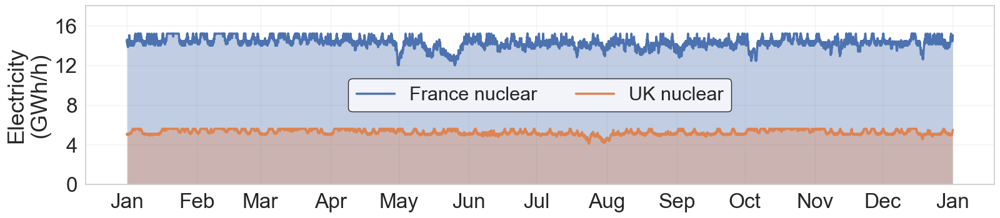

In [27]:
# =========================================================
# ===================== GLOBAL STYLE ======================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 26,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "legend.fontsize": 22
})

# =========================================================
# ===================== DATA ==============================
# =========================================================
hours = np.arange(len(sys.FRANCE.NUCLEAR.e_produced))

# =========================================================
# ===================== FIGURE ============================
# =========================================================
plt.figure(figsize=(16, 3.5))

# France nuclear
plt.plot(
    hours,
    sys.FRANCE.NUCLEAR.e_produced,
    linewidth=2.5,
    label="France nuclear"
)
plt.fill_between(
    hours,
    0,
    sys.FRANCE.NUCLEAR.e_produced,
    alpha=0.35
)

# UK nuclear
plt.plot(
    hours,
    sys.UNITED_KINGDOM.NUCLEAR.e_produced,
    linewidth=2.5,
    label="UK nuclear"
)
plt.fill_between(
    hours,
    0,
    sys.UNITED_KINGDOM.NUCLEAR.e_produced,
    alpha=0.35
)

# =========================================================
# ===================== X AXIS (MONTHS) ===================
# =========================================================
# Month start hours (non leap year)
month_hours = np.array([
    0,
    31*24,
    (31+28)*24,
    (31+28+31)*24,
    (31+28+31+30)*24,
    (31+28+31+30+31)*24,
    (31+28+31+30+31+30)*24,
    (31+28+31+30+31+30+31)*24,
    (31+28+31+30+31+30+31+31)*24,
    (31+28+31+30+31+30+31+31+30)*24,
    (31+28+31+30+31+30+31+31+30+31)*24,
    (31+28+31+30+31+30+31+31+30+31+30)*24,
    len(hours) - 1          # ← fin d’année : Jan (-1)
])

month_labels = [
    "Jan","Feb","Mar","Apr","May","Jun",
    "Jul","Aug","Sep","Oct","Nov","Dec","Jan"
]

plt.xticks(month_hours, month_labels)

# =========================================================
# ===================== LABELS ============================
# =========================================================
# plt.xlabel("Month")
plt.ylabel("Electricity\n(GWh/h)")

# =========================================================
# ===================== STYLE =============================
# =========================================================
plt.legend(loc="center",frameon=True, ncol=2,
    facecolor="white",
    edgecolor="black")

plt.grid(alpha=0.25)
plt.yticks(np.arange(0,20,4),rotation=0)
plt.ylim(0,18)

plt.margins(y=0)
plt.tight_layout(pad=0.25)

plt.savefig(
    os.path.join(scenario_result_folder,"nuclear_production.pdf"),
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.02,
    
    
)

plt.show()


### Total

In [28]:
# Demand
demand_el = sys.demand_el
demand_el_ht = sys.demand_el_ht
demand_el_tr = sys.INLAND.demand_el_tr
print(colored('\nDEMAND (TWh):', 'green', attrs=['bold', 'underline']))
print('Electricity demand (TWh):', round(sum(demand_el)/1000,2))
print('Electricity demand for Heating (TWh):', round(sum(demand_el_ht)/1000,2))
print('Electricity demand for Transport (TWh):', round(sum(demand_el_tr)/1000,2))
print('Total electricity demands (TWh):', round((sum(demand_el_ht) + sum(demand_el_tr) + sum(demand_el))/1000,2))

# Consumption breakdown
nodes_inl = sys.INLAND.search("e_consumed")
nodes_zee = sys.ZEEBRUGGE.search("e_consumed")

raw_inl = {n: getattr(sys.INLAND, n).e_consumed
            for n in nodes_inl if np.sum(getattr(sys.INLAND, n).e_consumed) > 0}

raw_zee = {n: getattr(sys.ZEEBRUGGE, n).e_consumed
            for n in nodes_zee if np.sum(getattr(sys.ZEEBRUGGE, n).e_consumed) > 0}

inl_consumers = {f"{n} (INL)": v for n, v in raw_inl.items()}
zee_consumers = {f"{n} (ZEE)": v for n, v in raw_zee.items()}
print(colored('\nConsumption breakdown (TWh):', 'green', attrs=['bold', 'underline']))
total_cons_inl = 0
total_cons_zee = 0
for i in {**inl_consumers, **zee_consumers}:
    total_cons = sum({**inl_consumers, **zee_consumers}[i])
    print(f'Consumption {i} (TWh):', round(total_cons/1000,2))
    if "(INL)" in i:
        total_cons_inl += total_cons
    else:
        total_cons_zee += total_cons
        
print('\nTotal consumption INLAND (TWh):', round(total_cons_inl/1000,2))
print('Total consumption ZEEBRUGGE (TWh):', round(total_cons_zee/1000,2))

# Production
nodes_prod = sys.INLAND.search("e_produced")
print(colored('\nProduction breakdown (TWh):', 'green', attrs=['bold', 'underline']))
for n in nodes_prod:
    total_prod = sum(getattr(sys.INLAND, n).e_produced)
    if total_prod > 0:
        print(f'Production {n} (TWh):', round(total_prod/1000,2))
print('Production WIND_OFFSHORE (TWh):', round(0.93*sum(sys.HV_OFF_ZB.e_forward_out)/1000,2))

# Import
print(colored('\nIMPORTS (TWh):', 'green', attrs=['bold', 'underline']))
total_import = 0
for country in ['FRANCE', 'DENMARK', 'NETHERLANDS', 'DEUTSCHLAND', 'UNITED_KINGDOM', 'LUXEMBOURG']:
    country_import = sum(getattr(sys, country).e_imported)
    if country in ['DENMARK', 'UNITED_KINGDOM']:
        country_import *= 0.93  # accounting for HVDC losses
    print(f'Import from {country} (TWh):', round(country_import/1000,2))
    total_import += country_import
    
# Storage
print(colored('\nSTORAGE (TWh):', 'green', attrs=['bold', 'underline']))
stor_inl_char = sys.INLAND.BATTERIES.e_charged
stor_inl_disc = sys.INLAND.BATTERIES.e_discharged
stor_zee_char = sys.ZEEBRUGGE.BATTERIES.e_charged
stor_zee_disc = sys.ZEEBRUGGE.BATTERIES.e_discharged
print('Batteries charged (INL) (TWh):', round(sum(stor_inl_char)/1000,2))
print('Batteries discharged (INL) (TWh):', round(sum(stor_inl_disc)/1000,2))
print('Losses (INL) (TWh):', round((sum(stor_inl_char) - sum(stor_inl_disc))/1000,2))
print('')
print('Batteries charged (ZEE) (TWh):', round(sum(stor_zee_char)/1000,2))
print('Batteries discharged (ZEE) (TWh):', round(sum(stor_zee_disc)/1000,2))
print('Losses (ZEE) (TWh):', round((sum(stor_zee_char) - sum(stor_zee_disc))/1000,2))


DEMAND (TWh):
Electricity demand (TWh): 82.33
Electricity demand for Heating (TWh): 30.58
Electricity demand for Transport (TWh): 16.51
Total electricity demands (TWh): 129.42

Consumption breakdown (TWh):
Consumption BIOMETHANE (INL) (TWh): 0.34
Consumption DAC (INL) (TWh): 10.47
Consumption DME_PLANTS (INL) (TWh): 0.25
Consumption ELECTROLYSIS_PEM (INL) (TWh): 0.3
Consumption JET_FUEL_PLANTS (INL) (TWh): 0.03
Consumption PCCC_CCGT (INL) (TWh): 8.21
Consumption ELECTROLYSIS_PEM (ZEE) (TWh): 2.76

Total consumption INLAND (TWh): 19.6
Total consumption ZEEBRUGGE (TWh): 2.76

Production breakdown (TWh):
Production CCGT (TWh): 63.57
Production PV (TWh): 30.56
Production WIND_ONSHORE (TWh): 17.75
Production WIND_OFFSHORE (TWh): 24.07

IMPORTS (TWh):
Import from FRANCE (TWh): 5.53
Import from DENMARK (TWh): 0.86
Import from NETHERLANDS (TWh): 2.19
Import from DEUTSCHLAND (TWh): 3.37
Import from UNITED_KINGDOM (TWh): 4.42
Import from LUXEMBOURG (TWh): 0.01

STORAGE (TWh):
Batteries charged 

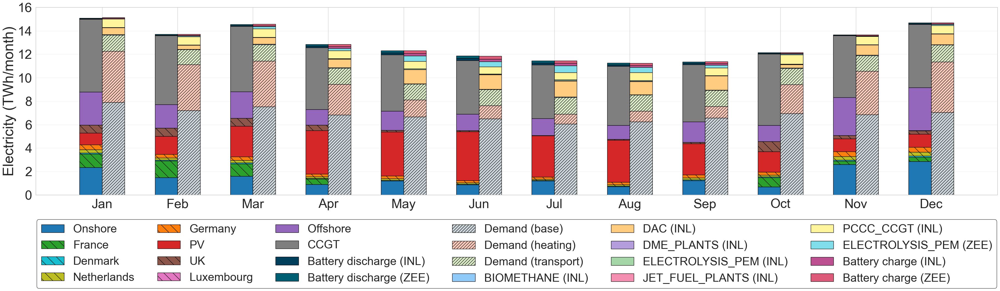

In [29]:
import matplotlib.pyplot as plt
import numpy as np

# ================= GLOBAL STYLE =================

plt.rcParams.update({
    "axes.labelsize": 38,
    "xtick.labelsize": 34,
    "ytick.labelsize": 34,
    "legend.fontsize": 30
})

# ================= COLORS =================

supply_colors = [
    '#1f77b4',  # Onshore
    '#2ca02c',  # France
    '#17becf',  # Denmark
    '#bcbd22',  # Netherlands
    '#ff7f0e',  # Germany
    '#d62728',  # PV
    '#8c564b',  # UK
    '#e377c2',  # Luxembourg
    '#9467bd',  # Offshore
    '#7f7f7f'   # CCGT
]

demand_colors = [
    '#cfd8dc',  # base
    '#ffccbc',  # heating
    '#dcedc8',  # transport
]

pastel_pool = [
    '#90caf9', '#ffcc80', '#b39ddb', '#a5d6a7',
    '#f48fb1', '#fff59d', '#80deea', '#e6ee9c'
]

battery_discharge_color = "#003f5c"
battery_charge_color    = "#bc5090"

# ================= ORDER =================

order = ["on","fr","dk","nl","de","pv","uk","lu","off","ccgt"]

labels = [
    "Onshore","France","Denmark","Netherlands","Germany",
    "PV","UK","Luxembourg","Offshore","CCGT"
]

import_hatched = ["fr","dk","nl","de","uk","lu"]

# ================= INDUSTRY =================

nodes_inl = sys.INLAND.search("e_consumed")
nodes_zee = sys.ZEEBRUGGE.search("e_consumed")

raw_inl = {
    n: getattr(sys.INLAND, n).e_consumed
    for n in nodes_inl
    if np.sum(getattr(sys.INLAND, n).e_consumed) > 0
}

raw_zee = {
    n: getattr(sys.ZEEBRUGGE, n).e_consumed
    for n in nodes_zee
    if np.sum(getattr(sys.ZEEBRUGGE, n).e_consumed) > 0
}

inl_consumers = {f"{n} (INL)": v for n, v in raw_inl.items()}
zee_consumers = {f"{n} (ZEE)": v for n, v in raw_zee.items()}

industrial_nodes = list(inl_consumers.keys()) + list(zee_consumers.keys())
industry_dict = {**inl_consumers, **zee_consumers}

# ================= BATTERIES =================

inl_batt_charge = sys.INLAND.BATTERIES.e_charged
inl_batt_discharge = sys.INLAND.BATTERIES.e_discharged
zee_batt_charge = sys.ZEEBRUGGE.BATTERIES.e_charged
zee_batt_discharge = sys.ZEEBRUGGE.BATTERIES.e_discharged

# ================= MONTH SPLIT =================

month_hours = [
    31*24, 28*24, 31*24, 30*24, 31*24, 30*24,
    31*24, 31*24, 30*24, 31*24, 30*24, 31*24
]

monthly_totals = {k: [] for k in order}
monthly_industry = {n: [] for n in industrial_nodes}

d_base, d_heat, d_tr = [], [], []
bat_discharge_inl, bat_charge_inl = [], []
bat_discharge_zee, bat_charge_zee = [], []

start = 0
for h in month_hours:
    end = start + h

    monthly_totals["on"].append(np.sum(sys.INLAND.WIND_ONSHORE.e_produced[start:end]))
    monthly_totals["fr"].append(np.sum(fr_elec[start:end]))
    monthly_totals["dk"].append(np.sum(np.array(dk_elec[start:end]) * 0.93))
    monthly_totals["nl"].append(np.sum(nl_elec[start:end]))
    monthly_totals["de"].append(np.sum(de_elec[start:end]))
    monthly_totals["pv"].append(np.sum(sys.INLAND.PV.e_produced[start:end]))
    monthly_totals["uk"].append(np.sum(np.array(uk_elec[start:end]) * 0.93))
    monthly_totals["lu"].append(np.sum(lu_elec[start:end]))
    monthly_totals["off"].append(np.sum(np.array(sys.HV_OFF_ZB.e_forward_out[start:end]) * 0.93))
    monthly_totals["ccgt"].append(np.sum(sys.INLAND.CCGT.e_produced[start:end]))

    bat_discharge_inl.append(np.sum(inl_batt_discharge[start:end]))
    bat_discharge_zee.append(np.sum(zee_batt_discharge[start:end]))
    bat_charge_inl.append(np.sum(inl_batt_charge[start:end]))
    bat_charge_zee.append(np.sum(zee_batt_charge[start:end]))

    d_base.append(np.sum(sys.demand_el[start:end]))
    d_heat.append(np.sum(sys.demand_el_ht[start:end]))
    d_tr.append(np.sum(sys.INLAND.demand_el_tr[start:end]))

    for n in industrial_nodes:
        monthly_industry[n].append(np.sum(industry_dict[n][start:end]))

    start = end

# ================= PLOT =================

plt.figure(figsize=(40, 12))
months = np.arange(12)
bw = 0.3

# -------- SUPPLY --------

bottom = np.zeros(12)

for idx, (k, lab) in enumerate(zip(order, labels)):
    hatch = "\\" if k in import_hatched else None

    plt.bar(
        months - bw/2,
        monthly_totals[k],
        bottom=bottom,
        width=bw,
        color=supply_colors[idx],
        hatch=hatch,
        edgecolor="black",
        label=lab
    )
    bottom += np.array(monthly_totals[k])

plt.bar(
    months - bw/2,
    bat_discharge_inl,
    bottom=bottom,
    width=bw,
    color=battery_discharge_color,
    edgecolor="black",
    label="Battery discharge (INL)"
)
bottom += np.array(bat_discharge_inl)

plt.bar(
    months - bw/2,
    bat_discharge_zee,
    bottom=bottom,
    width=bw,
    color="#005f73",
    edgecolor="black",
    label="Battery discharge (ZEE)"
)

# -------- DEMAND --------

d_bottom = np.zeros(12)

for vals, col, lab in zip(
    [d_base, d_heat, d_tr],
    demand_colors,
    ["Demand (base)", "Demand (heating)", "Demand (transport)"]
):
    plt.bar(
        months + bw/2,
        vals,
        bottom=d_bottom,
        width=bw,
        color=col,
        hatch="///",
        edgecolor="black",
        label=lab
    )
    d_bottom += np.array(vals)

for j, n in enumerate(industrial_nodes):
    plt.bar(
        months + bw/2,
        monthly_industry[n],
        bottom=d_bottom,
        width=bw,
        color=pastel_pool[j % len(pastel_pool)],
        edgecolor="black",
        label=n
    )
    d_bottom += np.array(monthly_industry[n])

plt.bar(
    months + bw/2,
    bat_charge_inl,
    bottom=d_bottom,
    width=bw,
    color=battery_charge_color,
    edgecolor="black",
    label="Battery charge (INL)"
)
d_bottom += np.array(bat_charge_inl)

plt.bar(
    months + bw/2,
    bat_charge_zee,
    bottom=d_bottom,
    width=bw,
    color="#de5a79",
    edgecolor="black",
    label="Battery charge (ZEE)"
)

# -------- FORMAT --------

plt.xticks(
    months,
    ["Jan","Feb","Mar","Apr","May","Jun",
     "Jul","Aug","Sep","Oct","Nov","Dec"]
)

plt.ylabel("Electricity (TWh/month)")

ax = plt.gca()
yticks = ax.get_yticks()
ax.set_yticks(yticks)
ax.set_yticklabels([f"{int(y/1000)}" for y in yticks])

ax.grid(True, axis='y', alpha=0.3)

plt.legend(
    ncol=6,
    bbox_to_anchor=(0.5, -0.1),
    loc="upper center",
    frameon=True,
    facecolor="white",
    edgecolor="black"
)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig(
    os.path.join(scenario_result_folder,"monthly_elec_balance.pdf"),
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.02
)

plt.show()


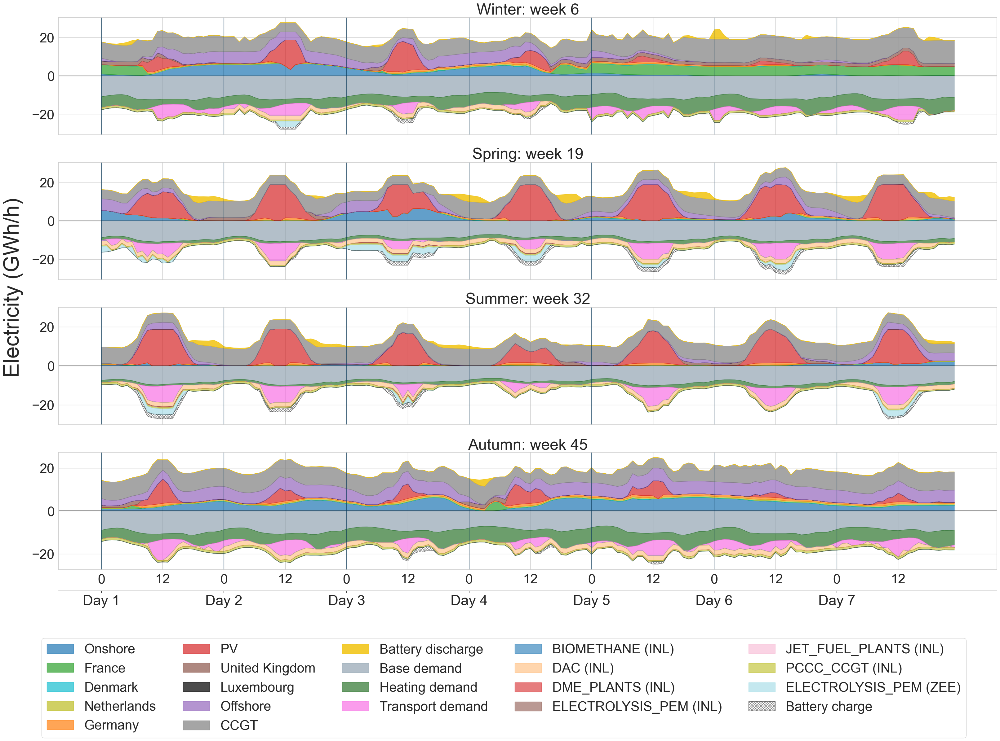

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== GLOBAL STYLE ======================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 30,
    "axes.titlesize": 36,
    "xtick.labelsize": 31,
    "ytick.labelsize": 31,
    "legend.fontsize": 32
})

# =========================================================
# ===================== CONSUMPTIONS ======================
# =========================================================
nodes_inl = sys.INLAND.search("e_consumed")
nodes_zee = sys.ZEEBRUGGE.search("e_consumed")

raw_inl = {
    n: getattr(sys.INLAND, n).e_consumed
    for n in nodes_inl
    if np.sum(getattr(sys.INLAND, n).e_consumed) > 0
}

raw_zee = {
    n: getattr(sys.ZEEBRUGGE, n).e_consumed
    for n in nodes_zee
    if np.sum(getattr(sys.ZEEBRUGGE, n).e_consumed) > 0
}

industry_dict = {
    **{f"{n} (INL)": v for n, v in raw_inl.items()},
    **{f"{n} (ZEE)": v for n, v in raw_zee.items()},
}

consumer_colors = plt.cm.tab20(np.linspace(0, 1, len(industry_dict)))

# =========================================================
# ===================== DEMAND ============================
# =========================================================
el_base = np.array(sys.demand_el)
el_ht   = np.array(sys.demand_el_ht)
el_tr   = np.array(sys.INLAND.demand_el_tr)

# =========================================================
# ===================== SUPPLY ============================
# =========================================================
order = ["on","fr","dk","nl","de","pv","uk","lu","off","ccgt"]
labels = [
    "Onshore","France","Denmark","Netherlands","Germany",
    "PV","United Kingdom","Luxembourg","Offshore","CCGT"
]

colors = {
    "on":"#1f77b4","fr":"#2ca02c","dk":"#17becf","nl":"#bcbd22",
    "de":"#ff7f0e","pv":"#d62728","uk":"#8c564b","lu":"#000000",
    "off":"#9467bd","ccgt":"#7f7f7f"
}

supply_data = {
    "on":  np.array(sys.INLAND.WIND_ONSHORE.e_produced),
    "pv":  np.array(sys.INLAND.PV.e_produced),
    "off": np.array(sys.OFFSHORE.WIND_OFFSHORE.e_produced) * 0.93 * 0.93,
    "ccgt":np.array(sys.INLAND.CCGT.e_produced),
    "fr": np.array(sys.FRANCE.e_imported),
    "de": np.array(sys.DEUTSCHLAND.e_imported),
    "nl": np.array(sys.NETHERLANDS.e_imported),
    "dk": np.array(sys.DENMARK.e_imported) * 0.93,
    "uk": np.array(sys.UNITED_KINGDOM.e_imported) * 0.93,
    "lu": np.array(sys.LUXEMBOURG.e_imported),
}

batt_char = (
    np.array(sys.INLAND.BATTERIES.e_charged)
    + np.array(sys.ZEEBRUGGE.BATTERIES.e_charged)
)

batt_disc = (
    np.array(sys.INLAND.BATTERIES.e_discharged)
    + np.array(sys.ZEEBRUGGE.BATTERIES.e_discharged)
)

# =========================================================
# ===================== TIME ==============================
# =========================================================
weeks = [6, 19, 32, 45]
seasons = ["Winter","Spring","Summer","Autumn"]
starts = [(w - 1) * 168 for w in weeks]

hours = np.arange(168)
ticks = np.arange(0, 168, 12)
tick_labels = ["0" if t % 24 == 0 else "12" for t in ticks]

# =========================================================
# ===================== FIGURE ============================
# =========================================================
fig, axes = plt.subplots(4, 1, figsize=(34, 24), sharex=True)

for ax, w, start, s in zip(axes, weeks, starts, seasons):

    # ---------------- SUPPLY ----------------
    bottom_sup = np.zeros(168)

    for k, lab in zip(order, labels):
        vals = supply_data[k][start:start+168]
        ax.fill_between(
            hours, bottom_sup, bottom_sup + vals,
            color=colors[k], alpha=0.7, label=lab
        )
        bottom_sup += vals

    bd = batt_disc[start:start+168]
    ax.fill_between(
        hours, bottom_sup, bottom_sup + bd,
        color="#f1c40f", alpha=0.85, label="Battery discharge"
    )
    total_supply = bottom_sup + bd

    # ---------------- DEMAND ----------------
    bottom_use = np.zeros(168)

    for vals, col, lab in [
        (el_base[start:start+168], "#93a5b2", "Base demand"),
        (el_ht[start:start+168],   "#2e752e", "Heating demand"),
        (el_tr[start:start+168],   "#f973e5", "Transport demand"),
    ]:
        ax.fill_between(
            hours, -bottom_use, -(bottom_use + vals),
            color=col, alpha=0.7, label=lab
        )
        bottom_use += vals

    for (name, vals), col in zip(industry_dict.items(), consumer_colors):
        cw = vals[start:start+168]
        ax.fill_between(
            hours, -bottom_use, -(bottom_use + cw),
            color=col, alpha=0.6, label=name
        )
        bottom_use += cw

    bc = batt_char[start:start+168]
    ax.fill_between(
        hours, -bottom_use, -(bottom_use + bc),
        facecolor="none", edgecolor="black",
        hatch="xxxx", alpha=0.5, label="Battery charge"
    )

    # ---------------- BALANCE ----------------
    balance = total_supply - (bottom_use + bc)
    # ax.plot(
    #     hours, balance,
    #     color="red", linestyle="--",
    #     linewidth=2.5,
    #     label="Net balance (supply − use)"
    # )

    ax.axhline(0, color="black", linewidth=1.2)
    ax.set_title(f"{s}: week {w}")
    ax.set_xticks(ticks)
    ax.set_xticklabels(tick_labels)

    for t in range(0, 168, 24):
        ax.axvline(t, color="#0b3c5d", linewidth=1.2, alpha=0.8)

# =========================================================
# ===================== GLOBAL Y LABEL ====================
# =========================================================
fig.text(
    0.045, 0.6,
    "Electricity (GWh/h)",
    va="center",
    rotation="vertical",
    fontsize=50
)

# =========================================================
# ===================== SECONDARY X =======================
# =========================================================
day_centers = np.arange(0, 168, 24)
day_labels = [f"Day {i}" for i in range(1, 8)]

secax = axes[-1].secondary_xaxis(-0.18, functions=(lambda x: x, lambda x: x))
secax.set_xticks(day_centers)
secax.set_xticklabels(day_labels, fontsize=33)

# =========================================================
# ===================== LEGEND ============================
# =========================================================
handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    ncol=5,
    loc="lower center",
    bbox_to_anchor=(0.52, -0.015),
    fontsize=31,
    frameon=True
)

plt.tight_layout(rect=[0.06, 0.15, 1, 1])

plt.savefig(
    os.path.join(scenario_result_folder,"supply_vs_demand.pdf"),
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.05
)
plt.show()


## Hydrogen as commodity

In [31]:
h2_off_prod = sys.OFFSHORE.ELECTROLYSIS_PEM.h2_produced
h2_zee_aec_prod = sys.ZEEBRUGGE.ELECTROLYSIS_AEC.h2_produced
h2_zee_pem_prod = sys.ZEEBRUGGE.ELECTROLYSIS_PEM.h2_produced
h2_inl_aec_prod = sys.INLAND.ELECTROLYSIS_AEC.h2_produced
h2_inl_pem_prod = sys.INLAND.ELECTROLYSIS_PEM.h2_produced
h2_pem = sys.INLAND.ELECTROLYSIS_PEM.h2_produced
eff_pipe_zee_inl = 0.93
eff_pipe_off_zee = 0.93

- Total

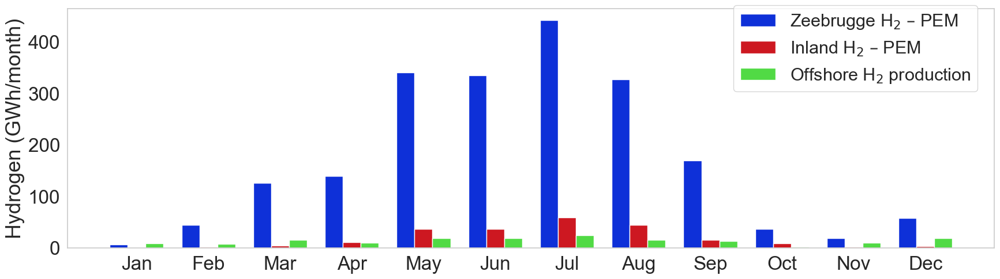

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== RESET FONT ========================
# =========================================================
plt.rcParams.update({
    # "font.family": "DejaVu Sans",   # police par défaut matplotlib
    "axes.labelsize": 24,
    "axes.titlesize": 24,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "legend.fontsize": 22,
})

# =========================================================
# ===================== MONTHLY AGGREGATION ===============
# =========================================================
h2_off_prod_month = pf.zoom_with_timestep(
    h2_off_prod, zoom="month", mean_or_sum="sum", zero_nodes="no"
)
h2_zee_pem_prod_month = pf.zoom_with_timestep(
    h2_zee_pem_prod, zoom="month", mean_or_sum="sum", zero_nodes="no"
)
h2_pem_prod_month = pf.zoom_with_timestep(
    h2_pem, zoom="month", mean_or_sum="sum", zero_nodes="no"
)

months = np.arange(12)
bw = 0.25

# =========================================================
# ===================== PLOT ==============================
# =========================================================
fig, ax = plt.subplots(figsize=(18, 5.5))

ax.bar(
    months - bw,
    h2_zee_pem_prod_month,
    width=bw,
    label=r"Zeebrugge H$_2$ – PEM",
    color="#0e30d8"
)

ax.bar(
    months,
    h2_pem_prod_month,
    width=bw,
    label=r"Inland H$_2$ – PEM",
    color="#cd1821"
)

ax.bar(
    months + bw,
    h2_off_prod_month,
    width=bw,
    label=r"Offshore H$_2$ production",
    color="#51da45"
)

# =========================================================
# ===================== AXES ==============================
# =========================================================
ax.set_xticks(months)
ax.set_xticklabels(
    ["Jan","Feb","Mar","Apr","May","Jun",
     "Jul","Aug","Sep","Oct","Nov","Dec"]
)

# ax.set_xlabel("Month")
ax.set_ylabel("Hydrogen (GWh/month)", fontsize=26)
# ax.set_title("Monthly hydrogen production across clusters")

# =========================================================
# ===================== LEGEND ============================
# =========================================================
ax.legend(
    ncol=1,
    loc="upper center",
    bbox_to_anchor=(0.85, 1.05),
    frameon=True
)

ax.grid(False)


# =========================================================
# ===================== SAVE ==============================
# =========================================================
plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"monthly_h2_production_clusters.pdf"), dpi=300, bbox_inches="tight")
plt.show()


- Total    

In [33]:
# Production and Import
h2_smr = sys.INLAND.SMR.h2_produced
h2_pem = sys.INLAND.ELECTROLYSIS_PEM.h2_produced
h2_aec = sys.INLAND.ELECTROLYSIS_AEC.h2_produced
h2_imported = sys.INLAND.H2_INTERCONNECTION_NL.h2_imported 
h2_pem_zee = [i * eff_pipe_zee_inl for i in sys.ZEEBRUGGE.ELECTROLYSIS_PEM.h2_produced]
h2_pem_off = [i * eff_pipe_off_zee * eff_pipe_zee_inl for i in sys.OFFSHORE.ELECTROLYSIS_PEM.h2_produced]
try: 
    h2_rreh = sys.ZEEBRUGGE.h2_imported
except:
    h2_rreh = [0]*len(h2_smr)
total_h2 = sum(h2_smr) + sum(h2_pem) + sum(h2_aec) + sum(h2_imported) + sum(h2_rreh) + sum(h2_pem_zee) + sum(h2_pem_off)  

print(colored('Hydrogen Summary:', 'blue', attrs=['bold', 'underline']))
print('Production (GWh):', round(total_h2,3))
print('Hydrogen Produced by SMR (GWh):', round(sum(h2_smr),3), '=', round(100*sum(h2_smr)/(total_h2),3), '%')
print('Hydrogen Produced by PEM Electrolysis (GWh):', round(sum(h2_pem),3), '=', round(100*sum(h2_pem)/(total_h2),3), '%')
print('Hydrogen Produced by AEC Electrolysis (GWh):', round(sum(h2_aec),3), '=', round(100*sum(h2_aec)/(total_h2),3), '%')
print('Hydrogen Produced by Zeebrugge PEM Electrolysis (GWh):', round(sum(h2_pem_zee),3), '=', round(100*sum(h2_pem_zee)/(total_h2),3), '%')
print('Hydrogen Produced by Offshore PEM Electrolysis (GWh):', round(sum(h2_pem_off),3), '=', round(100*sum(h2_pem_off)/(total_h2),3), '%')
print('Hydrogen Imported (GWh):', round(sum(h2_imported),3), '=', round(100*sum(h2_imported)/(total_h2),3), '%')
print('Hydrogen Imported from RREH (GWh):', round(sum(h2_rreh),3), '=', round(100*sum(h2_rreh)/(total_h2),3), '%')


# Demand 
h2_ind = (sys.demand_h2_industry)
h2_ht = (sys.demand_h2_heat)
h2_tr = (sys.demand_h2_transport)
h2_tr2 = (sys.demand_h2_transport2)
print('\nHydrogen Demand Summary:')
print('Total Hydrogen Demand (GWh):', round(sum(h2_ind) + sum(h2_ht) + sum(h2_tr) + sum(h2_tr2),3))
print('Hydrogen Demand Industry (GWh):', round(sum(h2_ind),3), '=', round(100*sum(h2_ind)/(sum(h2_ind) + sum(h2_ht) + sum(h2_tr) + sum(h2_tr2)),3), '%')
print('Hydrogen Demand Heat (GWh):', round(sum(h2_ht),3), '=', round(100*sum(h2_ht)/(sum(h2_ind) + sum(h2_ht) + sum(h2_tr) + sum(h2_tr2)),3), '%')
print('Hydrogen Demand Transport 1 (GWh):', round(sum(h2_tr),3), '=', round(100*sum(h2_tr)/(sum(h2_ind) + sum(h2_ht) + sum(h2_tr) + sum(h2_tr2)),3), '%')
print('Hydrogen Demand Transport 2 (GWh):', round(sum(h2_tr2),3), '=', round(100*sum(h2_tr2)/(sum(h2_ind) + sum(h2_ht) + sum(h2_tr) + sum(h2_tr2)),3), '%')


# Consumption
h2_cons_inl = sys.INLAND.search('h2_consumed')
h2_cons_zee = sys.ZEEBRUGGE.search('h2_consumed')
h2_cons_off = sys.OFFSHORE.search('h2_consumed')
print(colored('\nHydrogen consumption breakdown:', 'blue', attrs=['bold', 'underline']))

print(colored('Offshore:', 'green', attrs=['bold', 'underline']))
for n in h2_cons_off:
    h2_cons_node = getattr(sys.OFFSHORE, n).h2_consumed
    print(f'H2 consumed by {n} (GWh):', round(sum(h2_cons_node),3))

print(colored('\nZeebrugge:', 'green', attrs=['bold', 'underline']))
for n in h2_cons_zee:
    h2_cons_node = getattr(sys.ZEEBRUGGE, n).h2_consumed
    print(f'H2 consumed by {n} (GWh):', round(sum(h2_cons_node),3))
    
print(colored('\nInland:', 'green', attrs=['bold', 'underline']))
for n in h2_cons_inl:
    h2_cons_node = getattr(sys.INLAND, n).h2_consumed
    print(f'H2 consumed by {n} (GWh):', round(sum(h2_cons_node),3))


    

Hydrogen Summary:
Production (GWh): 86464.044
Hydrogen Produced by SMR (GWh): 0.0 = 0.0 %
Hydrogen Produced by PEM Electrolysis (GWh): 222.377 = 0.257 %
Hydrogen Produced by AEC Electrolysis (GWh): 0.0 = 0.0 %
Hydrogen Produced by Zeebrugge PEM Electrolysis (GWh): 1897.824 = 2.195 %
Hydrogen Produced by Offshore PEM Electrolysis (GWh): 139.785 = 0.162 %
Hydrogen Imported (GWh): 84204.058 = 97.386 %
Hydrogen Imported from RREH (GWh): 0 = 0.0 %

Hydrogen Demand Summary:
Total Hydrogen Demand (GWh): 77680.0
Hydrogen Demand Industry (GWh): 49840.0 = 64.161 %
Hydrogen Demand Heat (GWh): 13240.0 = 17.044 %
Hydrogen Demand Transport 1 (GWh): 3480.0 = 4.48 %
Hydrogen Demand Transport 2 (GWh): 11120.0 = 14.315 %

Hydrogen consumption breakdown:
Offshore:
H2 consumed by FUEL_CELLS (GWh): 0.0

Zeebrugge:
H2 consumed by FUEL_CELLS (GWh): 0.0
H2 consumed by METHANATION (GWh): 0.0

Inland:
H2 consumed by DME_PLANTS (GWh): 8148.706
H2 consumed by FUEL_CELLS (GWh): 0.0
H2 consumed by JET_FUEL_PLANTS (

In [34]:
aec_annual_capex = sys.INLAND.ELECTROLYSIS_AEC.yearly_capex
print('AEC Electrolyser annual CAPEX (M€):', round(aec_annual_capex,3))
aec_opex = sys.INLAND.ELECTROLYSIS_AEC.fom + sys.INLAND.ELECTROLYSIS_AEC.vom
print('AEC Electrolyser OPEX (M€):', round(aec_opex,3))
print('Total AEC Electrolyser cost (M€):', round(aec_annual_capex + aec_opex,3))
print('')
pem_annual_capex = sys.INLAND.ELECTROLYSIS_PEM.yearly_capex
print('PEM Electrolyser annual CAPEX (M€):', round(pem_annual_capex,3))
pem_opex = sys.INLAND.ELECTROLYSIS_PEM.fom + sys.INLAND.ELECTROLYSIS_PEM.vom
print('PEM Electrolyser OPEX (M€):', round(pem_opex,3))
print('Total PEM Electrolyser cost (M€):', round(pem_annual_capex + pem_opex,3))

AEC Electrolyser annual CAPEX (M€): 21.239
AEC Electrolyser OPEX (M€): 5.5
Total AEC Electrolyser cost (M€): 26.739

PEM Electrolyser annual CAPEX (M€): 25.101
PEM Electrolyser OPEX (M€): 9.75
Total PEM Electrolyser cost (M€): 34.851


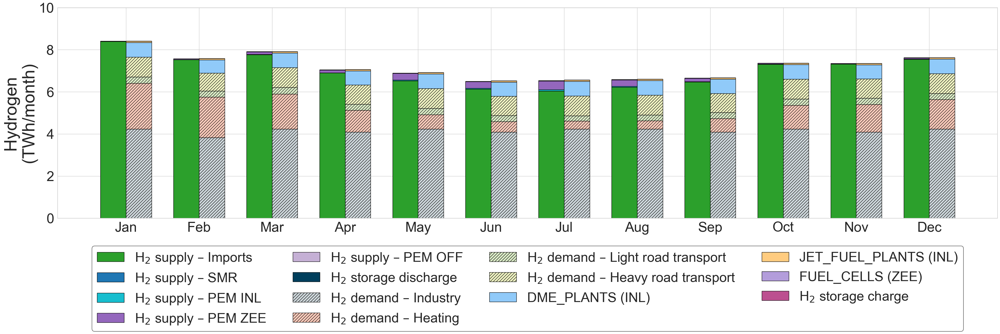

In [35]:
import matplotlib.pyplot as plt
import numpy as np

# =========================================================
# ===================== GLOBAL STYLE ======================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 30,
    "axes.titlesize": 28,
    "xtick.labelsize": 36,
    "ytick.labelsize": 36,
    "legend.fontsize": 27,
})

# =========================================================
# ===================== AGGREGATION =======================
# =========================================================

# ---------- PRODUCTION ----------
h2_smr_month      = pf.zoom_with_timestep(h2_smr, zoom="month", mean_or_sum="sum", zero_nodes="no")
h2_pem_month      = pf.zoom_with_timestep(h2_pem, zoom="month", mean_or_sum="sum", zero_nodes="no")
h2_pem_zee_month  = pf.zoom_with_timestep(h2_pem_zee, zoom="month", mean_or_sum="sum", zero_nodes="no")
h2_pem_off_month  = pf.zoom_with_timestep(h2_pem_off, zoom="month", mean_or_sum="sum", zero_nodes="no")

# ---------- IMPORTS ----------
h2_imported_month = pf.zoom_with_timestep(h2_imported, zoom="month", mean_or_sum="sum", zero_nodes="no")

# ---------- STORAGE ----------
h2_storage_charge_month = pf.zoom_with_timestep(
    sys.INLAND.H2_STORAGE.h2_charged, zoom="month", mean_or_sum="sum", zero_nodes="no"
)
h2_storage_discharge_month = pf.zoom_with_timestep(
    sys.INLAND.H2_STORAGE.h2_discharged, zoom="month", mean_or_sum="sum", zero_nodes="no"
)

# ---------- FINAL DEMANDS ----------
h2_demand_ind_month = pf.zoom_with_timestep(sys.demand_h2_industry, zoom="month", mean_or_sum="sum", zero_nodes="no")
h2_demand_heat_month = pf.zoom_with_timestep(sys.demand_h2_heat, zoom="month", mean_or_sum="sum", zero_nodes="no")
h2_demand_tr_month = pf.zoom_with_timestep(sys.demand_h2_transport, zoom="month", mean_or_sum="sum", zero_nodes="no")
h2_demand_tr2_month = pf.zoom_with_timestep(sys.demand_h2_transport2, zoom="month", mean_or_sum="sum", zero_nodes="no")

# ---------- INDUSTRIAL CONSUMPTION ----------
nodes_inl = sys.INLAND.search("h2_consumed")
nodes_zee = sys.ZEEBRUGGE.search("h2_consumed")

raw_inl = {
    n: getattr(sys.INLAND, n).h2_consumed
    for n in nodes_inl
    if np.sum(getattr(sys.INLAND, n).h2_consumed) > 0
}

raw_zee = {
    n: getattr(sys.ZEEBRUGGE, n).h2_consumed
    for n in nodes_zee
    if np.sum(getattr(sys.ZEEBRUGGE, n).h2_consumed) > 0
}

inl_consumers = {
    f"{n} (INL)": pf.zoom_with_timestep(v, zoom="month", mean_or_sum="sum", zero_nodes="no")
    for n, v in raw_inl.items()
}
zee_consumers = {
    f"{n} (ZEE)": pf.zoom_with_timestep(v, zoom="month", mean_or_sum="sum", zero_nodes="no")
    for n, v in raw_zee.items()
}

industrial_nodes = list(inl_consumers.keys()) + list(zee_consumers.keys())
industry_dict = {**inl_consumers, **zee_consumers}

# =========================================================
# ===================== COLORS ============================
# =========================================================

supply_colors = {
    "IMPORT": "#2ca02c",
    "SMR": "#1f77b4",
    "PEM INL": "#17becf",
    "PEM ZEE": "#9467bd",
    "PEM OFF": "#c5b0d5",
    "STORAGE DISCHARGE": "#003f5c",
}

demand_colors = {
    "Industry": "#cfd8dc",
    "Heating": "#ffccbc",
    "Light road transport": "#dcedc8",
    "Heavy road transport": "#f0f4c3",
}

storage_charge_color = "#bc5090"

pastel_pool = [
    "#90caf9", "#ffcc80", "#b39ddb", "#a5d6a7",
    "#f48fb1", "#fff59d", "#80deea", "#e6ee9c"
]

# =========================================================
# ===================== PLOT ==============================
# =========================================================

months = np.arange(12)
bw = 0.35

plt.figure(figsize=(38, 13))

# -------- LEFT: H₂ SUPPLY --------
bottom = np.zeros(12)

plt.bar(
    months - bw/2,
    h2_imported_month,
    bottom=bottom,
    width=bw,
    color=supply_colors["IMPORT"],
    edgecolor="black",
    label="H$_2$ supply – Imports"
)
bottom += np.array(h2_imported_month)

for name, series, color in [
    ("SMR", h2_smr_month, supply_colors["SMR"]),
    ("PEM INL", h2_pem_month, supply_colors["PEM INL"]),
    ("PEM ZEE", h2_pem_zee_month, supply_colors["PEM ZEE"]),
    ("PEM OFF", h2_pem_off_month, supply_colors["PEM OFF"]),
]:
    plt.bar(
        months - bw/2,
        series,
        bottom=bottom,
        width=bw,
        color=color,
        edgecolor="black",
        label=f"H$_2$ supply – {name}"
    )
    bottom += np.array(series)

plt.bar(
    months - bw/2,
    h2_storage_discharge_month,
    bottom=bottom,
    width=bw,
    color=supply_colors["STORAGE DISCHARGE"],
    edgecolor="black",
    label="H$_2$ storage discharge"
)

# -------- RIGHT: H₂ DEMAND --------
d_bottom = np.zeros(12)

for name, series in [
    ("Industry", h2_demand_ind_month),
    ("Heating", h2_demand_heat_month),
    ("Light road transport", h2_demand_tr_month),
    ("Heavy road transport", h2_demand_tr2_month),
]:
    plt.bar(
        months + bw/2,
        series,
        bottom=d_bottom,
        width=bw,
        color=demand_colors[name],
        hatch="///",
        edgecolor="black",
        label=f"H$_2$ demand – {name}"
    )
    d_bottom += np.array(series)

for j, n in enumerate(industrial_nodes):
    vals = industry_dict[n]
    plt.bar(
        months + bw/2,
        vals,
        bottom=d_bottom,
        width=bw,
        color=pastel_pool[j % len(pastel_pool)],
        edgecolor="black",
        label=n
    )
    d_bottom += vals

plt.bar(
    months + bw/2,
    h2_storage_charge_month,
    bottom=d_bottom,
    width=bw,
    color=storage_charge_color,
    edgecolor="black",
    label="H$_2$ storage charge"
)

# =========================================================
# ===================== FORMAT ============================
# =========================================================
plt.xticks(
    months,
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"] 
)

ymax = max(bottom.max(), d_bottom.max())
yticks_gwh = np.arange(0, ymax + 2000, 2000)  # 2 TWh = 2000 GWh
yticks_twh = [f"{y/1000:.0f}" for y in yticks_gwh]

plt.yticks(yticks_gwh, yticks_twh)
plt.ylabel("Hydrogen\n(TWh/month)", fontsize=45)

plt.legend(
    ncol=4,
    bbox_to_anchor=(0.5, -0.10),
    loc="upper center",
    frameon=True, fontsize=35, edgecolor="black", facecolor="white",
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"h2_monthly_flows.pdf"), dpi=300, bbox_inches="tight")
plt.show()


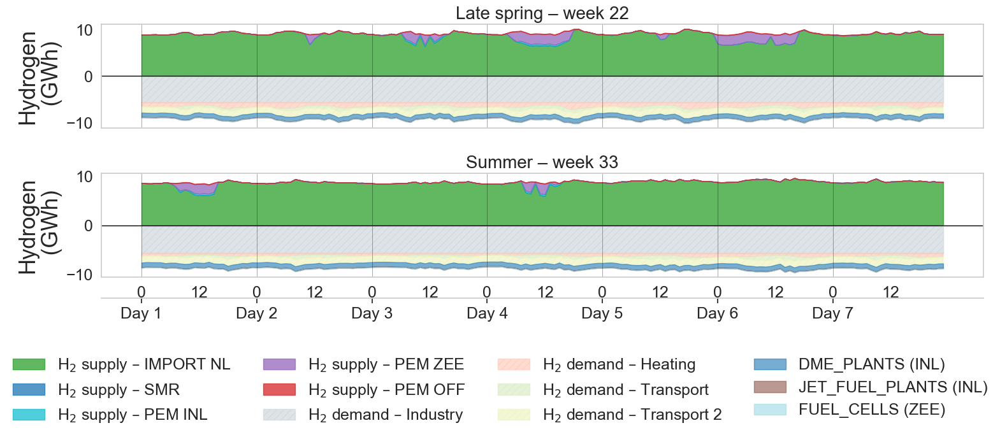

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== STYLE =============================
# =========================================================
plt.rcParams.update({
    # "font.family": "DejaVu Sans",
    "axes.labelsize": 22,
    "axes.titlesize": 20,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 18,
})

# =========================================================
# ===================== H2 PRODUCTION =====================
# =========================================================
h2_smr = np.array(sys.INLAND.SMR.h2_produced)
h2_pem_inl = np.array(sys.INLAND.ELECTROLYSIS_PEM.h2_produced)

h2_pem_zee = np.array([
    i * eff_pipe_zee_inl
    for i in sys.ZEEBRUGGE.ELECTROLYSIS_PEM.h2_produced
])

h2_pem_off = np.array([
    i * eff_pipe_off_zee * eff_pipe_zee_inl
    for i in sys.OFFSHORE.ELECTROLYSIS_PEM.h2_produced
])

h2_imported = np.array(sys.INLAND.H2_INTERCONNECTION_NL.h2_imported)

# =========================================================
# ===================== H2 SUPPLY =========================
# =========================================================
h2_supply = {
    "IMPORT NL": h2_imported,
    "SMR": h2_smr,
    "PEM INL": h2_pem_inl,
    "PEM ZEE": h2_pem_zee,
    "PEM OFF": h2_pem_off,
}

supply_order = ["IMPORT NL", "SMR", "PEM INL", "PEM ZEE", "PEM OFF"]

supply_colors = {
    "IMPORT NL": "#2ca02c",
    "SMR": "#1f77b4",
    "PEM INL": "#17becf",
    "PEM ZEE": "#9467bd",
    "PEM OFF": "#d62728",
}

# =========================================================
# ===================== H2 DEMANDS ========================
# =========================================================
h2_demands = {
    "Industry": np.array(sys.demand_h2_industry),
    "Heating": np.array(sys.demand_h2_heat),
    "Transport": np.array(sys.demand_h2_transport),
    "Transport 2": np.array(sys.demand_h2_transport2),
}

demand_colors = {
    "Industry": "#cfd8dc",
    "Heating": "#ffccbc",
    "Transport": "#dcedc8",
    "Transport 2": "#f0f4c3",
}

# =========================================================
# ============ INDUSTRIAL H2 CONSUMPTION ==================
# =========================================================
nodes_inl = sys.INLAND.search("h2_consumed")
nodes_zee = sys.ZEEBRUGGE.search("h2_consumed")

industry_dict = {}

for n in nodes_inl:
    v = np.array(getattr(sys.INLAND, n).h2_consumed)
    if v.sum() > 0:
        industry_dict[f"{n} (INL)"] = v

for n in nodes_zee:
    v = np.array(getattr(sys.ZEEBRUGGE, n).h2_consumed)
    if v.sum() > 0:
        industry_dict[f"{n} (ZEE)"] = v

industry_colors = plt.cm.tab20(np.linspace(0, 1, len(industry_dict)))

# =========================================================
# ===================== TIME ==============================
# =========================================================
weeks = [22, 33]
seasons = ["Late spring", "Summer"]
starts = [(w - 1) * 168 for w in weeks]

hours = np.arange(168)
ticks = np.arange(0, 168, 12)
tick_labels = ["0" if t % 24 == 0 else "12" for t in ticks]

# =========================================================
# ===================== FIGURE ============================
# =========================================================
fig, axes = plt.subplots(2, 1, figsize=(16, 7), sharex=True)

for ax, w, season, start in zip(axes, weeks, seasons, starts):

    # -------- SUPPLY (↑) --------
    bottom_sup = np.zeros(168)

    for k in supply_order:
        vals = h2_supply[k][start:start + 168]
        ax.fill_between(
            hours,
            bottom_sup,
            bottom_sup + vals,
            color=supply_colors[k],
            alpha=0.75,
            label=f"H$_2$ supply – {k}"
        )
        bottom_sup += vals

    # -------- DEMAND (↓) --------
    bottom_use = np.zeros(168)

    for name, series in h2_demands.items():
        vals = series[start:start + 168]
        ax.fill_between(
            hours,
            -bottom_use,
            -(bottom_use + vals),
            color=demand_colors[name],
            alpha=0.7,
            hatch="///",
            label=f"H$_2$ demand – {name}"
        )
        bottom_use += vals

    for (name, series), col in zip(industry_dict.items(), industry_colors):
        vals = series[start:start + 168]
        ax.fill_between(
            hours,
            -bottom_use,
            -(bottom_use + vals),
            color=col,
            alpha=0.6,
            label=name
        )
        bottom_use += vals

    # -------- FORMAT --------
    ax.axhline(0, color="black", linewidth=1.0)
    ax.set_ylabel("Hydrogen\n (GWh)", fontsize=25)
    ax.set_title(f"{season} – week {w}")
    ax.set_xticks(ticks)
    ax.set_xticklabels(tick_labels)
    ax.grid(False)

    for t in range(0, 168, 24):
        ax.axvline(t, color="black", linewidth=0.6, alpha=0.4)

# =========================================================
# ===================== DAY AXIS ==========================
# =========================================================
day_centers = np.arange(0, 168, 24)
day_labels = [f"Day {i}" for i in range(1, 8)]

secax = axes[-1].secondary_xaxis(
    -0.2,
    functions=(lambda x: x, lambda x: x)
)
secax.set_xticks(day_centers)
secax.set_xticklabels(day_labels)
# secax.set_xlabel("Day of the week")

# =========================================================
# ===================== LEGEND ============================
# =========================================================
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    ncol=4,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.03),
    frameon=False
)

# =========================================================
# ===================== SAVE ==============================
# =========================================================
plt.tight_layout(rect=[0, 0.15, 1, 1])
plt.savefig(os.path.join(scenario_result_folder,"h2_supply_vs_demand_weeks_22_33.pdf"), dpi=300)
plt.show()


C:\Users\yaita\AppData\Local\Temp\ipykernel_23456\2638406737.py:81: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\yaita\anaconda3\envs\tfe_env\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


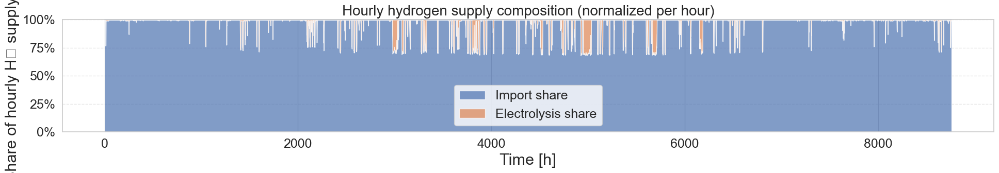

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# =========================
# ======= DATA ============
# =========================

h2_imported = np.array(sys.INLAND.H2_INTERCONNECTION_NL.h2_imported)

h2_off_pem = np.array(sys.OFFSHORE.ELECTROLYSIS_PEM.h2_produced)
h2_zee_pem = np.array(sys.ZEEBRUGGE.ELECTROLYSIS_PEM.h2_produced)
h2_zee_aec = np.array(sys.ZEEBRUGGE.ELECTROLYSIS_AEC.h2_produced)  
h2_inl_pem = np.array(sys.INLAND.ELECTROLYSIS_PEM.h2_produced)
h2_inl_aec = np.array(sys.INLAND.ELECTROLYSIS_AEC.h2_produced)

# Total H2 from electrolysis
h2_elec = (
    h2_off_pem
    + h2_zee_pem
    + h2_zee_aec
    + h2_inl_pem
    + h2_inl_aec
)

# =========================
# === NORMALISATION =======
# =========================

total_h2 = h2_imported + h2_elec

# éviter division par zéro
total_h2_safe = np.where(total_h2 > 0, total_h2, np.nan)

share_import = h2_imported / total_h2_safe
share_elec = h2_elec / total_h2_safe

time = np.arange(len(total_h2))

# =========================
# ======== PLOT ===========
# =========================

plt.figure(figsize=(20, 4))

# Import share
plt.fill_between(
    time,
    0,
    share_import,
    alpha=0.7,
    label="Import share"
)

# Electrolysis share
plt.fill_between(
    time,
    share_import,
    share_import + share_elec,
    alpha=0.7,
    label="Electrolysis share"
)

# Top boundary (should be 100%)
plt.plot(
    time,
    share_import + share_elec,
    linewidth=0.8
)

# Axes & formatting
plt.xlabel("Time [h]")
plt.ylabel("Share of hourly H₂ supply [%]")
plt.title("Hourly hydrogen supply composition (normalized per hour)")

plt.ylim(0, 1)
plt.gca().yaxis.set_major_formatter(PercentFormatter(xmax=1))

plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


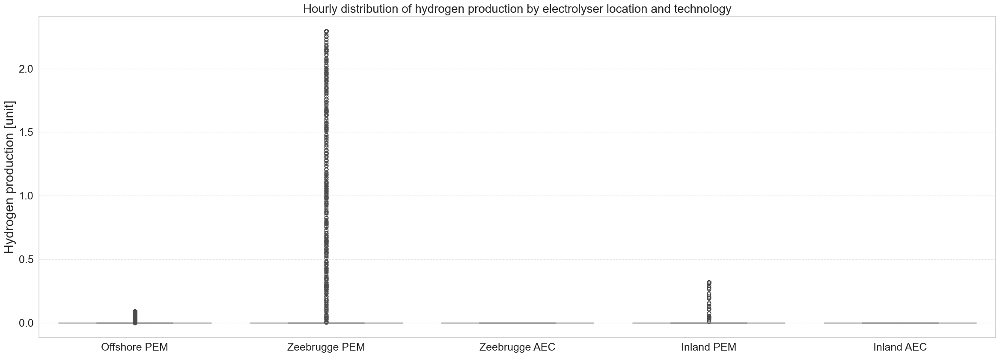

C:\Users\yaita\AppData\Local\Temp\ipykernel_23456\2632543495.py:63: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


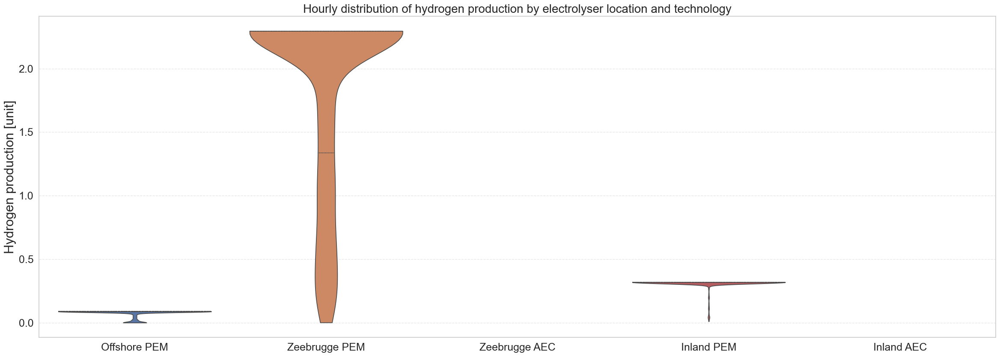

In [38]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# =========================
# ========= DATA ==========
# =========================

data = pd.DataFrame({
    "Offshore PEM": sys.OFFSHORE.ELECTROLYSIS_PEM.h2_produced,
    "Zeebrugge PEM": sys.ZEEBRUGGE.ELECTROLYSIS_PEM.h2_produced,
    "Zeebrugge AEC": sys.ZEEBRUGGE.ELECTROLYSIS_AEC.h2_produced,
    "Inland PEM": sys.INLAND.ELECTROLYSIS_PEM.h2_produced,
    "Inland AEC": sys.INLAND.ELECTROLYSIS_AEC.h2_produced,
})

# =========================
# ========= PLOT ==========
# =========================

plt.figure(figsize=(24, 9))

sns.boxplot(
    data=data,
    showfliers=True
)

plt.ylabel("Hydrogen production [unit]")
plt.title("Hourly distribution of hydrogen production by electrolyser location and technology")

plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# =========================
# ========= DATA ==========
# =========================

data = pd.DataFrame({
    "Offshore PEM": sys.OFFSHORE.ELECTROLYSIS_PEM.h2_produced,
    "Zeebrugge PEM": sys.ZEEBRUGGE.ELECTROLYSIS_PEM.h2_produced,
    "Zeebrugge AEC": sys.ZEEBRUGGE.ELECTROLYSIS_AEC.h2_produced,
    "Inland PEM": sys.INLAND.ELECTROLYSIS_PEM.h2_produced,
    "Inland AEC": sys.INLAND.ELECTROLYSIS_AEC.h2_produced,
})

# Option utile : retirer les heures à zéro
data = data.replace(0, np.nan)

# =========================
# ========= PLOT ==========
# =========================

plt.figure(figsize=(24, 9))

sns.violinplot(
    data=data,
    inner="quartile",   # médiane + Q1/Q3
    cut=0,              # pas d'extension artificielle
    scale="width"       # même largeur visuelle
)

plt.ylabel("Hydrogen production [unit]")
plt.title("Hourly distribution of hydrogen production by electrolyser location and technology")

plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

## Methane 

In [39]:
# Zeebrugge
print(colored('\nZeebrugge Methane Summary:', 'blue', attrs=['bold', 'underline']))
ng_imp_nv_zee = sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.ng_imported
print('NG imported from Norway to Zeebruge (GWh):', round(sum(ng_imp_nv_zee),3)) 
ng_imp_uk_zee = sys.ZEEBRUGGE.NG_INTERCONNECTION_UK.ng_imported
print('NG imported from UK to Zeebruge (GWh):', round(sum(ng_imp_uk_zee),3))
ng_imp_fr_zee = sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.ng_imported
print('NG imported from France to Zeebruge (GWh):', round(sum(ng_imp_fr_zee),3))

pipe_zb_inl_in = sys.PIPE_NG_ZB_INL.flow_forward_in
pipe_zb_inl_out = sys.PIPE_NG_ZB_INL.flow_forward_out
efficiencies_pipe_ng = [o / i if i > 0 else 0 for i, o in zip(pipe_zb_inl_in, pipe_zb_inl_out)]
print('Efficiency NG transport Zeebruge to Inland (%):', round(100*np.mean(efficiencies_pipe_ng),3))


# INLAND
print(colored('\nInland Methane Summary:', 'blue', attrs=['bold', 'underline']))
ng_imp_nl_inl = sys.INLAND.NG_INTERCONNECTION_NL.ng_imported
print('NG imported from Netherlands to Inland (GWh):', round(sum(ng_imp_nl_inl),3)) 
ng_imp_de_inl = sys.INLAND.NG_INTERCONNECTION_DE.ng_imported
print('NG imported from Germany to Inland (GWh):', round(sum(ng_imp_de_inl),3)) 
ng_imp_fr_inl = sys.INLAND.NG_INTERCONNECTION_FR.ng_imported
print('NG imported from France to Inland (GWh):', round(sum(ng_imp_fr_inl),3))
bio_meth_inl = sys.INLAND.BIOMETHANE.ng_produced
print('Bio-methane produced Inland (GWh):', round(sum(bio_meth_inl),3))
ng_stor_charge = sys.INLAND.NG_STORAGE.ng_charged
ng_stor_discharge = sys.INLAND.NG_STORAGE.ng_discharged
print('Loenhout storage charged Inland (GWh):', round(sum(ng_stor_charge),3))
print('Loenhout storage discharged Inland (GWh):', round(sum(ng_stor_discharge),3))
ng_linepack_charge = sys.INLAND.LINEPACK_NG.ng_charged
ng_linepack_discharge = sys.INLAND.LINEPACK_NG.ng_discharged
print('Linepack charged Inland (GWh):', round(sum(ng_linepack_charge),3))
print('Linepack discharged Inland (GWh):', round(sum(ng_linepack_discharge),3))


# Consumption
print(colored('\nMethane Consumption Summary:', 'blue', attrs=['bold', 'underline']))

print(colored('Zeebrugge:', 'green', attrs=['bold', 'underline']))
ng_cons_zee = sys.ZEEBRUGGE.search('ng_consumed')
for i, n in enumerate(ng_cons_zee):
    ng_cons_node = getattr(sys.ZEEBRUGGE, n).ng_consumed
    print(f'NG consumed by {n} (GWh):', round(sum(ng_cons_node),3))
    
print(colored('\nInland:', 'green', attrs=['bold', 'underline']))
ng_cons_inl = sys.INLAND.search('ng_consumed')
for i, n in enumerate(ng_cons_inl):
    ng_cons_node = getattr(sys.INLAND, n).ng_consumed
    print(f'NG consumed by {n} (GWh):', round(sum(ng_cons_node),3))


    
# Demand
print(colored('\nDemand Summary:', 'blue', attrs=['bold', 'underline']))
ng_ind = sys.demand_ng_industry
ng_ht = sys.demand_ng_heat
ng_tr = sys.demand_ng_transport
ng_tr2 = sys.demand_ng_transport2
print('NG demand Industry (GWh):', round(sum(ng_ind),3))
print('NG demand Heating (GWh):', round(sum(ng_ht),3))
print('NG demand Transport (GWh):', round(sum(ng_tr),3))
print('NG demand Transport 2 (GWh):', round(sum(ng_tr2),3))


Zeebrugge Methane Summary:
NG imported from Norway to Zeebruge (GWh): 4.959
NG imported from UK to Zeebruge (GWh): 0.0
NG imported from France to Zeebruge (GWh): 81638.369
Efficiency NG transport Zeebruge to Inland (%): 99.92

Inland Methane Summary:
NG imported from Netherlands to Inland (GWh): 0.0
NG imported from Germany to Inland (GWh): 39394.977
NG imported from France to Inland (GWh): 0.0
Bio-methane produced Inland (GWh): 5730.906
Loenhout storage charged Inland (GWh): 0.0
Loenhout storage discharged Inland (GWh): 0.0
Linepack charged Inland (GWh): 13070.712
Linepack discharged Inland (GWh): 13070.712

Methane Consumption Summary:
Zeebrugge:

Inland:
NG consumed by CCGT (GWh): 105954.322
NG consumed by CHP (GWh): 0.0
NG consumed by JET_FUEL_PLANTS (GWh): 1159.574
NG consumed by OCGT (GWh): 0.0
NG consumed by SMR (GWh): 0.0

Demand Summary:
NG demand Industry (GWh): 3820.0
NG demand Heating (GWh): 12220.0
NG demand Transport (GWh): 1100.0
NG demand Transport 2 (GWh): 2450.0


- Storage 

In [40]:
# Cost 
print(colored('\nCost Summary Loenhout Storage:', 'blue', attrs=['bold', 'underline']))
capex_ng_energy = sys.INLAND.NG_STORAGE.yearly_capex_energy_existing
print('Annualized CAPEX Loenhout energy (M€):', round(capex_ng_energy,3))
capex_ng_power = sys.INLAND.NG_STORAGE.yearly_capex_power_existing
print('Annualized CAPEX Loenhout power (M€):', round(capex_ng_power,3))
opex_ng_energy = sys.INLAND.NG_STORAGE.fom_energy_existing + sys.INLAND.NG_STORAGE.vom_energy_existing
print('OPEX Loenhout energy (M€):', round(opex_ng_energy,3))
opex_ng_power = sys.INLAND.NG_STORAGE.fom_power_existing + sys.INLAND.NG_STORAGE.vom_power_existing
print('OPEX Loenhout power (M€):', round(opex_ng_power,3))
print('')


print('total annualized cost Loenhout storage (M€):', round(capex_ng_energy + capex_ng_power + opex_ng_energy + opex_ng_power,3))
print('total annualized cost Loenhout storage (€):', round((capex_ng_energy + capex_ng_power + opex_ng_energy + opex_ng_power)*10**6,3))


Cost Summary Loenhout Storage:
Annualized CAPEX Loenhout energy (M€): 0.007
Annualized CAPEX Loenhout power (M€): 0.0
OPEX Loenhout energy (M€): 0.003
OPEX Loenhout power (M€): 0.0

total annualized cost Loenhout storage (M€): 0.01
total annualized cost Loenhout storage (€): 9531.357


Linepack max SOC (GWh): 35.581


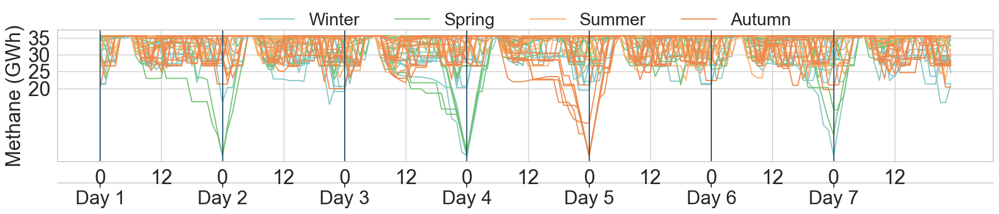

In [41]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== DATA ==============================
# =========================================================
linepack_ng_soc = np.array(sys.INLAND.LINEPACK_NG.state_of_charge)

T = len(linepack_ng_soc)          # normalement 8760
n_weeks = T // 168
hours = np.arange(168)

print("Linepack max SOC (GWh):", round(np.max(linepack_ng_soc), 3))

# =========================================================
# ===================== SEASONS ===========================
# =========================================================
season_weeks = {
    "Winter": list(range(0, 13)),
    "Spring": list(range(13, 26)),
    "Summer": list(range(26, 39)),
    "Autumn": list(range(39, 52)),
}

# Pastel mais bien lisible (sans alpha)
season_colors = {
    "Winter": "#82c7c7",   # pastel blue
    "Spring": "#74c476",   # pastel green
    "Summer": "#fdae6b",   # pastel orange
    "Autumn": "#ed8a50",   # pastel red
}

# =========================================================
# ===================== STYLE =============================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 25,
    "axes.titlesize": 25,
    "xtick.labelsize": 25,
    "ytick.labelsize": 25,
    "legend.fontsize": 22
})

# =========================================================
# ===================== FIGURE ============================
# =========================================================
fig, ax = plt.subplots(figsize=(18, 5))

for season, weeks in season_weeks.items():
    for w in weeks:
        start = w * 168
        end = start + 168
        week_soc = linepack_ng_soc[start:end]

        ax.plot(
            hours,
            week_soc,
            color=season_colors[season],
            linewidth=1.4,
            label=season if w == weeks[0] else None
        )

# =========================================================
# ========== DAILY SEPARATORS ==============================
# =========================================================
for t in range(0, 168, 24):
    ax.axvline(
        t,
        color="#0b3c5d",
        linewidth=1.2
    )

# =========================================================
# ===================== X AXIS ============================
# =========================================================
hour_ticks = np.arange(0, 168, 12)
hour_labels = ["0" if h % 24 == 0 else "12" for h in hour_ticks]

ax.set_xticks(hour_ticks)
ax.set_xticklabels(hour_labels)
ax.set_yticks(np.arange(20, np.max(linepack_ng_soc), 5))

day_centers = np.arange(0, 168, 24)
day_labels = [f"Day {i}" for i in range(1, 8)]

secax = ax.secondary_xaxis(
    -0.16,
    functions=(lambda x: x, lambda x: x)
)
secax.set_xticks(day_centers)
secax.set_xticklabels(day_labels, fontsize=24)

# =========================================================
# ===================== AXES LABEL ========================
# =========================================================
ax.set_ylabel("Methane (GWh)")

# =========================================================
# ===================== LEGEND ============================
# =========================================================
ax.legend(
    ncol=4,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.25),
    frameon=False
)


# =========================================================
# ===================== SAVE ==============================
# =========================================================
plt.tight_layout()
plt.savefig(
    os.path.join(scenario_result_folder,"linepack_ng_soc_seasonal_profiles_week_axis_new.pdf"),
    dpi=300,
    bbox_inches="tight"
)
plt.show()




# linepack_ng_soc = sys.INLAND.LINEPACK_NG.state_of_charge
 

# linepack_ng_soc_week = pf.zoom_with_timestep(linepack_ng_soc, zoom='week', mean_or_sum='max', zero_nodes='no')
# plt.figure(figsize=(16,6))
# plt.bar(np.arange(len(linepack_ng_soc_week)), linepack_ng_soc_week, label='Linepack State of charge', color='green')
# plt.xlabel('Weeks')
# plt.ylabel('Methane (GWh/week)')
# plt.title('Weekly Linepack Natural Gas Storage')
# plt.legend()

# linepack_ng_soc_month = pf.zoom_with_timestep(linepack_ng_soc, zoom='month', mean_or_sum='max', zero_nodes='no')
# plt.figure(figsize=(16,6))
# plt.bar(np.arange(len(linepack_ng_soc_month)), linepack_ng_soc_month, label='Linepack State of charge', color='green')
# plt.xlabel('Months')
# plt.ylabel('Methane (GWh/month)')
# plt.title('Monthly Linepack Natural Gas Storage')
# plt.legend()
# plt.show()

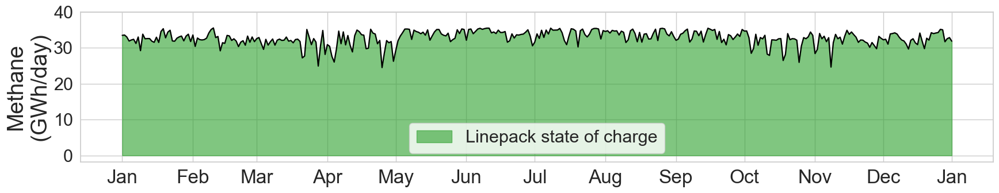

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== DAILY ZOOM ========================
# =========================================================
linepack_ng_soc = sys.INLAND.LINEPACK_NG.state_of_charge

linepack_ng_soc_day = np.array(
    pf.zoom_with_timestep(
        linepack_ng_soc,
        zoom="day",
        mean_or_sum="max",
        zero_nodes="no"
    )
)

# ===================== TIME AXIS =========================
days = np.arange(len(linepack_ng_soc_day))  # 0 ... 364

# ===================== MONTH TICKS =======================
# Non-leap year
month_days = np.array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])

month_starts = np.concatenate(([0], np.cumsum(month_days)[:-1]))
month_starts = np.append(month_starts, len(linepack_ng_soc_day) - 1)

month_labels = [
    "Jan","Feb","Mar","Apr","May","Jun",
    "Jul","Aug","Sep","Oct","Nov","Dec","Jan"
]

# ===================== FIGURE ============================
plt.figure(figsize=(18, 4))

plt.fill_between(
    days,
    0,
    linepack_ng_soc_day,
    color="#2ca02c",
    alpha=0.6,
    label="Linepack state of charge"
)

plt.plot(
    days,
    linepack_ng_soc_day,
    color="black",
    linewidth=1.6
)

# ===================== AXES FORMAT =======================
plt.xticks(month_starts, month_labels, fontsize=24)
plt.yticks(np.arange(0, 41, 10), fontsize=22)

# plt.xlabel("Month", fontsize=24)
plt.ylabel("Methane\n(GWh/day)", fontsize=28)

plt.legend(fontsize=22)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"linepack_ng_soc_daily.pdf"), dpi=300, bbox_inches="tight")
plt.show()


- Demand

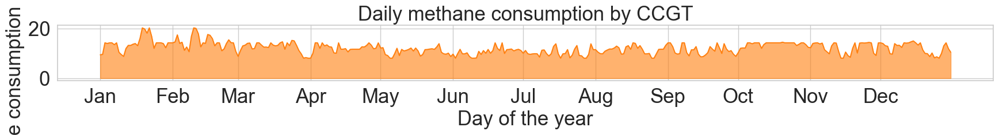

In [43]:
ccgt_ng_day = pf.zoom_with_timestep(
    sys.INLAND.CCGT.ng_consumed,
    zoom="day",
    mean_or_sum="mean",
    zero_nodes="no"
)

days = np.arange(len(ccgt_ng_day))

plt.figure(figsize=(18, 3))

plt.fill_between(
    days,
    0,
    ccgt_ng_day,
    color="#ff7f0e",
    alpha=0.6,
    label="Methane consumption by CCGT"
)

plt.plot(
    days,
    ccgt_ng_day,
    color="#ff7f0e",
    linewidth=1.3
)

plt.xticks(
    [0,31,59,90,120,151,181,212,243,273,304,334],
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
)

plt.xlabel("Day of the year")
plt.ylabel("Methane consumption (GWh/day)")
plt.title("Daily methane consumption by CCGT")

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"ng_consumption_ccgt_daily.pdf"), dpi=300)
plt.show()



In [44]:
# Production 
meth_inl = sys.INLAND.METHANATION.ng_produced
meth_zee = sys.ZEEBRUGGE.METHANATION.ng_produced
biometh_inl = sys.INLAND.BIOMETHANE.ng_produced
print(colored('\nMethane Production Summary:', 'blue', attrs=['bold', 'underline']))
print('Total Methanation Inland (TWh):', round(sum(meth_inl)/1000,3))
print('Total Methanation Zeebrugge (TWh):', round(sum(meth_zee)/1000,3))
print('Total Bio-methane Inland (TWh):', round(sum(biometh_inl)/1000,3))

# Import
ng_import_nl_inl = sys.INLAND.NG_INTERCONNECTION_NL.ng_imported
ng_import_de_inl = sys.INLAND.NG_INTERCONNECTION_DE.ng_imported
ng_import_fr_zee = sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.ng_imported
ng_import_nv_zee = sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.ng_imported
ng_import_uk_zee = sys.ZEEBRUGGE.NG_INTERCONNECTION_UK.ng_imported 
print(colored('\nMethane Import Summary:', 'blue', attrs=['bold', 'underline']))
print('Total NG imported from Netherlands to Inland (TWh):', round(sum(ng_import_nl_inl)/1000,3)) 
print('Total NG imported from Germany to Inland (TWh):', round(sum(ng_import_de_inl)/1000,3)) 
print('Total NG imported from France to Zeebrugge (TWh):', round(sum(ng_import_fr_zee)/1000,3))
print('Total NG imported from Norway to Zeebrugge (TWh):', round(sum(ng_import_nv_zee)/1000,3))
print('Total NG imported from UK to Zeebrugge (TWh):', round(sum(ng_import_uk_zee)/1000,3))

# Demand
ng_ind = sys.demand_ng_industry
ng_ht  = sys.demand_ng_heat
ng_tr  = sys.demand_ng_transport
ng_tr2 = sys.demand_ng_transport2
print(colored('\nMethane Demand Summary:', 'blue', attrs=['bold', 'underline']))
print('NG demand Industry (TWh):', round(sum(ng_ind)/1000,3))
print('NG demand Heating (TWh):', round(sum(ng_ht)/1000,3))
print('NG demand Transport (TWh):', round(sum(ng_tr)/1000,3))
print('NG demand Transport 2 (TWh):', round(sum(ng_tr2)/1000,3))
print('total NG demand (TWh):', round((sum(ng_ind) + sum(ng_ht) + sum(ng_tr) + sum(ng_tr2))/1000,3))

# Consumption
ng_cons_inl = sys.INLAND.search('ng_consumed')
ng_cons_zee = sys.ZEEBRUGGE.search('ng_consumed')
print(colored('\nMethane Consumption Summary:', 'blue', attrs=['bold', 'underline']))
for i, n in enumerate(ng_cons_inl):
    ng_cons_node = getattr(sys.INLAND, n).ng_consumed
    print(f'NG consumed by {n} (TWh):', round(sum(ng_cons_node)/1000,3)) 
for i, n in enumerate(ng_cons_zee):
    ng_cons_node = getattr(sys.ZEEBRUGGE, n).ng_consumed
    print(f'NG consumed by {n} (TWh):', round(sum(ng_cons_node)/1000,3))

# Storage
loenhout_charge = sys.INLAND.NG_STORAGE.ng_charged
loenhout_discharge = sys.INLAND.NG_STORAGE.ng_discharged
linepack_charge = sys.INLAND.LINEPACK_NG.ng_charged
linepack_discharge = sys.INLAND.LINEPACK_NG.ng_discharged

print(colored('\nMethane Storage Summary:', 'blue', attrs=['bold', 'underline']))
print('Loenhout storage charged (TWh):', round(sum(loenhout_charge)/1000,3))
print('Loenhout storage discharged (TWh):', round(sum(loenhout_discharge)/1000,3))
print('Linepack charged (TWh):', round(sum(linepack_charge)/1000,3))
print('Linepack discharged (TWh):', round(sum(linepack_discharge)/1000,3))



Methane Production Summary:
Total Methanation Inland (TWh): 0.0
Total Methanation Zeebrugge (TWh): 0.0
Total Bio-methane Inland (TWh): 5.731

Methane Import Summary:
Total NG imported from Netherlands to Inland (TWh): 0.0
Total NG imported from Germany to Inland (TWh): 39.395
Total NG imported from France to Zeebrugge (TWh): 81.638
Total NG imported from Norway to Zeebrugge (TWh): 0.005
Total NG imported from UK to Zeebrugge (TWh): 0.0

Methane Demand Summary:
NG demand Industry (TWh): 3.82
NG demand Heating (TWh): 12.22
NG demand Transport (TWh): 1.1
NG demand Transport 2 (TWh): 2.45
total NG demand (TWh): 19.59

Methane Consumption Summary:
NG consumed by CCGT (TWh): 105.954
NG consumed by CHP (TWh): 0.0
NG consumed by JET_FUEL_PLANTS (TWh): 1.16
NG consumed by OCGT (TWh): 0.0
NG consumed by SMR (TWh): 0.0

Methane Storage Summary:
Loenhout storage charged (TWh): 0.0
Loenhout storage discharged (TWh): 0.0
Linepack charged (TWh): 13.071
Linepack discharged (TWh): 13.071


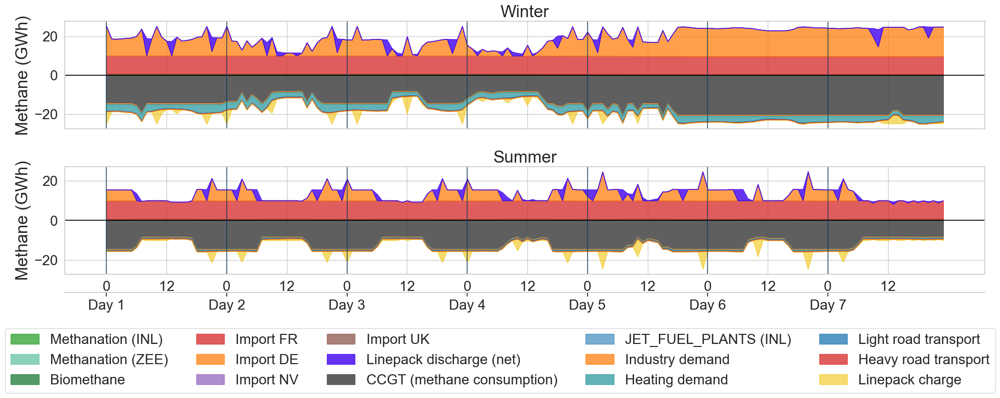

Mean NG import from France to Zeebrugge (GWh): 9.319


In [45]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== GLOBAL STYLE ======================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 24,
    "axes.titlesize": 24,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 20
})

# =========================================================
# ===================== SUPPLY ============================
# =========================================================
supply_order = [
    "meth_inl",
    "meth_zee",
    "biometh",
    "fr",
    "de",
    "nv",
    "uk",
]

supply_labels = [
    "Methanation (INL)",
    "Methanation (ZEE)",
    "Biomethane",
    "Import FR",
    "Import DE",
    "Import NV",
    "Import UK",
]

supply_colors = {
    "meth_inl": "#2ca02c",
    "meth_zee": "#66c2a5",
    "biometh": "#1b7837",
    "fr": "#d62728",
    "de": "#ff7f0e",
    "nv": "#9467bd",
    "uk": "#8c564b",
}

supply_data = {
    "meth_inl": np.array(sys.INLAND.METHANATION.ng_produced),
    "meth_zee": np.array(sys.ZEEBRUGGE.METHANATION.ng_produced),
    "biometh":  np.array(sys.INLAND.BIOMETHANE.ng_produced),
    "fr": np.array(sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.ng_imported),
    "de": np.array(sys.INLAND.NG_INTERCONNECTION_DE.ng_imported),
    "nv": np.array(sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.ng_imported),
    "uk": np.array(sys.ZEEBRUGGE.NG_INTERCONNECTION_UK.ng_imported),
}

# =========================================================
# ===================== LINEPACK ==========================
# =========================================================
linepack_charged    = np.array(sys.INLAND.LINEPACK_NG.ng_charged)
linepack_discharged = np.array(sys.INLAND.LINEPACK_NG.ng_discharged)
linepack_netflow    = linepack_discharged - linepack_charged

# =========================================================
# ===================== OTHER STORAGE =====================
# =========================================================
ngs_charge    = np.array(sys.INLAND.NG_STORAGE.ng_charged)
ngs_discharge = np.array(sys.INLAND.NG_STORAGE.ng_discharged)

# =========================================================
# ===================== DEMAND ============================
# =========================================================
ng_ind = np.array(sys.demand_ng_industry)
ng_ht  = np.array(sys.demand_ng_heat)
ng_tr  = np.array(sys.demand_ng_transport)
ng_tr2 = np.array(sys.demand_ng_transport2)

ccgt_ng = np.array(sys.INLAND.CCGT.ng_consumed)

# =========================================================
# ===================== INDUSTRIAL USE ====================
# =========================================================
nodes_inl = sys.INLAND.search("ng_consumed")
nodes_zee = sys.ZEEBRUGGE.search("ng_consumed")

raw_inl = {
    f"{n} (INL)": np.array(getattr(sys.INLAND, n).ng_consumed)
    for n in nodes_inl
    if np.sum(getattr(sys.INLAND, n).ng_consumed) > 0 and n != "CCGT"
}

raw_zee = {
    f"{n} (ZEE)": np.array(getattr(sys.ZEEBRUGGE, n).ng_consumed)
    for n in nodes_zee
    if np.sum(getattr(sys.ZEEBRUGGE, n).ng_consumed) > 0
}

industry_dict   = {**raw_inl, **raw_zee}
industry_colors = plt.cm.tab20(np.linspace(0, 1, len(industry_dict)))

# =========================================================
# ===================== TIME ==============================
# =========================================================
weeks   = [6, 32]
seasons = ["Winter", "Summer"]
starts  = [(w - 1) * 168 for w in weeks]

hours = np.arange(168)
ticks = np.arange(0, 168, 12)
tick_labels = ["0" if t % 24 == 0 else "12" for t in ticks]

# =========================================================
# ===================== FIGURE ============================
# =========================================================
fig, axes = plt.subplots(2, 1, figsize=(20, 8), sharex=True)

for ax, season, start in zip(axes, seasons, starts):

    # ================= SUPPLY (↑) =================
    bottom_sup = np.zeros(168)

    for k, lab in zip(supply_order, supply_labels):
        vals = supply_data[k][start:start+168]
        ax.fill_between(
            hours,
            bottom_sup,
            bottom_sup + vals,
            color=supply_colors[k],
            alpha=0.75,
            label=lab
        )
        bottom_sup += vals

    # ---- LINEPACK NET DISCHARGE ----
    lp_net = linepack_netflow[start:start+168]
    lp_dis = np.clip(lp_net, 0, None)

    ax.fill_between(
        hours,
        bottom_sup,
        bottom_sup + lp_dis,
        color="#4b0ff1",
        alpha=0.85,
        label="Linepack discharge (net)"
    )
    bottom_sup += lp_dis

    # ---- NG STORAGE DISCHARGE ----
    sd = ngs_discharge[start:start+168]
    # ax.fill_between(
    #     hours,
    #     bottom_sup,
    #     bottom_sup + sd,
    #     color="#7f7f7f",
    #     alpha=0.85,
    #     label="NG storage discharge"
    # )
    # total_supply = bottom_sup + sd

    # ================= USE (↓) =================
    bottom_use = np.zeros(168)

    ccgt = ccgt_ng[start:start+168]
    ax.fill_between(
        hours,
        -bottom_use,
        -(bottom_use + ccgt),
        color="#4d4d4d",
        alpha=0.9,
        label="CCGT (methane consumption)"
    )
    bottom_use += ccgt

    for (name, vals), col in zip(industry_dict.items(), industry_colors):
        cw = vals[start:start+168]
        ax.fill_between(
            hours,
            -bottom_use,
            -(bottom_use + cw),
            color=col,
            alpha=0.6,
            label=name
        )
        bottom_use += cw

    for vals, col, lab in [
        (ng_ind, "#ff7f0e", "Industry demand"),
        (ng_ht,  "#2c9aa0", "Heating demand"),
        (ng_tr,  "#1f77b4", "Light road transport"),
        (ng_tr2, "#d62728", "Heavy road transport"),
    ]:
        d = vals[start:start+168]
        ax.fill_between(
            hours,
            -bottom_use,
            -(bottom_use + d),
            color=col,
            alpha=0.75,
            label=lab
        )
        bottom_use += d

    sc = ngs_charge[start:start+168]
    # ax.fill_between(
    #     hours,
    #     -bottom_use,
    #     -(bottom_use + sc),
    #     facecolor="none",
    #     edgecolor="#7f7f7f",
    #     hatch="////",
    #     alpha=0.6,
    #     label="NG storage charge"
    # )
    # bottom_use += sc

    lp_ch = np.clip(-lp_net, 0, None)
    ax.fill_between(
        hours,
        -bottom_use,
        -(bottom_use + lp_ch),
        facecolor="#f1c40f",
        edgecolor="#f1c40f",
        alpha=0.6,
        label="Linepack charge"
    )
    total_use = bottom_use + lp_ch

    # ax.plot(
    #     hours,
    #     total_supply - total_use,
    #     color="red",
    #     linestyle="--",
    #     linewidth=2.5,
    #     label="Net methane balance"
    # )

    ax.axhline(0, color="black", linewidth=1.2)
    ax.set_ylabel("Methane (GWh)")
    ax.set_title(season)
    ax.set_xticks(ticks)
    ax.set_xticklabels(tick_labels)

    for t in range(0, 168, 24):
        ax.axvline(t, color="#0b3c5d", linewidth=1.2, alpha=0.8)

# ================= X AXIS =================
day_centers = np.arange(0, 168, 24)
day_labels  = [f"Day {i}" for i in range(1, 8)]

secax = axes[-1].secondary_xaxis(-0.17, functions=(lambda x: x, lambda x: x))
secax.set_xticks(day_centers)
secax.set_xticklabels(day_labels, fontsize=20)
# secax.set_xlabel("Day of the week", fontsize=20)

# ================= LEGEND =================
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    ncol=5,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.03),
    fontsize=20
)

plt.tight_layout(rect=[0, 0.12, 1, 1])
plt.savefig(
    os.path.join(scenario_result_folder,"methane_supply_vs_demand_weekly_winter_summer.pdf"),
    dpi=300,
    bbox_inches="tight"
)
plt.show()

mean_france = mean(sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.ng_imported)
print("Mean NG import from France to Zeebrugge (GWh):", round(mean_france, 3))


Total Biomethane produced Inland (GWh): 5730.906


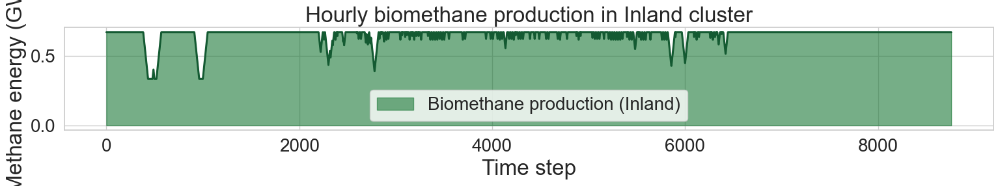

In [46]:
import numpy as np
import matplotlib.pyplot as plt

biometh = np.array(sys.INLAND.BIOMETHANE.ng_produced)

print("Total Biomethane produced Inland (GWh):", round(np.sum(biometh), 3))

plt.figure(figsize=(16, 3.5))

plt.fill_between(
    np.arange(len(biometh)),
    0,
    biometh,
    color="#1b7837",
    alpha=0.6,
    label="Biomethane production (Inland)"
)

plt.plot(
    biometh,
    color="#145a32",
    linewidth=2.2
)

plt.xlabel("Time step")
plt.ylabel("Methane energy (GWh)")
plt.title("Hourly biomethane production in Inland cluster")
plt.legend()
plt.tight_layout()
plt.show()


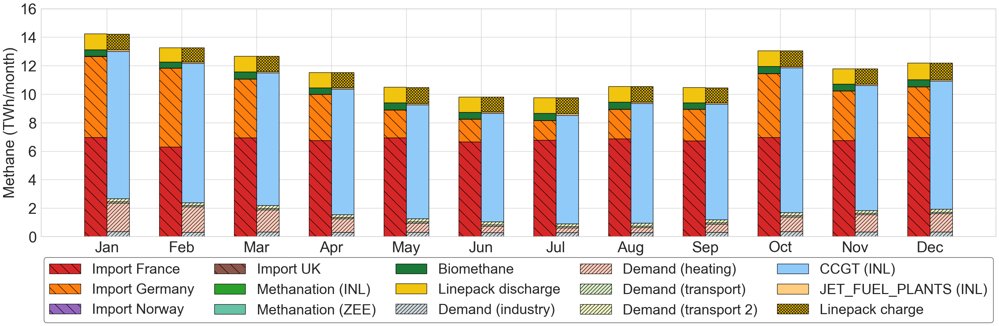

In [47]:
import matplotlib.pyplot as plt
import numpy as np

# ================= GLOBAL STYLE =================
plt.rcParams.update({
    "axes.labelsize": 32,
    "xtick.labelsize": 32,
    "ytick.labelsize": 32,
    "legend.fontsize": 30
})

# ================= COLORS =================
supply_colors = [
    "#d62728",  # Import FR
    "#ff7f0e",  # Import DE
    "#9467bd",  # Import Norway
    "#8c564b",  # Import UK
    "#2ca02c",  # Methanation INL
    "#66c2a5",  # Methanation ZEE
    "#1b7837",  # Biomethane
]

demand_colors = [
    "#cfd8dc",  # industry
    "#ffccbc",  # heating
    "#dcedc8",  # transport
    "#f0f4c3",  # transport 2
]

pastel_pool = [
    "#90caf9", "#ffcc80", "#b39ddb", "#a5d6a7",
    "#f48fb1", "#fff59d", "#80deea", "#e6ee9c"
]

storage_discharge_color = "#003f5c"
storage_charge_color = "#bc5090"
linepack_color = "#f1c40f"

# ================= ORDER =================
order = ["fr", "de", "nv", "uk", "meth_inl", "meth_zee", "biometh"]

labels = [
    "Import France",
    "Import Germany",
    "Import Norway",
    "Import UK",
    "Methanation (INL)",
    "Methanation (ZEE)",
    "Biomethane",
]

import_hatched = ["fr", "de", "nv", "uk"]

# ================= INDUSTRIAL NG CONSUMPTION =================
nodes_inl = sys.INLAND.search("ng_consumed")
nodes_zee = sys.ZEEBRUGGE.search("ng_consumed")

raw_inl = {
    f"{n} (INL)": getattr(sys.INLAND, n).ng_consumed
    for n in nodes_inl if np.sum(getattr(sys.INLAND, n).ng_consumed) > 0
}

raw_zee = {
    f"{n} (ZEE)": getattr(sys.ZEEBRUGGE, n).ng_consumed
    for n in nodes_zee if np.sum(getattr(sys.ZEEBRUGGE, n).ng_consumed) > 0
}

industrial_nodes = list(raw_inl.keys()) + list(raw_zee.keys())
industry_dict = {**raw_inl, **raw_zee}

# ================= STORAGE =================
linepack_charge = sys.INLAND.LINEPACK_NG.ng_charged
linepack_discharge = sys.INLAND.LINEPACK_NG.ng_discharged

ng_charge = sys.INLAND.NG_STORAGE.ng_charged
ng_discharge = sys.INLAND.NG_STORAGE.ng_discharged

# ================= MONTH SPLIT =================
month_hours = [
    31*24, 28*24, 31*24, 30*24, 31*24, 30*24,
    31*24, 31*24, 30*24, 31*24, 30*24, 31*24
]

monthly_supply = {k: [] for k in order}
monthly_industry = {n: [] for n in industrial_nodes}

d_ind, d_ht, d_tr, d_tr2 = [], [], [], []
lp_charge, lp_discharge = [], []
st_charge, st_discharge = [], []

start = 0
for h in month_hours:
    end = start + h

    monthly_supply["fr"].append(np.sum(sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.ng_imported[start:end]))
    monthly_supply["de"].append(np.sum(sys.INLAND.NG_INTERCONNECTION_DE.ng_imported[start:end]))
    monthly_supply["nv"].append(np.sum(sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.ng_imported[start:end]))
    monthly_supply["uk"].append(np.sum(sys.ZEEBRUGGE.NG_INTERCONNECTION_UK.ng_imported[start:end]))
    monthly_supply["meth_inl"].append(np.sum(sys.INLAND.METHANATION.ng_produced[start:end]))
    monthly_supply["meth_zee"].append(np.sum(sys.ZEEBRUGGE.METHANATION.ng_produced[start:end]))
    monthly_supply["biometh"].append(np.sum(sys.INLAND.BIOMETHANE.ng_produced[start:end]))

    lp_discharge.append(np.sum(linepack_discharge[start:end]))
    lp_charge.append(np.sum(linepack_charge[start:end]))
    st_discharge.append(np.sum(ng_discharge[start:end]))
    st_charge.append(np.sum(ng_charge[start:end]))

    d_ind.append(np.sum(sys.demand_ng_industry[start:end]))
    d_ht.append(np.sum(sys.demand_ng_heat[start:end]))
    d_tr.append(np.sum(sys.demand_ng_transport[start:end]))
    d_tr2.append(np.sum(sys.demand_ng_transport2[start:end]))

    for n in industrial_nodes:
        monthly_industry[n].append(np.sum(industry_dict[n][start:end]))

    start = end

# ================= PLOT =================
fig = plt.figure(figsize=(32, 11))
ax = plt.gca()

months = np.arange(1, 13)
bw = 0.3

# -------- SUPPLY --------
bottom = np.zeros(12)

for idx, (k, lab) in enumerate(zip(order, labels)):
    hatch = "\\" if k in import_hatched else None
    ax.bar(
        months - bw/2,
        monthly_supply[k],
        bottom=bottom,
        width=bw,
        color=supply_colors[idx],
        hatch=hatch,
        edgecolor="black",
        label=lab
    )
    bottom += np.array(monthly_supply[k])

ax.bar(months - bw/2, lp_discharge, bottom=bottom,
       width=bw, color=linepack_color,
       edgecolor="black", label="Linepack discharge")
bottom += np.array(lp_discharge)

# ax.bar(months - bw/2, st_discharge, bottom=bottom,
#        width=bw, color=storage_discharge_color,
#        edgecolor="black", label="Storage discharge")

# -------- DEMAND --------
d_bottom = np.zeros(12)

for vals, col, lab in zip(
    [d_ind, d_ht, d_tr, d_tr2],
    demand_colors,
    ["Demand (industry)", "Demand (heating)", "Demand (transport)", "Demand (transport 2)"]
):
    ax.bar(months + bw/2, vals, bottom=d_bottom,
           width=bw, color=col, hatch="///",
           edgecolor="black", label=lab)
    d_bottom += np.array(vals)

for j, n in enumerate(industrial_nodes):
    ax.bar(months + bw/2, monthly_industry[n],
           bottom=d_bottom, width=bw,
           color=pastel_pool[j % len(pastel_pool)],
           edgecolor="black", label=n)
    d_bottom += np.array(monthly_industry[n])

ax.bar(months + bw/2, lp_charge, bottom=d_bottom,
       width=bw, color=linepack_color,
       hatch="xxxx", edgecolor="black",
       label="Linepack charge")

# ax.bar(months + bw/2, st_charge, bottom=d_bottom,
#        width=bw, color=storage_charge_color,
#        hatch="////", edgecolor="black",
#        label="Storage charge")

# -------- AXIS FORMAT (TWh) --------
ax.set_xticks(months)
ax.set_xticklabels(
    ["Jan","Feb","Mar","Apr","May","Jun",
     "Jul","Aug","Sep","Oct","Nov","Dec"]
)

yticks = ax.get_yticks()
ax.set_yticks(yticks)
ax.set_yticklabels([f"{y/1000:.0f}" for y in yticks])
ax.set_ylabel("Methane (TWh/month)")

# -------- LEGEND --------
ax.legend(
    ncol=5,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.06),
    frameon=True,
    facecolor="white",
    edgecolor="black",
    columnspacing=1.4,
    handlelength=2.2
)

# -------- SAVE --------
plt.tight_layout(rect=[0, 0.06, 1, 1])
plt.savefig(
    os.path.join(scenario_result_folder,"monthly_ng_balance_cost_ordered.pdf"),
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.02
)
plt.show()


### LCOM

In [48]:
ng_imp_fr_mean_cost = mean(sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.import_costs_ts)
print('Mean cost NG import from France to Zeebrugge (€/MWh):', round(ng_imp_fr_mean_cost*1000,3))
ng_imp_de_mean_cost = mean(sys.INLAND.NG_INTERCONNECTION_DE.import_costs_ts)
print('Mean cost NG import from Germany to Inland (€/MWh):', round(ng_imp_de_mean_cost*1000,3))
ng_imp_nv_mean_cost = mean(sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.import_costs_ts)
print('Mean cost NG import from Norway to Zeebrugge (€/MWh):', round(ng_imp_nv_mean_cost*1000,3))
ng_imp_uk_mean_cost = mean(sys.ZEEBRUGGE.NG_INTERCONNECTION_UK.import_costs_ts)
print('Mean cost NG import from UK to Zeebrugge (€/MWh):', round(ng_imp_uk_mean_cost*1000,3))

Mean cost NG import from France to Zeebrugge (€/MWh): 50.219
Mean cost NG import from Germany to Inland (€/MWh): 50.538
Mean cost NG import from Norway to Zeebrugge (€/MWh): 50.835
Mean cost NG import from UK to Zeebrugge (€/MWh): 50.846


- Biomethane

Objective of BIOMETHANE Plants: 517.412 M€

COMMODITIES CONSUMPTION:
Electricity consumption: 343.854 GWh
Biomass consumption: 12351.091 GWh

COMMODITIES COST:
Electricity cost: 39.345 M€

Methane produced from BIOMETHANE: 5730.906 GWh

BIOMETHANE Plants:
Total cost: 556.757 M€
BIOMETHANE cost: 0.097 M€/GWh
BIOMETHANE cost: 97.15 €/MWh


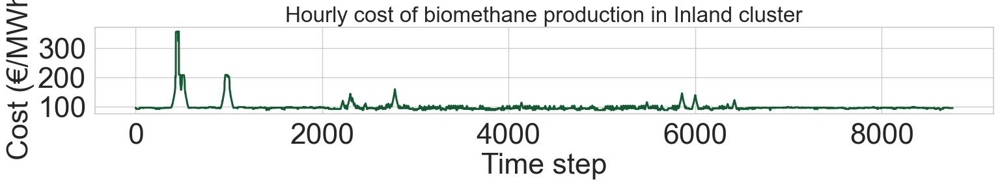

In [49]:
# Electricity cost of efuel plants 
e_price = sys.INLAND_BALANCE.electricity
e_cons = sys.INLAND.BIOMETHANE.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)] # M€ 

biometh_objective = sys.INLAND.BIOMETHANE.cost


# Objectives of efuel plants 
print(f'Objective of BIOMETHANE Plants:', round(biometh_objective, 3), 'M€\n')

print(colored(f'COMMODITIES CONSUMPTION:', 'blue')) 
print(f'Electricity consumption:', round(sum(e_cons), 3), 'GWh')
biomass_cons = sys.INLAND.BIOMETHANE.biomass_consumed
print(f'Biomass consumption:', round(sum(biomass_cons), 3), 'GWh\n')

print(colored(f'COMMODITIES COST:', 'blue')) 
print(f'Electricity cost:', round(sum(e_cost), 3), 'M€\n')

biomethane_produced = sys.INLAND.BIOMETHANE.ng_produced
print(f'Methane produced from BIOMETHANE:', round(sum(biomethane_produced), 3), 'GWh\n')

print(colored(f'BIOMETHANE Plants:', 'blue'))
total_cost = sum(e_cost) + biometh_objective
print(f'Total cost:', round(total_cost, 3), 'M€') 

print(f"BIOMETHANE cost:", round(total_cost / sum(biomethane_produced), 3), 'M€/GWh') if sum(biomethane_produced) > 0 else 0  
print(f"BIOMETHANE cost:", round(1000*total_cost / sum(biomethane_produced), 3), '€/MWh') if sum(biomethane_produced) > 0 else 0   


cost_hourly = [e + biometh_objective / len(e_cost) for e in e_cost]  # M€ per hour
cost_per_mwh = [
    (c*1000) / p if p > 0 else 0 
    for c, p in zip(cost_hourly, biomethane_produced)
]  # €/MWh

plt.figure(figsize=(16, 3.5))
plt.plot(
    cost_per_mwh,
    color="#145a32",
    linewidth=2.2
)
plt.xlabel("Time step")
plt.ylabel("Cost (€/MWh)")
plt.title("Hourly cost of biomethane production in Inland cluster")
plt.tight_layout()
plt.show()

- Methanation

In [50]:
# Electricity cost of efuel plants 
e_price = sys.INLAND_BALANCE.electricity
e_cons = sys.INLAND.METHANATION.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)] # M€ 


# Hydrogen cost of efuel plants
h2_price = sys.INLAND_BALANCE.hydrogen
h2_cons = sys.INLAND.METHANATION.h2_consumed
h2_cost = [p * c for p, c in zip(h2_price, h2_cons)] # M€

meth_objective = sys.INLAND.METHANATION.cost

# Objectives of efuel plants 
print(f'Objective of METHANATION Plants:', round(meth_objective, 3), 'M€\n')

print(colored(f'COMMODITIES CONSUMPTION:', 'blue')) 
print(f'Electricity consumption:', round(sum(e_cons), 3), 'GWh')
print(f'Hydrogen consumption:', round(sum(h2_cons), 3), 'GWh\n')

print(colored(f'COMMODITIES COST:', 'blue')) 
print(f'Electricity cost:', round(sum(e_cost), 3), 'M€')
print(f'Hydrogen cost:', round(sum(h2_cost), 3), 'M€\n')

methane_produced = sys.INLAND.METHANATION.ng_produced
print(f'Methane produced from METHANATION:', round(sum(methane_produced), 3), 'GWh\n')

print(colored(f'METHANATION Plants:', 'blue'))
total_cost = sum(e_cost) + meth_objective + sum(h2_cost)
print(f'Total cost:', round(total_cost, 3), 'M€') 

print(f"METHANATION cost per MWh:", round(1000*total_cost / sum(methane_produced), 3), '€/MWh') if sum(methane_produced) > 0 else 0  
print(f"METHANATION cost per kg:", round(lhv_ch4*total_cost / sum(methane_produced), 3), '€/kg') if sum(methane_produced) > 0 else 0  
print(f"METHANATION cost per ton:", round(1000*lhv_ch4*total_cost / sum(methane_produced), 3), '€/ton') if sum(methane_produced) > 0 else 0

Objective of METHANATION Plants: 0.0 M€

COMMODITIES CONSUMPTION:
Electricity consumption: 0.0 GWh
Hydrogen consumption: 0.0 GWh

COMMODITIES COST:
Electricity cost: 0.0 M€
Hydrogen cost: 0.0 M€

Methane produced from METHANATION: 0.0 GWh

METHANATION Plants:
Total cost: 0.0 M€


0

In [51]:
# Electricity cost of efuel plants 
e_price = sys.ZEEBRUGGE_BALANCE.electricity
e_cons = sys.ZEEBRUGGE.METHANATION.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)] # M€ 


# Hydrogen cost of efuel plants
h2_price = sys.ZEEBRUGGE_BALANCE.hydrogen
h2_cons = sys.ZEEBRUGGE.METHANATION.h2_consumed
h2_cost = [p * c for p, c in zip(h2_price, h2_cons)] # M€

meth_objective = sys.ZEEBRUGGE.METHANATION.cost

# Objectives of efuel plants 
print(f'Objective of METHANATION Plants:', round(meth_objective, 3), 'M€\n')

print(colored(f'COMMODITIES CONSUMPTION:', 'blue')) 
print(f'Electricity consumption:', round(sum(e_cons), 3), 'GWh')
print(f'Hydrogen consumption:', round(sum(h2_cons), 3), 'GWh\n')

print(colored(f'COMMODITIES COST:', 'blue')) 
print(f'Electricity cost:', round(sum(e_cost), 3), 'M€')
print(f'Hydrogen cost:', round(sum(h2_cost), 3), 'M€\n')

methane_produced = sys.ZEEBRUGGE.METHANATION.ng_produced
print(f'Methane produced from METHANATION:', round(sum(methane_produced), 3), 'GWh\n')

print(colored(f'METHANATION Plants:', 'blue'))
total_cost = sum(e_cost) + meth_objective + sum(h2_cost)
print(f'Total cost:', round(total_cost, 3), 'M€') 

print(f"METHANATION cost per MWh:", round(1000*total_cost / sum(methane_produced), 3), '€/MWh') if sum(methane_produced) > 0 else 0  
print(f"METHANATION cost per kg:", round(lhv_ch4*total_cost / sum(methane_produced), 3), '€/kg') if sum(methane_produced) > 0 else 0  
print(f"METHANATION cost per ton:", round(1000*lhv_ch4*total_cost / sum(methane_produced), 3), '€/ton') if sum(methane_produced) > 0 else 0

Objective of METHANATION Plants: 0.0 M€

COMMODITIES CONSUMPTION:
Electricity consumption: 0.0 GWh
Hydrogen consumption: 0.0 GWh

COMMODITIES COST:
Electricity cost: 0.0 M€
Hydrogen cost: 0.0 M€

Methane produced from METHANATION: 0.0 GWh

METHANATION Plants:
Total cost: 0.0 M€


0

## Carbon dioxide 

In [52]:

# CCGT
co2_ccgt_prod   = sys.INLAND.CCGT.co2_produced
co2_pccc_ccgt_capt   = sys.INLAND.PCCC_CCGT.co2_captured
co2_pccc_ccgt_rel    = sys.INLAND.PCCC_CCGT.co2_released

# SMR
co2_smr_prod   = sys.INLAND.SMR.co2_produced
co2_pccc_smr_capt   = sys.INLAND.CC_SMR.co2_captured
co2_pccc_smr_rel    = sys.INLAND.CC_SMR.co2_released


co2_ng_emiss    = sys.INLAND.co2_emission_ng
co2_dac_capt    = sys.INLAND.DAC.co2_captured
co2_biometh_use = sys.INLAND.BIOMETHANE.co2_captured
co2_export_tot  = sys.INLAND.CO2_EXPORT.co2_exported
co2_dme_emiss   = sys.INLAND.co2_emission_dme
co2_dme_cons    = sys.INLAND.DME_PLANTS.co2_consumed
co2_jet_use     = sys.INLAND.JET_FUEL_PLANTS.co2_captured

co2_char = sys.INLAND.CO2_STORAGE.co2_charged
co2_disch = sys.INLAND.CO2_STORAGE.co2_discharged

# ================= AGGREGATION EN Mton =================
ccgt_prod   = np.sum(co2_ccgt_prod)   / 1000
pccc_ccgt_rel    = np.sum(co2_pccc_ccgt_rel)    / 1000
pccc_ccgt_capt   = np.sum(co2_pccc_ccgt_capt)   / 1000

smr_prod  = np.sum(co2_smr_prod)   / 1000
pccc_smr_rel   = np.sum(co2_pccc_smr_rel)   / 1000
pccc_smr_capt  = np.sum(co2_pccc_smr_capt)  / 1000

dac_capt    = np.sum(co2_dac_capt)    / 1000
biometh_use = np.sum(co2_biometh_use) / 1000
export_tot  = np.sum(co2_export_tot)  / 1000
dme_emiss   = np.sum(co2_dme_emiss)   / 1000
dme_cons    = np.sum(co2_dme_cons)    / 1000
jet_use     = np.sum(co2_jet_use)     / 1000
ng_emiss    = np.sum(co2_ng_emiss)    / 1000

char = np.sum(co2_char) / 1000
disch = np.sum(co2_disch) / 1000

# ================= PRINT =================
print(f"CO2 produced by CCGT:        {ccgt_prod:.2f} MtCO2")
print(f"CO2 released by PCCC_CCGT:        {pccc_ccgt_rel:.2f} MtCO2")
print(f"CO2 captured by PCCC_CCGT:        {pccc_ccgt_capt:.2f} MtCO2")
print("")
print(f"CO2 produced by SMR:         {smr_prod:.2f} MtCO2")
print(f"CO2 released by PCCC_SMR:        {pccc_smr_rel:.2f} MtCO2")
print(f"CO2 captured by PCCC_SMR:        {pccc_smr_capt:.2f} MtCO2")
print("")
print(f"CO2 exported:                {export_tot:.2f} MtCO2")
print(f"CO2 captured by DAC:         {dac_capt:.2f} MtCO2")
print("")

print(f"CO2 emissions from NG:       {ng_emiss:.2f} MtCO2")
print(f"CO2 emissions from DME:      {dme_emiss:.2f} MtCO2")
print(f"CO2 captured by Biomethane:  {biometh_use:.2f} MtCO2")
print(f"CO2 captured by Biokerosene: {jet_use:.2f} MtCO2")
print(f"CO2 consumed by DME:         {dme_cons:.2f} MtCO2")
print("")
print(f"CO2 charged to storage:      {char:.2f} MtCO2")
print(f"CO2 discharged from storage: {disch:.2f} MtCO2")


CO2 produced by CCGT:        21.40 MtCO2
CO2 released by PCCC_CCGT:        1.50 MtCO2
CO2 captured by PCCC_CCGT:        19.90 MtCO2

CO2 produced by SMR:         0.00 MtCO2
CO2 released by PCCC_SMR:        0.00 MtCO2
CO2 captured by PCCC_SMR:        0.00 MtCO2

CO2 exported:                23.96 MtCO2
CO2 captured by DAC:         5.88 MtCO2

CO2 emissions from NG:       3.96 MtCO2
CO2 emissions from DME:      1.58 MtCO2
CO2 captured by Biomethane:  1.16 MtCO2
CO2 captured by Biokerosene: 1.64 MtCO2
CO2 consumed by DME:         1.83 MtCO2

CO2 charged to storage:      0.70 MtCO2
CO2 discharged from storage: 0.70 MtCO2


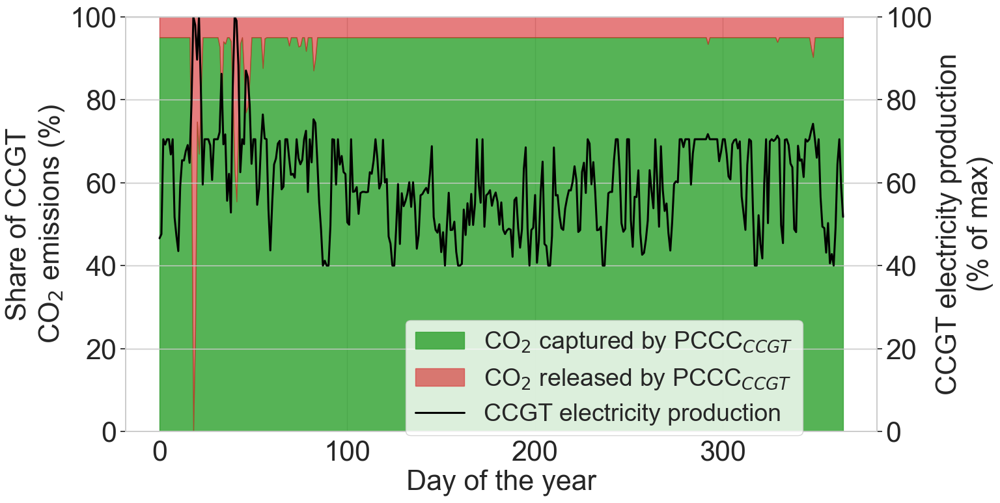

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== GLOBAL STYLE ======================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 31,
    "axes.titlesize": 31,
    "xtick.labelsize": 31,
    "ytick.labelsize": 31,
    "legend.fontsize": 27
})

# =========================================================
# ===================== DAILY DATA ========================
# =========================================================
def z(ts):
    return np.array(
        pf.zoom_with_timestep(
            ts,
            zoom="day",
            mean_or_sum="sum",
            zero_nodes="no"
        )
    )

ccgt_e_day     = z(sys.INLAND.CCGT.e_produced)          # GWh/day
ccgt_co2_day   = z(sys.INLAND.CCGT.co2_produced)
pccc_capt_day  = z(sys.INLAND.PCCC_CCGT.co2_captured)
pccc_rel_day   = z(sys.INLAND.PCCC_CCGT.co2_released)

# =========================================================
# ===================== RATIOS (%) ========================
# =========================================================
pccc_ratio_capt = np.where(
    ccgt_co2_day > 0,
    100 * pccc_capt_day / ccgt_co2_day,
    np.nan
)

pccc_ratio_rel = np.where(
    ccgt_co2_day > 0,
    100 * pccc_rel_day / ccgt_co2_day,
    np.nan
)

# CCGT electricity scaled (% of max)
ccgt_e_scaled = 100 * ccgt_e_day / np.nanmax(ccgt_e_day)

x = np.arange(len(ccgt_co2_day))

# =========================================================
# ===================== PLOT ==============================
# =========================================================
fig, ax1 = plt.subplots(figsize=(16, 9))

# ---- AXIS 1 : CO2 SHARES ----
ax1.fill_between(
    x, 0, pccc_ratio_capt,
    color="#2ca02c",
    alpha=0.8,
    label="CO$_2$ captured by PCCC$_{CCGT}$"
)

ax1.fill_between(
    x,
    pccc_ratio_capt,
    pccc_ratio_capt + pccc_ratio_rel,
    color="#d62728",
    alpha=0.6,
    label="CO$_2$ released by PCCC$_{CCGT}$"
)

ax1.set_ylabel("Share of CCGT\nCO$_2$ emissions (%)")
ax1.set_ylim(0, 100)
ax1.set_xlabel("Day of the year")

# ---- AXIS 2 : CCGT ELECTRICITY ----
ax2 = ax1.twinx()
ax2.plot(
    x,
    ccgt_e_scaled,
    color="black",
    linewidth=2.2,
    label="CCGT electricity production"
)
ax2.set_ylabel("CCGT electricity production\n(% of max)")
ax2.set_ylim(0, 100)

# ---- LEGEND (BOTTOM, CENTERED) ----
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()

fig.legend(
    lines1 + lines2,
    labels1 + labels2,
    loc="lower center",
    ncol=1,
    frameon=True,
    bbox_to_anchor=(0.6, 0.2)
)

# =========================================================
# ===================== SAVE ==============================
# =========================================================
plt.tight_layout(rect=[0, 0.07, 1, 1])
plt.savefig(
    os.path.join(scenario_result_folder,"ccgt_pccc_co2_capture_efficiency_daily_year.pdf"),
    dpi=300,
    bbox_inches="tight"
)
plt.show()


In [54]:
import numpy as np

def z(ts):
    return np.array(
        pf.zoom_with_timestep(
            ts, zoom="day", mean_or_sum="sum", zero_nodes="no"
        )
    )

ccgt_e_day     = z(sys.INLAND.CCGT.e_produced)
ccgt_co2_day   = z(sys.INLAND.CCGT.co2_produced)
pccc_capt_day  = z(sys.INLAND.PCCC_CCGT.co2_captured)

pccc_ratio_capt = np.where(
    ccgt_co2_day > 0,
    100 * pccc_capt_day / ccgt_co2_day,
    np.nan
)

tol = 1e-6
mask = (pccc_ratio_capt < (95 - tol)) & (~np.isnan(pccc_ratio_capt))
days = np.where(mask)[0]

print("Days where PCCC capture rate is strictly below 95%:\n")

for d in days:
    print(
        f"Day {d:03d} | Capture rate = {pccc_ratio_capt[d]:6.2f}% | "
        f"CCGT electricity = {ccgt_e_day[d]:7.2f} GWh/day "
        f"({ccgt_e_day[d]/24:6.2f} GW)"
    )

if len(days) > 0:
    dmax_power = days[np.argmax(ccgt_e_day[days])]
    print("\nDay with maximum CCGT power among days with <95% capture:\n")
    print(
        f"Day {dmax_power:03d} | Capture rate = {pccc_ratio_capt[dmax_power]:6.2f}% | "
        f"CCGT electricity ={ccgt_e_day[dmax_power]/24:6.2f} GW ({100*ccgt_e_day[dmax_power]/ccgt_e_day[dmax_power]:.2f}%)" 
    )

    dmax_capture = days[np.argmax(pccc_ratio_capt[days])]
    print("\nDay with highest capture rate among days with <95% capture:\n")
    print(
        f"Day {dmax_capture:03d} | Capture rate = {pccc_ratio_capt[dmax_capture]:6.2f}% | "
        f"CCGT electricity ={ccgt_e_day[dmax_capture]/24:6.2f} GW ({100*ccgt_e_day[dmax_capture]/ccgt_e_day[dmax_power]:.2f}%)" 
    )
else:
    print("No day with capture rate strictly below 95% over the year.")


Days where PCCC capture rate is strictly below 95%:

Day 017 | Capture rate =  64.27% | CCGT electricity =  229.20 GWh/day (  9.55 GW)
Day 018 | Capture rate =   0.12% | CCGT electricity =  290.67 GWh/day ( 12.11 GW)
Day 019 | Capture rate =  24.15% | CCGT electricity =  284.75 GWh/day ( 11.86 GW)
Day 020 | Capture rate =  74.68% | CCGT electricity =  260.50 GWh/day ( 10.85 GW)
Day 021 | Capture rate =  66.92% | CCGT electricity =  290.67 GWh/day ( 12.11 GW)
Day 022 | Capture rate =  80.46% | CCGT electricity =  241.76 GWh/day ( 10.07 GW)
Day 032 | Capture rate =  92.73% | CCGT electricity =  209.77 GWh/day (  8.74 GW)
Day 033 | Capture rate =  77.63% | CCGT electricity =  250.59 GWh/day ( 10.44 GW)
Day 034 | Capture rate =  94.00% | CCGT electricity =  201.20 GWh/day (  8.38 GW)
Day 035 | Capture rate =  93.45% | CCGT electricity =  208.17 GWh/day (  8.67 GW)
Day 038 | Capture rate =  94.09% | CCGT electricity =  153.43 GWh/day (  6.39 GW)
Day 039 | Capture rate =  80.44% | CCGT elect

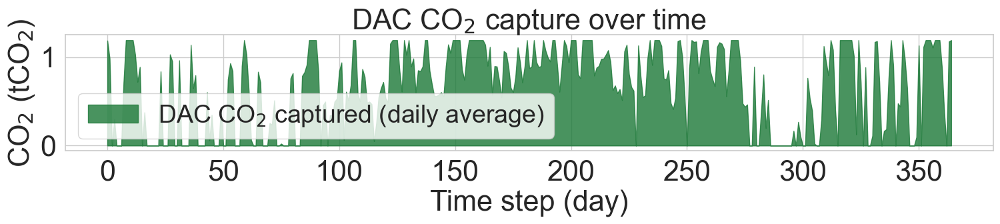

In [55]:
import numpy as np
import matplotlib.pyplot as plt

dac_capt = (sys.INLAND.DAC.co2_captured) 
dac_capt_day = pf.zoom_with_timestep((dac_capt), zoom='day', mean_or_sum='mean', zero_nodes='no')
plt.figure(figsize=(16, 4))
plt.fill_between(
    np.arange(len(dac_capt_day)),
    dac_capt_day,
    color="#1b7837",
    alpha=0.8,
    label="DAC CO$_2$ captured (daily average)"
)
plt.xlabel("Time step (day)")
plt.ylabel("CO$_2$ (tCO$_2$)")
plt.title("DAC CO$_2$ capture over time")
plt.legend()
plt.tight_layout()
plt.show()

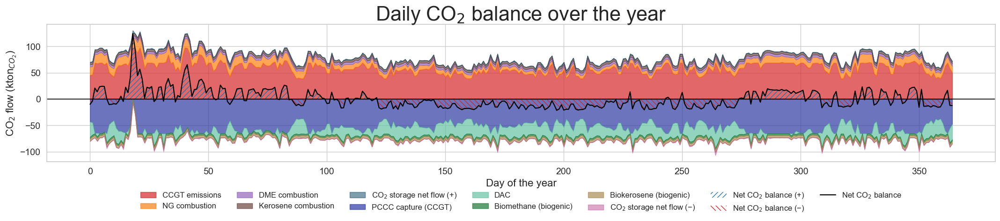

In [56]:

# === COLORS (CONSISTENT WITH MONTHLY PLOT) ===
COL_CCGT = "#d62728"
COL_SMR  = "#a1a1a1"
COL_NG   = "#ff7f0e"
COL_DME  = "#9467bd"
COL_KER  = "#6c4841"

COL_PCCC = "#2c39a0"
COL_CCSMR= "#7e7f7f"
COL_DAC  = "#66c2a5"

COL_BIOM = "#1b7837"
COL_JET  = "#ab8c53"

COL_STOR_POS = "#003f5c"
COL_STOR_NEG = "#bc5090"

COL_NET_POS  = "#1f77b4"
COL_NET_NEG  = "#d62728"


import numpy as np
import matplotlib.pyplot as plt

start = 0
end = 365

plt.rcParams.update({
    "axes.labelsize":16,
    "xtick.labelsize":14,
    "ytick.labelsize":14,
    "legend.fontsize":12
})

def z(ts):
    return np.array(pf.zoom_with_timestep(ts, zoom='day', mean_or_sum='sum', zero_nodes='no'))

co2_ccgt = z(sys.INLAND.CCGT.co2_produced)[start:end]
co2_ng   = z(sys.INLAND.co2_emission_ng)[start:end]
co2_dme  = z(sys.INLAND.co2_emission_dme)[start:end]
co2_ker  = z(sys.INLAND.co2_emission_biokerosene)[start:end]

co2_pccc = z(sys.INLAND.PCCC_CCGT.co2_captured)[start:end]
co2_dac  = z(sys.INLAND.DAC.co2_captured)[start:end]
co2_biom = z(sys.INLAND.BIOMETHANE.co2_captured)[start:end]
co2_jet  = z(sys.INLAND.JET_FUEL_PLANTS.co2_captured)[start:end]

co2_char  = z(sys.INLAND.CO2_STORAGE.co2_charged)[start:end]
co2_disch = z(sys.INLAND.CO2_STORAGE.co2_discharged)[start:end]
co2_stor_net = co2_disch - co2_char

stor_pos = np.clip(co2_stor_net, 0, None)
stor_neg = np.clip(co2_stor_net, None, 0)

T = len(co2_ccgt)
t = np.arange(T)

plt.figure(figsize=(22,6))

# ===== POSITIVE STACK =====
pos = np.zeros(T)

plt.fill_between(t, pos, pos+co2_ccgt, color=COL_CCGT, alpha=0.7, label="CCGT emissions"); pos+=co2_ccgt
plt.fill_between(t, pos, pos+co2_ng,   color=COL_NG,   alpha=0.7, label="NG combustion"); pos+=co2_ng
plt.fill_between(t, pos, pos+co2_dme,  color=COL_DME,  alpha=0.7, label="DME combustion"); pos+=co2_dme
plt.fill_between(t, pos, pos+co2_ker,  color=COL_KER,  alpha=0.7, label="Kerosene combustion"); pos+=co2_ker
plt.fill_between(t, pos, pos+stor_pos, color=COL_STOR_POS, alpha=0.5,
                 label="CO$_2$ storage net flow (+)")
pos += stor_pos
total_sources = pos

# ===== NEGATIVE STACK =====
neg = np.zeros(T)

plt.fill_between(t, -neg, -(neg+co2_pccc), color=COL_PCCC, alpha=0.7, label="PCCC capture (CCGT)"); neg+=co2_pccc
plt.fill_between(t, -neg, -(neg+co2_dac),  color=COL_DAC,  alpha=0.7, label="DAC"); neg+=co2_dac
plt.fill_between(t, -neg, -(neg+co2_biom), color=COL_BIOM, alpha=0.7, label="Biomethane (biogenic)"); neg+=co2_biom
plt.fill_between(t, -neg, -(neg+co2_jet),  color=COL_JET,  alpha=0.7, label="Biokerosene (biogenic)"); neg+=co2_jet
plt.fill_between(t, -neg, -(neg+np.abs(stor_neg)), color=COL_STOR_NEG, alpha=0.5,
                 label="CO$_2$ storage net flow (−)")
neg += np.abs(stor_neg)
total_sinks = neg

# ===== NET CO2 BALANCE =====
net_balance = total_sources - total_sinks
net_pos = np.clip(net_balance, 0, None)
net_neg = np.clip(net_balance, None, 0)

plt.fill_between(t, 0, net_pos, facecolor="none", edgecolor=COL_NET_POS,
                 hatch="///", linewidth=0,
                 label="Net CO$_2$ balance (+)")
plt.fill_between(t, 0, net_neg, facecolor="none", edgecolor=COL_NET_NEG,
                 hatch="\\\\\\", linewidth=0,
                 label="Net CO$_2$ balance (−)")
plt.plot(t, net_balance, color="black", linewidth=1.6,
         label="Net CO$_2$ balance")

plt.axhline(0, color="black", linewidth=1.2)
plt.xlabel("Day of the year")
plt.ylabel("CO$_2$ flow (kton$_{CO_2}$)")
plt.title("Daily CO$_2$ balance over the year")

plt.legend(
    ncol=7,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.16),
    frameon=False
)

plt.tight_layout(rect=[0,0.06,1,1])
plt.savefig(os.path.join(scenario_result_folder,"co2_daily_balance.pdf"), dpi=300)
plt.show()


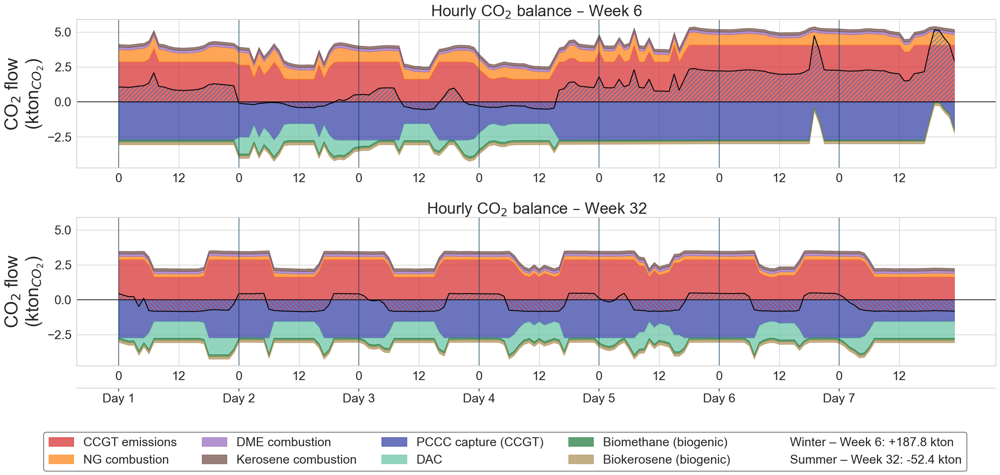

In [57]:
# =========================================================
# ======= CO2 HOURLY BALANCE – WEEKS 6 & 32 (NO STORAGE) ===
# ======= WITH TOTAL NET CO2 BALANCE IN LEGEND ============
# ======= SAME XTICKS AS SUPPLY VS DEMAND =================
# =========================================================

import numpy as np
import matplotlib.pyplot as plt

# ===================== COLORS ============================
COL_CCGT = "#d62728"
COL_NG   = "#ff7f0e"
COL_DME  = "#9467bd"
COL_KER  = "#6c4841"

COL_PCCC = "#2c39a0"
COL_DAC  = "#66c2a5"
COL_BIOM = "#1b7837"
COL_JET  = "#ab8c53"

COL_NET_POS = "#1f77b4"
COL_NET_NEG = "#d62728"

# ===================== STYLE =============================
plt.rcParams.update({
    "axes.labelsize":22,
    "xtick.labelsize":22,
    "ytick.labelsize":22,
    "legend.fontsize":22
})

# ================== WEEK DEFINITIONS =====================
weeks = {
    6:  (35, 42),     # days 35–41
    32: (217, 224)    # days 217–223
}

# ===================== TIME AXIS =========================
hours = np.arange(168)
ticks = np.arange(0, 168, 12)
tick_labels = ["0" if t % 24 == 0 else "12" for t in ticks]

# ================== FIGURE SETUP =========================
fig, axes = plt.subplots(2, 1, figsize=(25,12), sharey=True)
weekly_net_balance = {}

# ======================= LOOP ============================
for ax, (week, (start_day, end_day)) in zip(axes, weeks.items()):

    start = start_day * 24
    end   = end_day * 24

    # ---------------- DATA ----------------
    co2_ccgt = np.array(sys.INLAND.CCGT.co2_produced)[start:end]
    co2_ng   = np.array(sys.INLAND.co2_emission_ng)[start:end]
    co2_dme  = np.array(sys.INLAND.co2_emission_dme)[start:end]
    co2_ker  = np.array(sys.INLAND.co2_emission_biokerosene)[start:end]

    co2_pccc = np.array(sys.INLAND.PCCC_CCGT.co2_captured)[start:end]
    co2_dac  = np.array(sys.INLAND.DAC.co2_captured)[start:end]
    co2_biom = np.array(sys.INLAND.BIOMETHANE.co2_captured)[start:end]
    co2_jet  = np.array(sys.INLAND.JET_FUEL_PLANTS.co2_captured)[start:end]

    # ---------------- POSITIVE STACK ----------------
    pos = np.zeros(168)
    ax.fill_between(hours, pos, pos + co2_ccgt, color=COL_CCGT, alpha=0.7, label="CCGT emissions"); pos += co2_ccgt
    ax.fill_between(hours, pos, pos + co2_ng,   color=COL_NG,   alpha=0.7, label="NG combustion"); pos += co2_ng
    ax.fill_between(hours, pos, pos + co2_dme,  color=COL_DME,  alpha=0.7, label="DME combustion"); pos += co2_dme
    ax.fill_between(hours, pos, pos + co2_ker,  color=COL_KER,  alpha=0.7, label="Kerosene combustion"); pos += co2_ker
    total_sources = pos

    # ---------------- NEGATIVE STACK ----------------
    neg = np.zeros(168)
    ax.fill_between(hours, -neg, -(neg + co2_pccc), color=COL_PCCC, alpha=0.7, label="PCCC capture (CCGT)"); neg += co2_pccc
    ax.fill_between(hours, -neg, -(neg + co2_dac),  color=COL_DAC,  alpha=0.7, label="DAC"); neg += co2_dac
    ax.fill_between(hours, -neg, -(neg + co2_biom), color=COL_BIOM, alpha=0.7, label="Biomethane (biogenic)"); neg += co2_biom
    ax.fill_between(hours, -neg, -(neg + co2_jet),  color=COL_JET,  alpha=0.7, label="Biokerosene (biogenic)"); neg += co2_jet
    total_sinks = neg

    # ---------------- NET BALANCE ----------------
    net_balance = total_sources - total_sinks
    weekly_net_balance[week] = np.sum(net_balance)

    ax.fill_between(hours, 0, np.clip(net_balance, 0, None),
                    facecolor="none", edgecolor=COL_NET_POS, hatch="///", linewidth=0)
    ax.fill_between(hours, 0, np.clip(net_balance, None, 0),
                    facecolor="none", edgecolor=COL_NET_NEG, hatch="\\\\\\", linewidth=0)

    ax.plot(hours, net_balance, color="black", linewidth=1.6)

    # ---------------- FORMAT ----------------
    ax.axhline(0, color="black", linewidth=1.2)
    ax.set_title(f"Hourly CO$_2$ balance – Week {week}", fontsize=28)
    ax.set_ylabel("CO$_2$ flow\n(kton$_{CO_2}$)", fontsize=32)

    ax.set_xticks(ticks)
    ax.set_xticklabels(tick_labels)

    # vertical lines every day
    for h in range(0, 168, 24):
        ax.axvline(h, color="#0b3c5d", linewidth=1.2, alpha=0.8)

# ================= SECONDARY X-AXIS ======================
day_centers = np.arange(0, 168, 24)
day_labels = [f"Day {i}" for i in range(1, 8)]

secax = axes[-1].secondary_xaxis(
    -0.15,
    functions=(lambda x: x, lambda x: x)
)
secax.set_xticks(day_centers)
secax.set_xticklabels(day_labels)
# secax.set_xlabel("Day of the week")

# axes[-1].set_xlabel("Hour of the week")

# ======================= LEGEND ==========================
handles, labels = axes[0].get_legend_handles_labels()
labels += [
    f"Winter – Week 6: {weekly_net_balance[6]:+.1f} kton",
    f"Summer – Week 32: {weekly_net_balance[32]:+.1f} kton",
]
handles += [plt.Line2D([], [], color="none"), plt.Line2D([], [], color="none")]

fig.legend(
    handles, labels,
    ncol=5,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.007),
    frameon=True, edgecolor="black", facecolor="white",
)

plt.tight_layout(rect=[0,0.1,1,1])
plt.savefig(os.path.join(scenario_result_folder,"co2_hourly_balance_weeks_6_32_no_storage.pdf"), dpi=300)
plt.show()

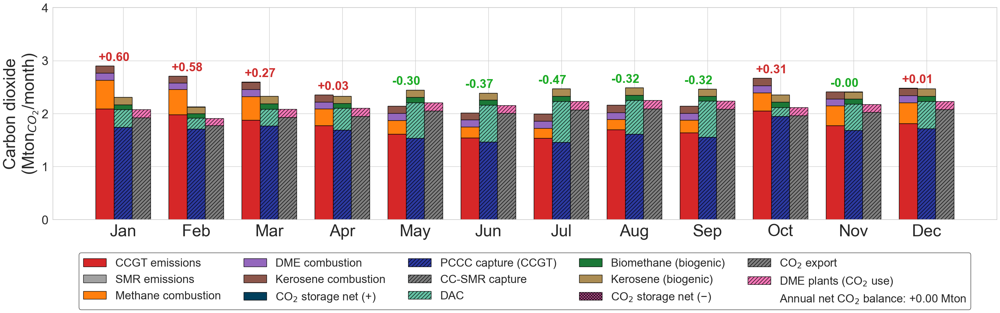

In [58]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams.update({
    "axes.labelsize": 29,
    "axes.titlesize": 29,
    "xtick.labelsize": 26,
    "ytick.labelsize": 26,
    "legend.fontsize": 24,
})

month_hours = [31*24,28*24,31*24,30*24,31*24,30*24,31*24,31*24,30*24,31*24,30*24,31*24]
months = np.arange(12)
bw = 0.25

# ================= DATA =================
co2_ccgt_prod = sys.INLAND.CCGT.co2_produced
co2_smr_prod = sys.INLAND.SMR.co2_produced
co2_ng_emiss = sys.INLAND.co2_emission_ng
co2_dme_emiss = sys.INLAND.co2_emission_dme
co2_ker_emiss = sys.INLAND.co2_emission_biokerosene

co2_pccc_ccgt_capt = sys.INLAND.PCCC_CCGT.co2_captured
co2_cc_smr_capt = sys.INLAND.CC_SMR.co2_captured
co2_dac_capt = sys.INLAND.DAC.co2_captured
co2_biometh = sys.INLAND.BIOMETHANE.co2_captured
co2_ker_bio = sys.INLAND.JET_FUEL_PLANTS.co2_captured

co2_export = sys.INLAND.CO2_EXPORT.co2_exported
co2_dme_cons = sys.INLAND.DME_PLANTS.co2_consumed

co2_charge = sys.INLAND.CO2_STORAGE.co2_charged
co2_discharge = sys.INLAND.CO2_STORAGE.co2_discharged

# ================= FUNCTIONS =================
def monthly_sum(ts):
    out = []
    s = 0
    for h in month_hours:
        out.append(np.sum(ts[s:s+h]) / 1000)  # Mton
        s += h
    return np.array(out)

# ================= MONTHLY AGGREGATES =================
monthly_sources = {
    "CCGT emissions": monthly_sum(co2_ccgt_prod),
    "SMR emissions": monthly_sum(co2_smr_prod),
    "Methane combustion": monthly_sum(co2_ng_emiss),
    "DME combustion": monthly_sum(co2_dme_emiss),
    "Kerosene combustion": monthly_sum(co2_ker_emiss),
}

monthly_captured = {
    "PCCC capture (CCGT)": monthly_sum(co2_pccc_ccgt_capt),
    "CC-SMR capture": monthly_sum(co2_cc_smr_capt),
    "DAC": monthly_sum(co2_dac_capt),
}

monthly_biogenic = {
    "Biomethane (biogenic)": monthly_sum(co2_biometh),
    "Kerosene (biogenic)": monthly_sum(co2_ker_bio),
}

monthly_third = {
    "CO$_2$ export": monthly_sum(co2_export),
    "DME plants (CO$_2$ use)": monthly_sum(co2_dme_cons),
}

storage_net = monthly_sum(co2_discharge) - monthly_sum(co2_charge)
storage_pos = np.clip(storage_net, 0, None)
storage_neg = np.clip(storage_net, None, 0)

# ================= COLORS =================
source_colors = ["#d62728", "#a1a1a1", "#ff7f0e", "#9467bd", "#8c564b"]
capt_colors = ["#2c39a0", "#7e7f7f", "#66c2a5"]
bio_colors = ["#1b7837", "#ab8c53"]
third_colors = ["#7f7f7f", "#f477b7"]
storage_pos_color = "#003f5c"
storage_neg_color = "#bc5090"

# ================= PLOT =================
plt.figure(figsize=(31, 11))

# ---- Sources ----
bottom = np.zeros(12)
for (lab, vals), col in zip(monthly_sources.items(), source_colors):
    plt.bar(months - bw, vals, bottom=bottom, width=bw,
            color=col, edgecolor="black", label=lab)
    bottom += vals

plt.bar(months - bw, storage_pos, bottom=bottom, width=bw,
        color=storage_pos_color, edgecolor="black",
        label="CO$_2$ storage net (+)")

# ---- Captured + biogenic ----
bottom = np.zeros(12)
for (lab, vals), col in zip(monthly_captured.items(), capt_colors):
    plt.bar(months, vals, bottom=bottom, width=bw,
            color=col, hatch="///", edgecolor="black", label=lab)
    bottom += vals

for (lab, vals), col in zip(monthly_biogenic.items(), bio_colors):
    plt.bar(months, vals, bottom=bottom, width=bw,
            color=col, edgecolor="black", label=lab)
    bottom += vals

plt.bar(months, storage_neg, bottom=bottom, width=bw,
        color=storage_neg_color, hatch="xxxx",
        edgecolor="black", label="CO$_2$ storage net (−)")

# ---- Third party ----
bottom = np.zeros(12)
for (lab, vals), col in zip(monthly_third.items(), third_colors):
    plt.bar(months + bw, vals, bottom=bottom, width=bw,
            color=col, hatch="///", edgecolor="black", label=lab)
    bottom += vals

# ================= BALANCE =================
total_sources = np.zeros(12)
for v in monthly_sources.values():
    total_sources += v
total_sources += storage_pos

total_sinks = np.zeros(12)
for v in monthly_captured.values():
    total_sinks += v
for v in monthly_biogenic.values():
    total_sinks += v
total_sinks += np.abs(storage_neg)

diff = total_sources - total_sinks
annual_net = np.sum(diff)

# ================= TEXT ANNOTATIONS =================
for i in range(12):
    x_mid = months[i] - bw / 2
    y_top = max(total_sources[i], total_sinks[i])

    color = "#1bab25" if diff[i] < 0 else "#ce2e2e" if diff[i] > 0 else "black"


    plt.text(
        x_mid,
        y_top + 0.05,
        f"{diff[i]:+.2f}",
        ha="center",
        va="bottom",
        fontsize=26,   # +2
        fontweight="bold",
        color=color
    )

# ================= LEGEND & AXES =================
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(plt.Line2D([0], [0], color="none"))
labels.append(f"Annual net CO$_2$ balance: {annual_net:+.2f} Mton")

plt.yticks(np.arange(0, 5, 1))
plt.xticks(
    months,
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"],
    fontsize=35
)

plt.ylabel("Carbon dioxide\n(Mton$_{CO_2}$/month)", fontsize=35)

plt.legend(
    handles,
    labels,
    ncol=5,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.13),
    frameon=True,
    facecolor="white",
    edgecolor="black"
)

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.savefig(os.path.join(scenario_result_folder,"monthly_co2_balance.pdf"), dpi=300, bbox_inches="tight")
plt.show()


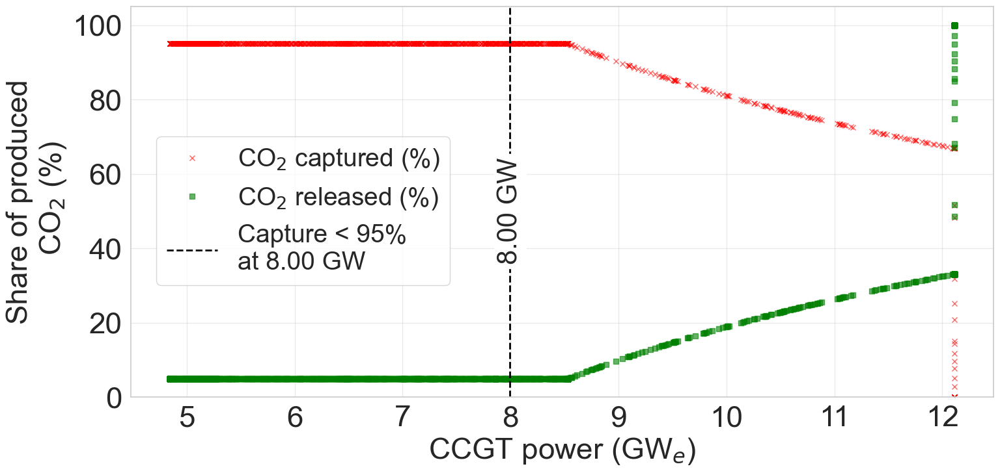

In [59]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ===================== GLOBAL STYLE ======================
# =========================================================
plt.rcParams.update({
    "axes.labelsize": 33,
    "axes.titlesize": 33,
    "xtick.labelsize": 33,
    "ytick.labelsize": 33,
    "legend.fontsize": 28
})

# =========================================================
# ===================== DATA ==============================
# =========================================================
ccgt_co2   = np.array(sys.INLAND.CCGT.co2_produced)
ccgt_e     = np.array(sys.INLAND.CCGT.e_produced)
pccc_capt  = np.array(sys.INLAND.PCCC_CCGT.co2_captured)
pccc_rel   = np.array(sys.INLAND.PCCC_CCGT.co2_released)

# ===================== FILTER =====================
mask = ccgt_co2 > 0

ccgt_co2_n = ccgt_co2[mask]
ccgt_e_n   = ccgt_e[mask]
capt_pct  = 100 * pccc_capt[mask] / ccgt_co2_n
rel_pct   = 100 * pccc_rel[mask]  / ccgt_co2_n

# ===================== THRESHOLD < 95 % =====================
mask_95 = capt_pct < 95

if np.any(mask_95):
    idx = np.where(mask_95)[0][0]
    e_threshold = ccgt_e_n[idx]
else:
    e_threshold = None

# =========================================================
# ===================== PLOT ==============================
# =========================================================
plt.figure(figsize=(16, 9))

plt.plot(
    ccgt_e_n,
    capt_pct,
    marker="x",
    linestyle="None",
    alpha=0.6,
    color="red",
    label="CO$_2$ captured (%)"
)

plt.plot(
    ccgt_e_n,
    rel_pct,
    marker="s",
    linestyle="None",
    alpha=0.6,
    color="green",
    label="CO$_2$ released (%)"
)

# ---- vertical line at threshold ----
if e_threshold is not None:
    plt.axvline(
        e_threshold,
        color="black",
        linestyle="--",
        linewidth=2.0,
        label=f"Capture < 95%\nat {e_threshold:.2f} GW"
    )
    plt.text(
        e_threshold,
        50,
        f"{e_threshold:.2f} GW",
        rotation=90,
        va="center",
        ha="center",
        fontsize=30,
        backgroundcolor="white"
    )

plt.xlabel("CCGT power (GW$_e$)")
plt.ylabel("Share of produced\n CO$_2$ (%)")
# plt.title("PCCC capture and release rates vs CCGT electricity production")

plt.ylim(0, 105)
plt.grid(True, alpha=0.4)

# ===== LEGEND BELOW X AXIS =====
plt.legend(
    loc="upper center",
    bbox_to_anchor=(0.2, 0.7),
    ncol=1,
    frameon=True
)

# =========================================================
# ===================== SAVE ==============================
# =========================================================
plt.tight_layout(rect=[0, 0.12, 1, 1])
plt.savefig(
    os.path.join(scenario_result_folder,"ccgt_pccc_capture_release_vs_power.pdf"),
    dpi=300,
    bbox_inches="tight"
)
plt.show()


## Demand

In [60]:
# Month names
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan']

# Exact hourly positions for each month start
month_positions = [0, 744, 1416, 2160, 2880, 3624, 4344, 5088, 5832, 6552, 7296, 8016, 8760]


- Total demand 

In [61]:
# Electricity demand
el = (sys.demand_el)
el_ht = (sys.demand_el_ht)
el_tr = (sys.daily_demand_for_electric_vehicle)

# Hydrogen
h2_ind = (sys.demand_h2_industry)
h2_ht = (sys.demand_h2_heat)
h2_tr = (sys.demand_h2_transport)
h2_tr2 = (sys.demand_h2_transport2)

# Methane 
ng_ind = (sys.demand_ng_industry)
ng_ht = (sys.demand_ng_heat)
ng_tr = (sys.demand_ng_transport)
ng_tr2 = (sys.demand_ng_transport2)

# Efuel
av = (sys.demand_efuel_aviation)
sh = (sys.demand_efuel_shipping)
tr = (sys.demand_efuel_truck)
efuel_ind = 2.47
efuel_ht = 0.606
efuel_non_energetic = 4.6


In [62]:
# Electricity demand
el = (sys.demand_el)
el_ht = (sys.demand_el_ht)
el_tr = (sys.daily_demand_for_electric_vehicle)

# Hydrogen
h2_ind = (sys.demand_h2_industry)
h2_ht = (sys.demand_h2_heat)
h2_tr = (sys.demand_h2_transport)
h2_tr2 = (sys.demand_h2_transport2)

# Methane 
ng_ind = (sys.demand_ng_industry)
ng_ht = (sys.demand_ng_heat)
ng_tr = (sys.demand_ng_transport)
ng_tr2 = (sys.demand_ng_transport2)

# Efuel
av = (sys.demand_efuel_aviation)
sh = (sys.demand_efuel_shipping)
tr = (sys.demand_efuel_truck)
efuel_ind = 2.47
efuel_ht = 0.606
efuel_non_energetic = 4.6


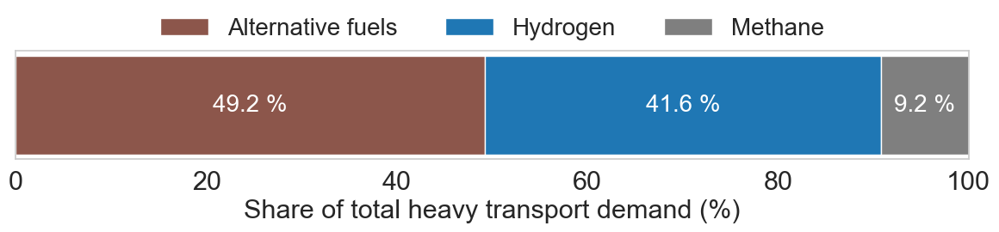

Heavy transport energy demand:
- Alternative fuels : 13.14 TWh
- Hydrogen          : 11.12 TWh
- Methane           : 2.45 TWh


In [63]:
import numpy as np
import matplotlib.pyplot as plt

# =======================
# Aggregate annual demand
# =======================

# Hydrogen (heavy transport)
h2_tr2_sum = sum(sys.demand_h2_transport2)

# Methane (heavy transport)
ng_tr2_sum = sum(sys.demand_ng_transport2)

# Alternative fuels (aviation + shipping + truck)
av_sum = sum(sys.demand_efuel_aviation)
sh_sum = sum(sys.demand_efuel_shipping)
tr_sum = sum(sys.demand_efuel_truck)
fuel_sum = av_sum + sh_sum + tr_sum

# =======================
# Percentage computation
# =======================

values = np.array([fuel_sum,h2_tr2_sum, ng_tr2_sum])
labels = ["Alternative fuels","Hydrogen", "Methane", ]

total = values.sum()
shares = 100 * values / total

# =======================
# Plot
# =======================

plt.rcParams.update({'font.size': 20})

fig, ax = plt.subplots(figsize=(12, 3))

y = np.array([0])  # single bar
left = 0.0

colors = ["#8c564b","#1f77b4", "#7f7f7f", ]

for label, share, color in zip(labels, shares, colors):
    ax.barh(y, [share], left=left, color=color, label=label)

    # --- percentage annotation ---
    ax.text(
        left + share / 2,
        y[0],
        f"{share:.1f} %",
        va="center",
        ha="center",
        fontsize=20,
        color="white"
    )

    left += share

# =======================
# Formatting
# =======================

ax.set_xlabel("Share of total heavy transport demand (%)", fontsize=22)
ax.set_xlim(0, 100)

ax.set_yticks(y)
ax.set_yticklabels([""], fontsize=22)
ax.tick_params(axis='x', labelsize=22)

ax.legend(
    frameon=False,
    ncol=3,
    fontsize=20,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.9)
)

ax.grid(False)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"Heavy_transport_energy_share_stacked_percentage.pdf"), dpi=300)
plt.show()

# =======================
# Console output (TWh)
# =======================

print("Heavy transport energy demand:")

print(f"- Alternative fuels : {fuel_sum/1000:.2f} TWh")
print(f"- Hydrogen          : {h2_tr2_sum/1000:.2f} TWh")
print(f"- Methane           : {ng_tr2_sum/1000:.2f} TWh")


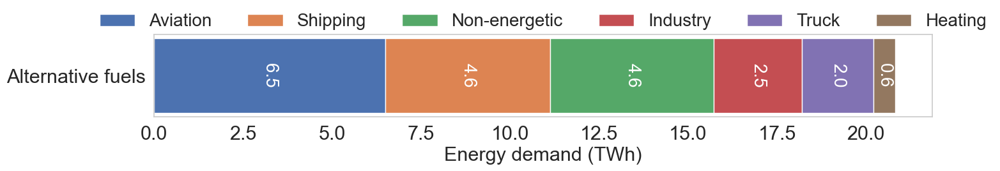

Breakdown of alternative fuels demand:
- Aviation      : 6.50 TWh  (31.2 %)
- Shipping      : 4.63 TWh  (22.2 %)
- Non-energetic : 4.60 TWh  (22.1 %)
- Industry      : 2.47 TWh  (11.9 %)
- Truck         : 2.01 TWh  (9.7 %)
- Heating       : 0.61 TWh  (2.9 %)


In [64]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# ========== ALTERNATIVE FUELS DEMAND (2050) ===============
# =========================================================

plt.rcParams.update({'font.size': 22})

# =======================
# Aggregate annual demand (TWh)
# =======================

data_raw = {
    "Aviation":      np.sum(av) / 1000,
    "Shipping":      np.sum(sh) / 1000,
    "Truck":         np.sum(tr) / 1000,
    "Industry":      efuel_ind,
    "Heating":       efuel_ht,
    "Non-energetic": efuel_non_energetic,
}

# =======================
# Sort by decreasing value
# =======================

data_sorted = dict(
    sorted(data_raw.items(), key=lambda item: item[1], reverse=True)
)

total_af = sum(data_sorted.values())

# =======================
# Plot
# =======================

labels = ["Alternative fuels"]
y = np.arange(len(labels))

fig, ax = plt.subplots(figsize=(16, 3))

left = 0.0

for sector, value in data_sorted.items():
    ax.barh(y, [value], left=left, label=sector)

    # --- VALUE ON EACH SEGMENT (rotated, white text) ---
    ax.text(
        left + value / 2,
        y[0],
        f"{value:.1f}",
        va="center",
        ha="center",
        fontsize=20,
        rotation=-90,
        color="white"
    )

    left += value

# =======================
# Formatting
# =======================

ax.set_xlabel("Energy demand (TWh)", fontsize=22)
ax.set_yticks(y)
ax.set_yticklabels(labels, fontsize=22)
ax.tick_params(axis='x', labelsize=22)

ax.legend(
    frameon=False,
    ncol=6,
    fontsize=20,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.86)
)

ax.grid(False)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"Belgium_alternative_fuels_demand_2050.pdf"), dpi=300)
plt.show()

# =======================
# Console output (shares)
# =======================

print("Breakdown of alternative fuels demand:")
for sector, value in data_sorted.items():
    share = 100 * value / total_af
    print(f"- {sector:<14}: {value:.2f} TWh  ({share:.1f} %)")


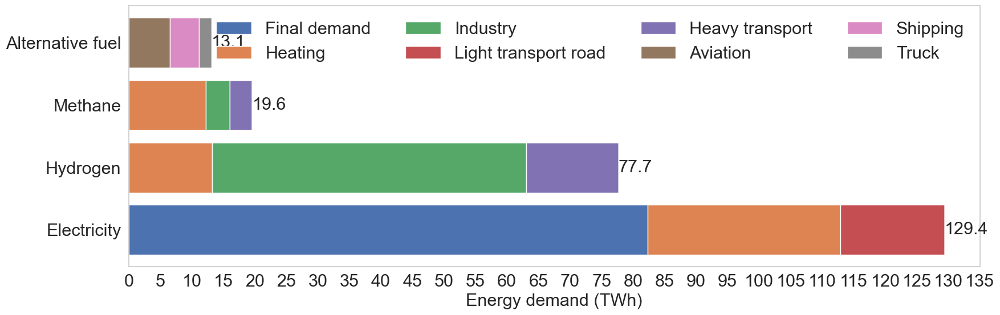

In [65]:
import numpy as np
import matplotlib.pyplot as plt

# =======================
# Aggregate annual demand
# =======================

# Electricity
el_general = np.sum(el) / 1000
el_heating = np.sum(el_ht) / 1000
el_transport = np.sum(el_tr) / 1000

# Hydrogen
h2_industry = np.sum(h2_ind) / 1000
h2_heating = np.sum(h2_ht) / 1000
h2_transport = (np.sum(h2_tr) + np.sum(h2_tr2)) / 1000

# Natural gas
ng_industry = np.sum(ng_ind) / 1000
ng_heating = np.sum(ng_ht) / 1000
ng_transport = (np.sum(ng_tr) + np.sum(ng_tr2)) / 1000

# E-fuels
efuel_aviation = np.sum(av) / 1000
efuel_shipping = np.sum(sh) / 1000
efuel_truck = np.sum(tr) / 1000
efuel_industry = efuel_ind  
efuel_heating = efuel_ht  
efuel_non_energy = efuel_non_energetic  

# =======================
# Data structure
# =======================

labels = ["Electricity", "Hydrogen", "Methane", "Alternative fuel"]
y = np.arange(len(labels))

# data = {
#     "Final demand":         [el_general, 0, 0, 0],
#     "Heating":         [el_heating, h2_heating, ng_heating, efuel_heating],
#     "Industry":        [0, h2_industry, ng_industry, efuel_industry],
#     "Light transport road": [el_transport, 0, 0, 0],
#     "Heavy transport": [0, h2_transport, ng_transport, 0],
#     "Truck":          [0, 0, 0, efuel_truck],
#     "Shipping":        [0, 0, 0, efuel_shipping],
#     "Aviation":        [0, 0, 0, efuel_aviation],
#     "Non-energetic":   [0, 0, 0, efuel_non_energy],
# }


data = {
    "Final demand":         [el_general, 0, 0, 0],
    "Heating":         [el_heating, h2_heating, ng_heating, 0],
    "Industry":        [0, h2_industry, ng_industry, 0],
    "Light transport road": [el_transport, 0, 0, 0],
    "Heavy transport": [0, h2_transport, ng_transport, 0],
    "Aviation":        [0, 0, 0, efuel_aviation],
    "Shipping":        [0, 0, 0, efuel_shipping],
    "Truck":          [0, 0, 0, efuel_truck], 
}


# =======================
# Plot
# =======================

fig, ax = plt.subplots(figsize=(18, 6))

left = np.zeros(len(labels))

for sector, values in data.items():
    ax.barh(y, values, left=left, label=sector)
    left += np.array(values)

# =======================
# Totals annotation
# =======================

for i, total in enumerate(left):
    ax.text(
        total,
        i,
        f"{total:.1f}",
        va="center",
        ha="left",
        fontsize=22
    )

# =======================
# Formatting
# =======================

ax.set_xlabel("Energy demand (TWh)", fontsize=22)
ax.set_yticks(y)
ax.set_yticklabels(labels, fontsize=22) 
ax.set_xticks(np.arange(0, 136, 5))
ax.tick_params(axis='x', labelsize=22)
ax.legend(frameon=False, ncol=4, fontsize=22)
ax.grid(False)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"Belgium_energy_demand_2050.pdf"), dpi=300)
plt.show()


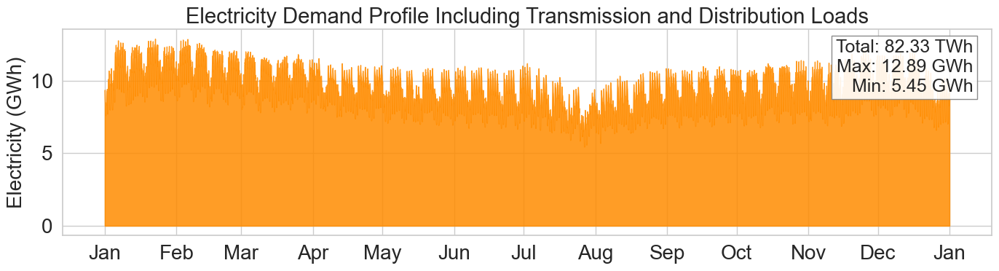

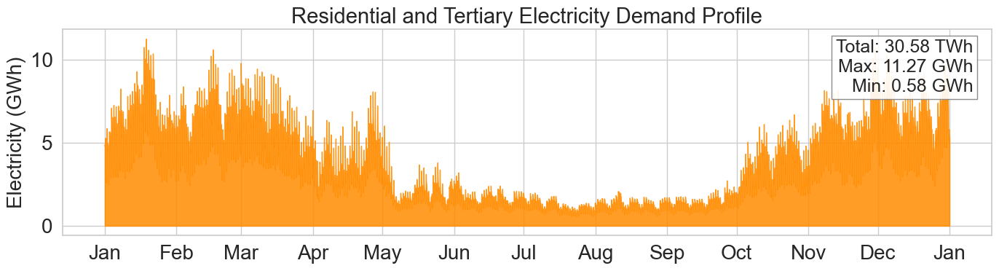

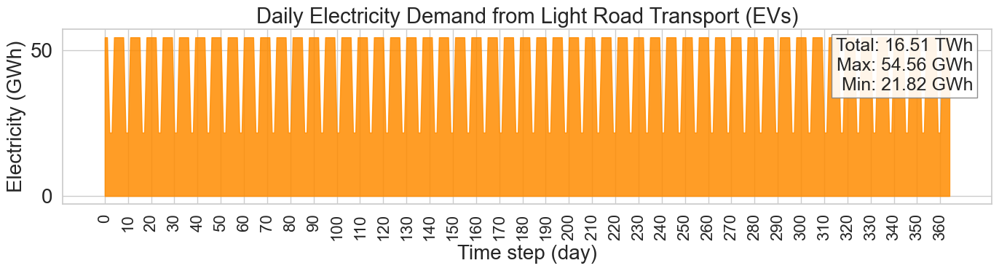

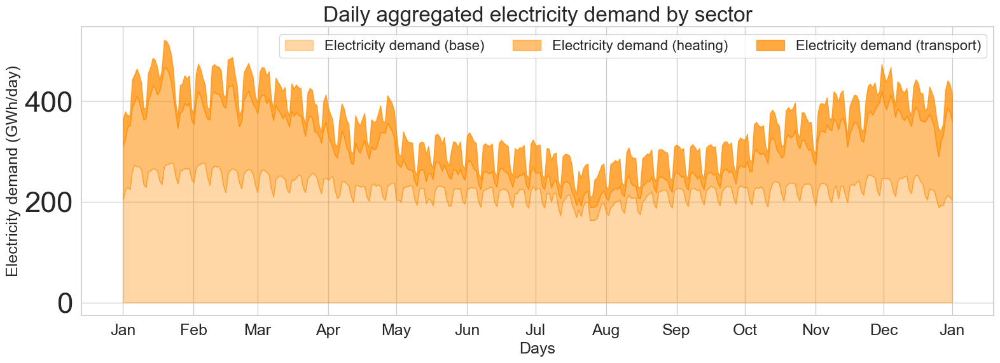

In [66]:
# Set global font size (+4)
plt.rcParams.update({'font.size': 16})

orange = "darkorange"

# =========================================================
# =============== FULL ELECTRICITY DEMAND =================
# =========================================================
el = np.array(sys.demand_el)
t = np.arange(len(el))

plt.figure(figsize=(14, 4))
plt.fill_between(t, 0, el, color=orange, alpha=0.85)

plt.ylabel('Electricity (GWh)', fontsize=20)
plt.title('Electricity Demand Profile Including Transmission and Distribution Loads', fontsize=21)
plt.xticks(month_positions, months, fontsize=20)
plt.yticks(fontsize=20)

plt.text(
    0.98, 0.95,
    f"Total: {el.sum()/1000:.2f} TWh\nMax: {el.max():.2f} GWh\nMin: {el.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=18,
    ha='right',
    va='top',
    bbox=dict(facecolor='white', edgecolor='gray', linewidth=1, alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"el_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ===== RESIDENTIAL + TERTIARY ELECTRICITY DEMAND =========
# =========================================================
el_ht = np.array(sys.demand_el_ht)
t = np.arange(len(el_ht))

plt.figure(figsize=(14, 4))
plt.fill_between(t, 0, el_ht, color=orange, alpha=0.85)

plt.ylabel('Electricity (GWh)', fontsize=20)
plt.title('Residential and Tertiary Electricity Demand Profile', fontsize=21)
plt.xticks(month_positions, months, fontsize=20)
plt.yticks(fontsize=20)

plt.text(
    0.98, 0.95,
    f"Total: {el_ht.sum()/1000:.2f} TWh\nMax: {el_ht.max():.2f} GWh\nMin: {el_ht.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=18,
    ha='right',
    va='top',
    bbox=dict(facecolor='white', edgecolor='gray', linewidth=1, alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"el_ht_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ================== EV ELECTRICITY DEMAND =================
# =========================================================
el_tr = np.array(sys.daily_demand_for_electric_vehicle)
t = np.arange(len(el_tr))

plt.figure(figsize=(14, 4))
plt.fill_between(t, 0, el_tr, color=orange, alpha=0.85)

plt.xlabel('Time step (day)', fontsize=20)
plt.ylabel('Electricity (GWh)', fontsize=20)
plt.title('Daily Electricity Demand from Light Road Transport (EVs)', fontsize=21)
plt.xticks(np.arange(0, len(el_tr), 10), rotation=90, fontsize=16)
plt.yticks(fontsize=20)

plt.text(
    0.98, 0.95,
    f"Total: {el_tr.sum()/1000:.2f} TWh\nMax: {el_tr.max():.2f} GWh\nMin: {el_tr.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=18,
    ha='right',
    va='top',
    bbox=dict(facecolor='white', edgecolor='gray', linewidth=1, alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"el_tr_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# =========== DAILY STACKED ELECTRICITY DEMAND =============
# =========================================================
el_day = pf.zoom_with_timestep(sys.demand_el, zoom='day', mean_or_sum='sum', zero_nodes='no')
el_ht_day = pf.zoom_with_timestep(sys.demand_el_ht, zoom='day', mean_or_sum='sum', zero_nodes='no')
el_tr_day = pf.zoom_with_timestep(sys.INLAND.demand_el_tr, zoom='day', mean_or_sum='sum', zero_nodes='no')

N = min(len(el_day), len(el_ht_day), len(el_tr_day))

el_day = np.array(el_day[:N])
el_ht_day = np.array(el_ht_day[:N])
el_tr_day = np.array(el_tr_day[:N])

days = np.arange(N)

y1 = el_day
y2 = y1 + el_ht_day
y3 = y2 + el_tr_day

plt.figure(figsize=(16, 6))

plt.fill_between(days, 0,  y1, color=orange, alpha=0.35, label="Electricity demand (base)")
plt.fill_between(days, y1, y2, color=orange, alpha=0.55, label="Electricity demand (heating)")
plt.fill_between(days, y2, y3, color=orange, alpha=0.75, label="Electricity demand (transport)")

plt.xticks(
    [0,31,59,90,120,151,181,212,243,273,304,334,364],
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec","Jan"],
    fontsize=18
)

plt.xlabel("Days", fontsize=18)
plt.ylabel("Electricity demand (GWh/day)", fontsize=18)
plt.title("Daily aggregated electricity demand by sector", fontsize=24)
plt.legend(ncol=3, fontsize=16)

plt.tight_layout()
plt.show()


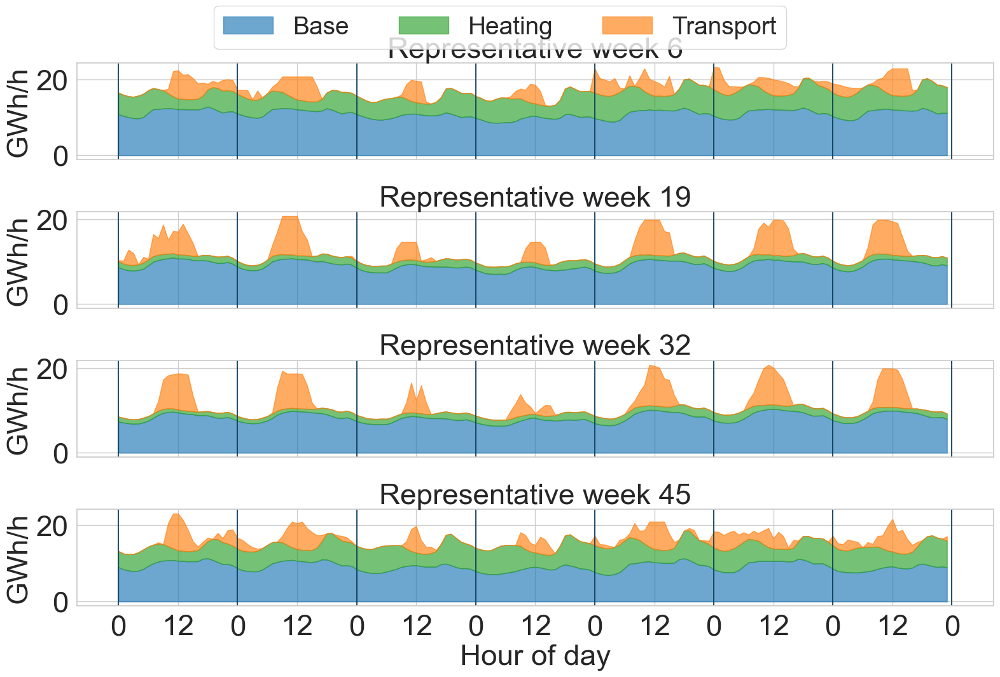

In [67]:
import numpy as np
import matplotlib.pyplot as plt

# ================= DATA =================
el = np.array(sys.demand_el)
el_ht = np.array(sys.demand_el_ht)
el_tr = np.array(sys.INLAND.demand_el_tr)

# ================= WEEKS =================
weeks = [6, 19, 32, 45]                 # week numbers in the year
starts = [(w - 1) * 168 for w in weeks] # convert week -> hour index

hours = np.arange(168)

# ticks every 12 hours
ticks = np.arange(0, 169, 12)
tick_labels = ["0" if (t % 24 == 0) else "12" for t in ticks]

# ================= PLOT =================
fig, axes = plt.subplots(4, 1, figsize=(16, 11), sharex=True)

for ax, w, start in zip(axes, weeks, starts):

    el_w = el[start:start+168]
    el_ht_w = el_ht[start:start+168]
    el_tr_w = el_tr[start:start+168]

    # --- STACK ---
    y1 = el_w
    y2 = y1 + el_ht_w
    y3 = y2 + el_tr_w

    ax.fill_between(hours, 0, y1, color="#1f77b4", alpha=0.65, label="Base")
    ax.fill_between(hours, y1, y2, color="#2ca02c", alpha=0.65, label="Heating")
    ax.fill_between(hours, y2, y3, color="#ff7f0e", alpha=0.65, label="Transport")

    # --- FORMAT ---
    ax.set_ylabel("GWh/h")
    ax.set_title(f"Representative week {w}")

    ax.set_xticks(ticks)
    ax.set_xticklabels(tick_labels)

    # vertical lines at day boundaries
    for t in range(0, 169, 24):
        ax.axvline(t, color="#0b3c5d", linewidth=1.4, alpha=0.9)

# bottom xlabel only
axes[-1].set_xlabel("Hour of day")

# global legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, ncol=3, loc="upper center", bbox_to_anchor=(0.5, 0.99))

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


- Hydrogen

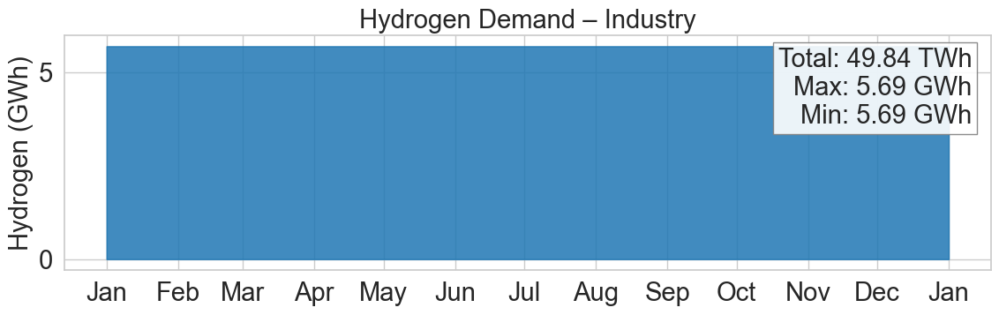

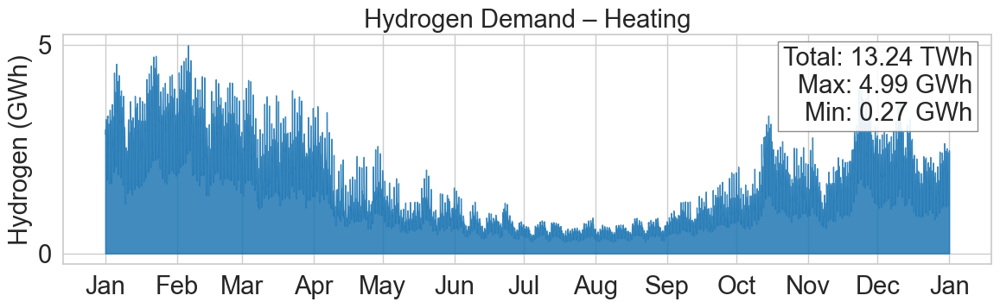

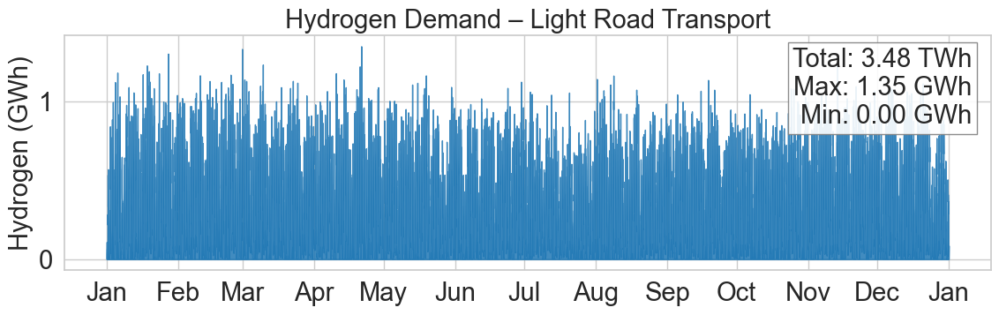

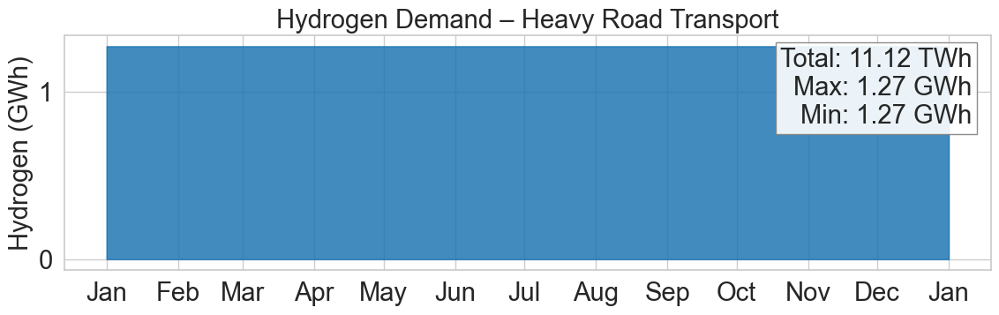

In [68]:
# =========================================================
# ============== HYDROGEN DEMAND PROFILES =================
# =========================================================

plt.rcParams.update({'font.size': 21})
blue = "#1f77b4"

# =========================================================
# ================= INDUSTRY ===============================
# =========================================================
h2_ind = np.array(sys.demand_h2_industry)
t = np.arange(len(h2_ind))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, h2_ind, color=blue, alpha=0.85)

plt.ylabel('Hydrogen (GWh)', fontsize=21)
plt.title('Hydrogen Demand – Industry', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {h2_ind.sum()/1000:.2f} TWh\n"
    f"Max: {h2_ind.max():.2f} GWh\n"
    f"Min: {h2_ind.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"h2_ind_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ================= HEATING ================================
# =========================================================
h2_ht = np.array(sys.demand_h2_heat)
t = np.arange(len(h2_ht))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, h2_ht, color=blue, alpha=0.85)

plt.ylabel('Hydrogen (GWh)', fontsize=21)
plt.title('Hydrogen Demand – Heating', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {h2_ht.sum()/1000:.2f} TWh\n"
    f"Max: {h2_ht.max():.2f} GWh\n"
    f"Min: {h2_ht.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"h2_ht_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ============ LIGHT ROAD TRANSPORT ========================
# =========================================================
h2_tr = np.array(sys.demand_h2_transport)
t = np.arange(len(h2_tr))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, h2_tr, color=blue, alpha=0.85)

plt.ylabel('Hydrogen (GWh)', fontsize=21)
plt.title('Hydrogen Demand – Light Road Transport', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {h2_tr.sum()/1000:.2f} TWh\n"
    f"Max: {h2_tr.max():.2f} GWh\n"
    f"Min: {h2_tr.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"h2_tr_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ============ HEAVY ROAD TRANSPORT ========================
# =========================================================
h2_tr2 = np.array(sys.demand_h2_transport2)
t = np.arange(len(h2_tr2))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, h2_tr2, color=blue, alpha=0.85)

plt.ylabel('Hydrogen (GWh)', fontsize=21)
plt.title('Hydrogen Demand – Heavy Road Transport', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {h2_tr2.sum()/1000:.2f} TWh\n"
    f"Max: {h2_tr2.max():.2f} GWh\n"
    f"Min: {h2_tr2.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"h2_tr2_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


- Methane

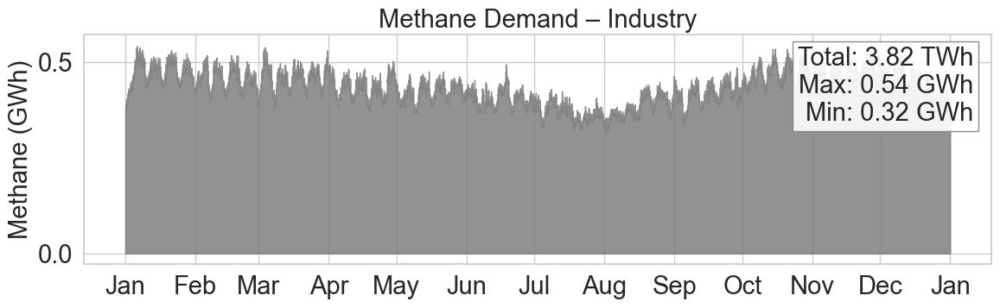

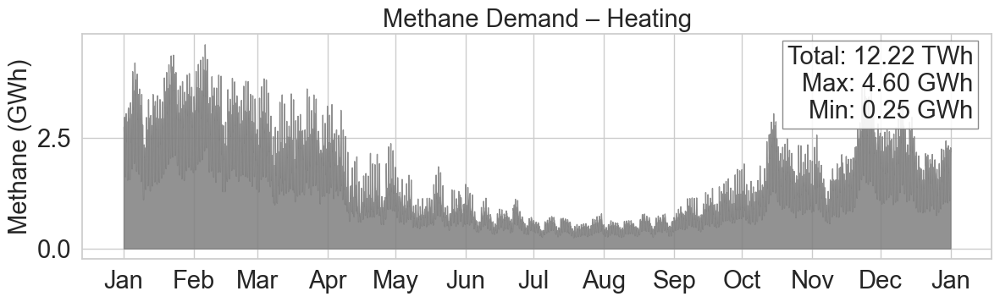

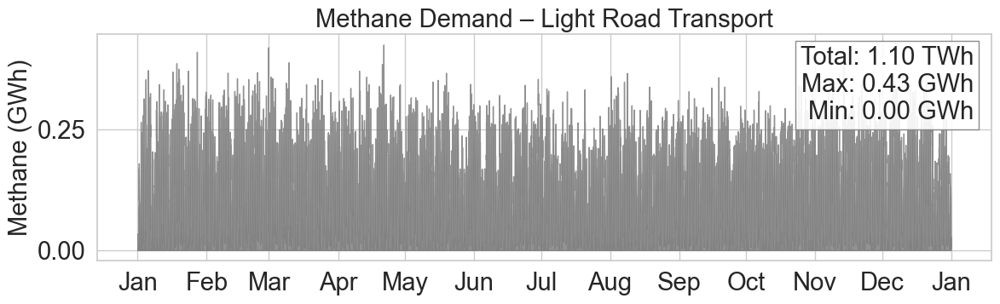

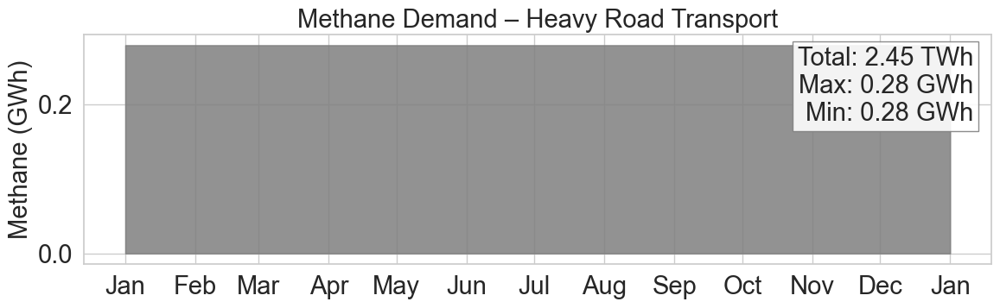

In [69]:
# =========================================================
# ============== METHANE DEMAND PROFILES ==================
# =========================================================

plt.rcParams.update({'font.size': 21})
gray = "#7f7f7f"

# =========================================================
# ================= INDUSTRY ===============================
# =========================================================
ng_ind = np.array(sys.demand_ng_industry)
t = np.arange(len(ng_ind))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, ng_ind, color=gray, alpha=0.85)

plt.ylabel('Methane (GWh)', fontsize=21)
plt.title('Methane Demand – Industry', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {ng_ind.sum()/1000:.2f} TWh\n"
    f"Max: {ng_ind.max():.2f} GWh\n"
    f"Min: {ng_ind.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"ng_ind_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ================= HEATING ================================
# =========================================================
ng_ht = np.array(sys.demand_ng_heat)
t = np.arange(len(ng_ht))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, ng_ht, color=gray, alpha=0.85)

plt.ylabel('Methane (GWh)', fontsize=21)
plt.title('Methane Demand – Heating', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {ng_ht.sum()/1000:.2f} TWh\n"
    f"Max: {ng_ht.max():.2f} GWh\n"
    f"Min: {ng_ht.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"ng_ht_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ============ LIGHT ROAD TRANSPORT ========================
# =========================================================
ng_tr = np.array(sys.demand_ng_transport)
t = np.arange(len(ng_tr))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, ng_tr, color=gray, alpha=0.85)

plt.ylabel('Methane (GWh)', fontsize=21)
plt.title('Methane Demand – Light Road Transport', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {ng_tr.sum()/1000:.2f} TWh\n"
    f"Max: {ng_tr.max():.2f} GWh\n"
    f"Min: {ng_tr.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"ng_tr_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


# =========================================================
# ============ HEAVY ROAD TRANSPORT ========================
# =========================================================
ng_tr2 = np.array(sys.demand_ng_transport2)
t = np.arange(len(ng_tr2))

plt.figure(figsize=(12, 4))
plt.fill_between(t, 0, ng_tr2, color=gray, alpha=0.85)

plt.ylabel('Methane (GWh)', fontsize=21)
plt.title('Methane Demand – Heavy Road Transport', fontsize=21)
plt.xticks(month_positions, months, fontsize=21)
plt.yticks(fontsize=21)

plt.text(
    0.98, 0.95,
    f"Total: {ng_tr2.sum()/1000:.2f} TWh\n"
    f"Max: {ng_tr2.max():.2f} GWh\n"
    f"Min: {ng_tr2.min():.2f} GWh",
    transform=plt.gca().transAxes,
    fontsize=21, ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"ng_tr2_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


- Efuel 

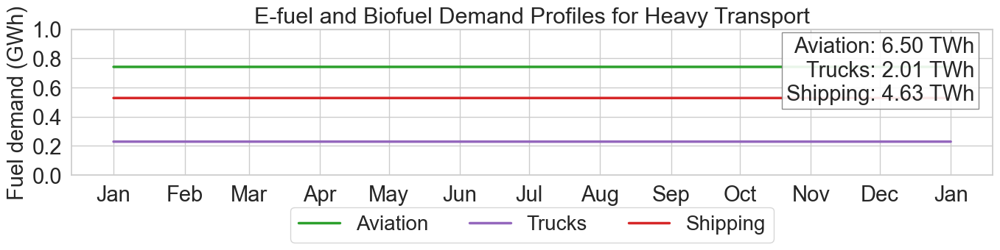

In [70]:
# =========================================================
# ========= E-FUEL & BIOFUEL DEMAND – HEAVY TRANSPORT ======
# =========================================================

plt.rcParams.update({'font.size': 21})

# --- DATA ---
efuel_av = np.array(sys.demand_efuel_aviation)
efuel_sh = np.array(sys.INLAND.demand_efuel_shipping)
efuel_tr = np.array(sys.INLAND.demand_efuel_truck)

t = np.arange(len(efuel_av))

plt.figure(figsize=(14, 4))

# --- LINE PLOTS ---
plt.plot(t, efuel_av, color="#2ca02c", linewidth=2.5, label="Aviation")
plt.plot(t, efuel_tr, color="#9467bd", linewidth=2.5, label="Trucks")
plt.plot(t, efuel_sh, color="#d62728", linewidth=2.5, label="Shipping")

# --- AXES ---
plt.ylabel('Fuel demand (GWh)', fontsize=21)
plt.title('E-fuel and Biofuel Demand Profiles for Heavy Transport', fontsize=22)
plt.xticks(month_positions, months, fontsize=21)

# ✅ Y ticks from 0 to 1
plt.yticks(np.linspace(0, 1, 6), fontsize=21)
plt.ylim(0, 1)

# --- STATS BOX ---
plt.text(
    0.98, 0.95,
    f"Aviation: {efuel_av.sum()/1000:.2f} TWh\n"
    f"Trucks: {efuel_tr.sum()/1000:.2f} TWh\n"
    f"Shipping: {efuel_sh.sum()/1000:.2f} TWh",
    transform=plt.gca().transAxes,
    fontsize=21,
    ha='right',
    va='top',
    bbox=dict(facecolor='white', edgecolor='gray', alpha=0.9)
)

# --- LEGEND ---
plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.15),
    ncol=3,
    fontsize=20
)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"efuel_demand.pdf"), format="pdf", bbox_inches="tight")
plt.show()


## Import

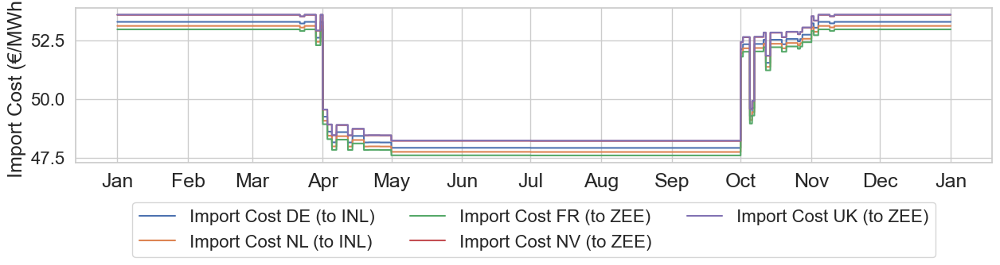

In [71]:
# Multiply values by 1000 for plotting
import_de_multiplied = [val * 1000 for val in sys.INLAND.NG_INTERCONNECTION_DE.import_costs_ts]
import_nl_multiplied = [val * 1000 for val in sys.INLAND.NG_INTERCONNECTION_NL.import_costs_ts]
import_fr_multiplied = [val * 1000 for val in sys.ZEEBRUGGE.NG_INTERCONNECTION_FR.import_costs_ts]
import_nv_multiplied = [val * 1000 for val in sys.ZEEBRUGGE.NG_INTERCONNECTION_NV.import_costs_ts]
import_uk_multiplied = [val * 1000 for val in sys.ZEEBRUGGE.NG_INTERCONNECTION_UK.import_costs_ts]

plt.figure(figsize=(13, 4))

plt.plot(import_de_multiplied, label='Import Cost DE (to INL)')
plt.plot(import_nl_multiplied, label='Import Cost NL (to INL)')
plt.plot(import_fr_multiplied, label='Import Cost FR (to ZEE)')
plt.plot(import_nv_multiplied, label='Import Cost NV (to ZEE)')
plt.plot(import_uk_multiplied, label='Import Cost UK (to ZEE)')

plt.xticks(month_positions, months, fontsize=18)
plt.yticks(fontsize=16)
plt.ylabel("Import Cost (€/MWh)", fontsize=18)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=3, fontsize=16)
plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"methane_import_ts.pdf"), format="pdf", bbox_inches="tight")

plt.show()


## Heatmap

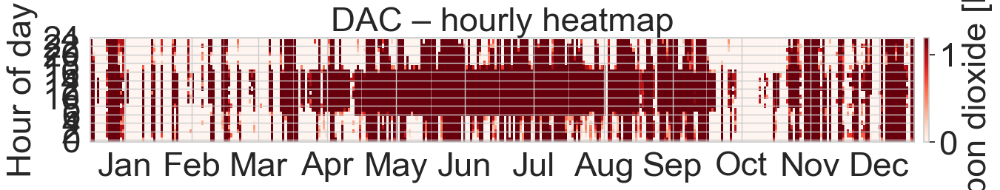

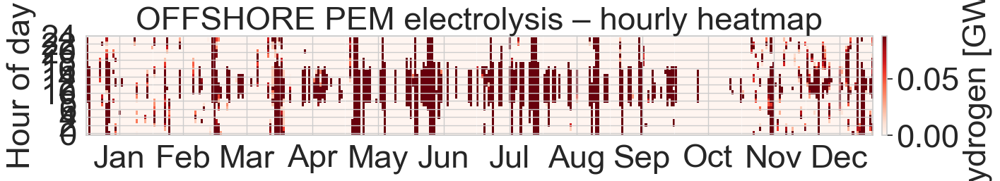

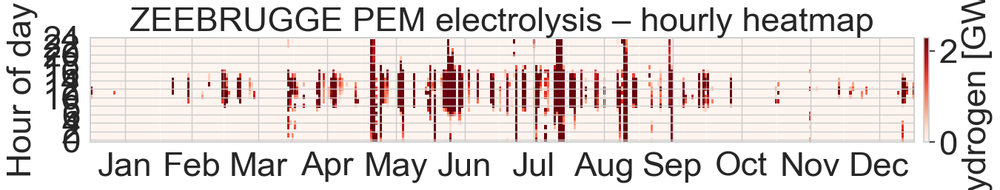

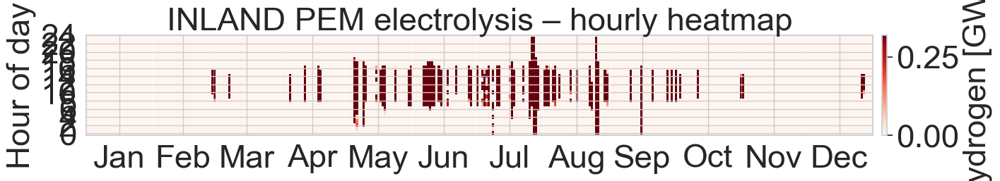

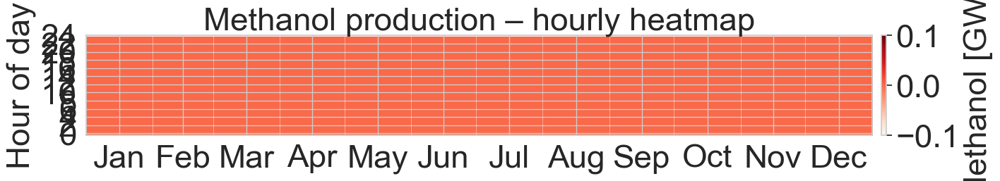

In [72]:

# 1) Imports
import numpy as np
import matplotlib.pyplot as plt
import calendar
from datetime import date

# 2) Fonction utilitaire : savoir si l'année est bissextile
def is_leap(year):
    return calendar.isleap(year)

# 3) Fonction : préparer une matrice (24, Jours) à partir d'un vecteur horaire
def to_hour_day_matrix(hourly, year=2025, fill_value=np.nan):
    hourly = np.asarray(hourly, dtype=float)
    expected = 8784 if is_leap(year) else 8760
    if hourly.size != expected:
        raise ValueError(f"Expected {expected} hours for year {year}, got {hourly.size}.")
    days = 366 if is_leap(year) else 365
    mat = hourly.reshape(days, 24).T  # shape -> (24, days)
    return mat

# 4) Fonction : ticks mensuels (positions en jours et labels ‘Jan’, ‘Feb’, …)
def month_tick_positions(year=2025):
    days = 366 if is_leap(year) else 365
    pos = [0]
    labels = []
    day_acc = 0
    for m in range(1, 13):
        labels.append(calendar.month_abbr[m])
        day_len = calendar.monthrange(year, m)[1]
        pos.append(day_acc + day_len)
        day_acc += day_len
    centers = []
    start = 0
    for m in range(12):
        end = pos[m+1]
        centers.append((start + end - 1) / 2)
        start = end
    return centers, labels, pos



def plot_single_heatmap(hourly, year=2025,
                        title="Hourly heatmap",
                        cmap="Reds",
                        cbar_label="Electricity [GWh]",
                        figsave=None):

    mat = to_hour_day_matrix(hourly, year=year)
    centers, labels, month_edges = month_tick_positions(year)

    plt.figure(figsize=(15, 3))
    im = plt.imshow(
        mat,
        aspect="auto",
        origin="lower",
        interpolation="nearest",
        cmap=cmap
    )

    plt.ylabel("Hour of day")
    plt.yticks(np.arange(0, 25, 2), [str(h) for h in range(0, 25, 2)])
    plt.xticks(centers, labels)

    for x in month_edges:
        plt.axvline(x - 0.5, color="white", linewidth=0.6, alpha=0.5)

    plt.title(title)

    cbar = plt.colorbar(im, pad=0.01)
    cbar.set_label(cbar_label)

    plt.tight_layout()

    if figsave is not None:
        plt.savefig(figsave, format="pdf", bbox_inches="tight")

    plt.show()



# figsave = os.path.join(
#     scenario_plot_folder,
#     "PV_prod_and_curtailment_duration_curve.pdf"
# )

plot_single_heatmap(
    sys.INLAND.DAC.co2_captured,
    year=2025,
    title="DAC – hourly heatmap",
    cmap="Reds",
    cbar_label="Carbon dioxide [kton]",
    figsave=os.path.join(scenario_result_folder,'heatmap_dac_co2_captured.pdf')
)


plot_single_heatmap(
    sys.OFFSHORE.ELECTROLYSIS_PEM.h2_produced,
    year=2025,
    title="OFFSHORE PEM electrolysis – hourly heatmap",
    cmap="Reds",
    cbar_label="Hydrogen [GWh]",
    figsave=os.path.join(scenario_result_folder,'heatmap_offshore_pem_h2_produced.pdf')
)


plot_single_heatmap(
    sys.ZEEBRUGGE.ELECTROLYSIS_PEM.h2_produced,
    year=2025,
    title="ZEEBRUGGE PEM electrolysis – hourly heatmap",
    cmap="Reds",
    cbar_label="Hydrogen [GWh]",
    figsave=os.path.join(scenario_result_folder,'heatmap_zeebrugge_pem_h2_produced.pdf')
)


plot_single_heatmap(
    sys.INLAND.ELECTROLYSIS_PEM.h2_produced,
    year=2025,
    title="INLAND PEM electrolysis – hourly heatmap",
    cmap="Reds",
    cbar_label="Hydrogen [GWh]",
    figsave=os.path.join(scenario_result_folder,'heatmap_inland_pem_h2_produced.pdf')
)



plot_single_heatmap(
    sys.INLAND.METHANOL_PLANTS.methanol_produced,
    year=2025,
    title="Methanol production – hourly heatmap",
    cmap="Reds",
    cbar_label="Methanol [GWh]",
    figsave=os.path.join(scenario_result_folder,'heatmap_methanol_produced.pdf')
)

## CO2 cost  

In [73]:
dac_annualised_capex = sys.INLAND.DAC.yearly_capex
dac_opex = sys.INLAND.DAC.fom + sys.INLAND.DAC.vom
print("DAC Annualised CAPEX (M€): ", dac_annualised_capex)
print("DAC OPEX (M€): ", dac_opex)
print("DAC Total Cost (M€): ", dac_annualised_capex + dac_opex)
print('')

biometh = sys.INLAND.BIOMETHANE.yearly_capex
biometh_opex = sys.INLAND.BIOMETHANE.fom + sys.INLAND.BIOMETHANE.vom
print("Biomethane Annualised CAPEX (M€): ", biometh)
print("Biomethane OPEX (M€): ", biometh_opex)
print("Biomethane Total Cost (M€): ", biometh + biometh_opex)
print('')

DAC Annualised CAPEX (M€):  322.3456140444447
DAC OPEX (M€):  20.0
DAC Total Cost (M€):  342.3456140444447

Biomethane Annualised CAPEX (M€):  168.8657230555706
Biomethane OPEX (M€):  165.177
Biomethane Total Cost (M€):  334.0427230555706



- Jet fuel plants

In [74]:
jet_fuel = sys.INLAND.JET_FUEL_PLANTS

# Electricity cost of efuel plants 
e_price = sys.INLAND_BALANCE.electricity
e_cons = sys.INLAND.JET_FUEL_PLANTS.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)] # M€ 

# Hydrogen cost of efuel plants
h2_price = sys.INLAND_BALANCE.hydrogen 
h2_cons = sys.INLAND.JET_FUEL_PLANTS.h2_consumed 
h2_cost = [p * c for p, c in zip(h2_price, h2_cons)] # M€

# Methane cost of efuel plants
ng_price = sys.INLAND_BALANCE.methane 
ng_cons = sys.INLAND.JET_FUEL_PLANTS.ng_consumed 
ng_cost = [p * c for p, c in zip(ng_price, ng_cons)] # M€

# Biomass cost of efuel plants
biomass_cons = sys.INLAND.JET_FUEL_PLANTS.biomass_consumed 
biomass_cost = sys.INLAND.JET_FUEL_PLANTS.fuel_cost


# Objectives of efuel plants
jet_fuel_obj = sys.INLAND.JET_FUEL_PLANTS.cost  # M€

print(f'Objective of Jet Fuel Plants:', round(jet_fuel_obj, 3), 'M€\n')

print(f'Biomass consumption:', round(sum(jet_fuel.biomass_consumed), 3), 'kton')
print(f'Biomass cost:', round(biomass_cost, 3), 'M€\n')

print(f'Carbon dioxide captured for Jet Fuel production:', round(sum(jet_fuel.co2_captured), 3), 'kton\n')

print(colored(f'COMMODITIES CONSUMPTION:', 'blue'))
print(f'Hydrogen consumption:', round(sum(h2_cons), 3), 'GWh')
print(f'Methane consumption:', round(sum(ng_cons), 3), 'GWh')
print(f'Electricity consumption:', round(sum(e_cons), 3), 'GWh\n')

print(colored(f'COMMODITIES COST:', 'blue'))
print(f'Hydrogen cost:', round(sum(h2_cost), 3), 'M€')
print(f'Methane cost:', round(sum(ng_cost), 3), 'M€')
print(f'Electricity cost:', round(sum(e_cost), 3), 'M€\n')


print(colored(f'Jet Fuel Plants:', 'blue'))
total_cost = sum(e_cost) + sum(ng_cost) + sum(h2_cost) + jet_fuel_obj
print(f'Total cost:', round(total_cost, 3), 'M€')

print(f'CO2 captured:', round(sum(jet_fuel.co2_captured), 3), 'GWh')

print(f"Jet Fuel capture cost per kg:", round(total_cost / sum(jet_fuel.co2_captured), 3), '€/kg') if sum(jet_fuel.co2_captured) > 0 else 0  
print(f"Jet Fuel capture cost per ton:", round(1000*total_cost / sum(jet_fuel.co2_captured), 3), '€/ton') if sum(jet_fuel.co2_captured) > 0 else 0   

Objective of Jet Fuel Plants: 693.725 M€

Biomass consumption: 739.362 kton
Biomass cost: 647.681 M€

Carbon dioxide captured for Jet Fuel production: 1638.0 kton

COMMODITIES CONSUMPTION:
Hydrogen consumption: 797.601 GWh
Methane consumption: 1159.574 GWh
Electricity consumption: 31.915 GWh

COMMODITIES COST:
Hydrogen cost: 59.82 M€
Methane cost: 58.555 M€
Electricity cost: 3.911 M€

Jet Fuel Plants:
Total cost: 816.012 M€
CO2 captured: 1638.0 GWh
Jet Fuel capture cost per kg: 0.498 €/kg
Jet Fuel capture cost per ton: 498.176 €/ton


- Biomethane

In [75]:
# Electricity cost of efuel plants 
e_price = sys.INLAND_BALANCE.electricity
e_cons = sys.INLAND.BIOMETHANE.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)] # M€ 

biometh_objective = sys.INLAND.BIOMETHANE.cost


# Objectives of efuel plants 
print(f'Objective of BIOMETHANE Plants:', round(biometh_objective, 3), 'M€\n')

print(colored(f'COMMODITIES CONSUMPTION:', 'blue')) 
print(f'Electricity consumption:', round(sum(e_cons), 3), 'GWh\n')

print(colored(f'COMMODITIES COST:', 'blue')) 
print(f'Electricity cost:', round(sum(e_cost), 3), 'M€\n')

biomethane_co2_captured = sys.INLAND.BIOMETHANE.co2_captured
print(f'CO2 captured from BIOMETHANE:', round(sum(biomethane_co2_captured), 3), 'kton\n')

print(colored(f'BIOMETHANE Plants:', 'blue'))
total_cost = sum(e_cost) + biometh_objective
print(f'Total cost:', round(total_cost, 3), 'M€') 

print(f"BIOMETHANE capture cost:", round(total_cost / sum(biomethane_co2_captured), 3), 'M€/kton') if sum(biomethane_co2_captured) > 0 else 0  
print(f"BIOMETHANE capture cost:", round(1000*total_cost / sum(biomethane_co2_captured), 3), '€/ton') if sum(biomethane_co2_captured) > 0 else 0   

Objective of BIOMETHANE Plants: 517.412 M€

COMMODITIES CONSUMPTION:
Electricity consumption: 343.854 GWh

COMMODITIES COST:
Electricity cost: 39.345 M€

CO2 captured from BIOMETHANE: 1157.643 kton

BIOMETHANE Plants:
Total cost: 556.757 M€
BIOMETHANE capture cost: 0.481 M€/kton
BIOMETHANE capture cost: 480.94 €/ton


- Dac

In [76]:
# Electricity cost of efuel plants 
e_price = sys.INLAND_BALANCE.electricity
e_cons = sys.INLAND.DAC.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)] # M€ 

dac_objective = sys.INLAND.DAC.cost


# Objectives of efuel plants 
print(f'Objective of DAC Plants:', round(dac_objective, 3), 'M€\n')

print(colored(f'COMMODITIES CONSUMPTION:', 'blue')) 
print(f'Electricity consumption:', round(sum(e_cons), 3), 'GWh\n')

print(colored(f'COMMODITIES COST:', 'blue')) 
print(f'Electricity cost:', round(sum(e_cost), 3), 'M€\n')

dac_co2_captured = sys.INLAND.DAC.co2_captured
print(f'Carbon dioxide captured from DAC:', round(sum(dac_co2_captured), 3), 'kton\n')

print(colored(f'Jet Fuel Plants:', 'blue'))
total_cost = sum(e_cost) + dac_objective
print(f'Total cost:', round(total_cost, 3), 'M€') 

print(f'CO2 captured:', round(sum(dac_co2_captured), 3), 'GWh')

print(f"DAC capture cost per kg:", round(total_cost / sum(dac_co2_captured), 3), '€/kg') if sum(dac_co2_captured) > 0 else 0  
print(f"DAC capture cost per ton:", round(1000*total_cost / sum(dac_co2_captured), 3), '€/ton') if sum(dac_co2_captured) > 0 else 0   

Objective of DAC Plants: 408.941 M€

COMMODITIES CONSUMPTION:
Electricity consumption: 10469.503 GWh

COMMODITIES COST:
Electricity cost: 898.91 M€

Carbon dioxide captured from DAC: 5881.744 kton

Jet Fuel Plants:
Total cost: 1307.851 M€
CO2 captured: 5881.744 GWh
DAC capture cost per kg: 0.222 €/kg
DAC capture cost per ton: 222.358 €/ton


- PCCC_CCGT

In [77]:
# Electricity cost of PCCC_CCGT plants 
e_price = sys.INLAND_BALANCE.electricity
e_cons = sys.INLAND.PCCC_CCGT.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)]  # M€ 

pccc_objective = sys.INLAND.PCCC_CCGT.cost

print(f'Objective of PCCC_CCGT Plants:', round(pccc_objective, 3), 'M€\n')

print(colored('COMMODITIES CONSUMPTION:', 'blue')) 
print('Electricity consumption:', round(sum(e_cons), 3), 'GWh\n')

print(colored('COMMODITIES COST:', 'blue')) 
print('Electricity cost:', round(sum(e_cost), 3), 'M€\n')

# CO2 data for PCCC_CCGT (try captured first, then emitted)
pccc_co2_captured = sys.INLAND.PCCC_CCGT.co2_captured 
pccc_co2_released = sys.INLAND.PCCC_CCGT.co2_released

print(colored('PCCC_CCGT:', 'blue'))
total_cost = sum(e_cost) + pccc_objective
print('Total cost:', round(total_cost, 3), 'M€')

print('CO2 (PCCC_CCGT):', round(sum(pccc_co2_captured), 3), 'kton')
print('Capture/emission cost per kg:', round(total_cost / sum(pccc_co2_captured), 3), '€/kg')
print('Capture/emission cost per ton:', round(1000 * total_cost / sum(pccc_co2_captured), 3), '€/ton')

Objective of PCCC_CCGT Plants: 811.38 M€

COMMODITIES CONSUMPTION:
Electricity consumption: 8209.116 GWh

COMMODITIES COST:
Electricity cost: 973.627 M€

PCCC_CCGT:
Total cost: 1785.007 M€
CO2 (PCCC_CCGT): 19900.887 kton
Capture/emission cost per kg: 0.09 €/kg
Capture/emission cost per ton: 89.695 €/ton


## Aviation   

In [78]:
jet_fuel = sys.INLAND.JET_FUEL_PLANTS
print('Total kerosene produced (GWh):', round(sum(jet_fuel.bio_kerosene_produced),2))
print('Total biomass consumed for kerosene production (kton):', round(sum(jet_fuel.biomass_consumed),2))
print('Total electricity consumed for kerosene production (GWh):', round(sum(jet_fuel.e_consumed),2))
print('Total hydrogen consumed for kerosene production (GWh):', round(sum(jet_fuel.h2_consumed),2))
print('Total methane consumed for kerosene production (GWh):', round(sum(jet_fuel.ng_consumed),2))
print('Total CO2 Captured for kerosene production (kton):', round(sum(jet_fuel.co2_captured),2))

Total kerosene produced (GWh): 6500.0
Total biomass consumed for kerosene production (kton): 739.36
Total electricity consumed for kerosene production (GWh): 31.91
Total hydrogen consumed for kerosene production (GWh): 797.6
Total methane consumed for kerosene production (GWh): 1159.57
Total CO2 Captured for kerosene production (kton): 1638.0


Objective of Jet Fuel Plants: 693.725 M€

Biomass consumption: 739.362 kton
Biomass cost: 647.681 M€

Carbon dioxide captured for Jet Fuel production: 1638.0 kton

COMMODITIES CONSUMPTION:
Hydrogen consumption: 797.601 GWh
Methane consumption: 1159.574 GWh
Electricity consumption: 31.915 GWh

COMMODITIES COST:
Hydrogen cost: 59.82 M€
Methane cost: 58.555 M€
Electricity cost: 3.911 M€

Jet Fuel Plants:
Total cost: 816.012 M€
Jet Fuel production: 6500.0 GWh
Jet Fuel production cost per MWh: 125.54 €/MWh
Jet Fuel production cost per kg: 0.785 €/kg
Jet Fuel production cost per ton: 784.626 €/ton


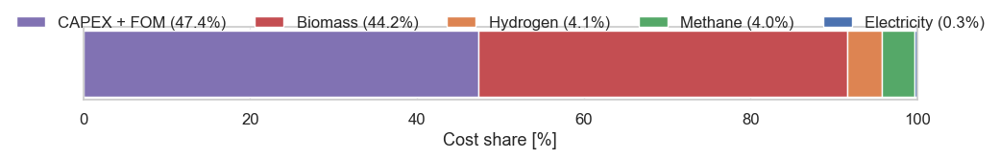

In [79]:
# Electricity cost of efuel plants 
e_price = sys.INLAND_BALANCE.electricity
e_cons = sys.INLAND.JET_FUEL_PLANTS.e_consumed  
e_cost = [p * c for p, c in zip(e_price, e_cons)] # M€ 

# Hydrogen cost of efuel plants
h2_price = sys.INLAND_BALANCE.hydrogen 
h2_cons = sys.INLAND.JET_FUEL_PLANTS.h2_consumed 
h2_cost = [p * c for p, c in zip(h2_price, h2_cons)] # M€

# Methane cost of efuel plants
ng_price = sys.INLAND_BALANCE.methane 
ng_cons = sys.INLAND.JET_FUEL_PLANTS.ng_consumed 
ng_cost = [p * c for p, c in zip(ng_price, ng_cons)] # M€

# Biomass cost of efuel plants
biomass_cons = sys.INLAND.JET_FUEL_PLANTS.biomass_consumed 
biomass_cost = sys.INLAND.JET_FUEL_PLANTS.fuel_cost


# Objectives of efuel plants
jet_fuel_obj = sys.INLAND.JET_FUEL_PLANTS.cost  # M€

print(f'Objective of Jet Fuel Plants:', round(jet_fuel_obj, 3), 'M€\n')

print(f'Biomass consumption:', round(sum(biomass_cons), 3), 'kton')
print(f'Biomass cost:', round(biomass_cost, 3), 'M€\n')

co2_captured = sys.INLAND.JET_FUEL_PLANTS.co2_captured
print(f'Carbon dioxide captured for Jet Fuel production:', round(sum(co2_captured), 3), 'kton\n')

print(colored(f'COMMODITIES CONSUMPTION:', 'blue'))
print(f'Hydrogen consumption:', round(sum(h2_cons), 3), 'GWh')
print(f'Methane consumption:', round(sum(ng_cons), 3), 'GWh')
print(f'Electricity consumption:', round(sum(e_cons), 3), 'GWh\n')

print(colored(f'COMMODITIES COST:', 'blue'))
print(f'Hydrogen cost:', round(sum(h2_cost), 3), 'M€')
print(f'Methane cost:', round(sum(ng_cost), 3), 'M€')
print(f'Electricity cost:', round(sum(e_cost), 3), 'M€\n')


print(colored(f'Jet Fuel Plants:', 'blue'))
total_cost = sum(e_cost) + sum(ng_cost) + sum(h2_cost) + jet_fuel_obj
print(f'Total cost:', round(total_cost, 3), 'M€')

jet_fuel_prod = sys.INLAND.JET_FUEL_PLANTS.bio_kerosene_produced 
print(f'Jet Fuel production:', round(sum(jet_fuel_prod), 3), 'GWh')

print(f'Jet Fuel production cost per MWh:', round(1000*(total_cost) / sum(jet_fuel_prod), 3), '€/MWh') if sum(jet_fuel_prod) > 0 else 0   
print(f"Jet Fuel production cost per kg:", round(lhv_nh3*total_cost / sum(jet_fuel_prod), 3), '€/kg') if sum(jet_fuel_prod) > 0 else 0  
print(f"Jet Fuel production cost per ton:", round(1000*lhv_nh3*total_cost / sum(jet_fuel_prod), 3), '€/ton') if sum(jet_fuel_prod) > 0 else 0   


import matplotlib.pyplot as plt

# ===============================
# DATA
# ===============================
cost_breakdown = {
    "Electricity": sum(e_cost),
    "Hydrogen": sum(h2_cost),
    "Methane": sum(ng_cost),
    "Biomass": biomass_cost,
    "CAPEX + FOM": jet_fuel_obj,
}

total_cost = sum(cost_breakdown.values())

color_map = {
    "Electricity": "#4C72B0",
    "Hydrogen": "#DD8452",
    "Methane": "#55A868",
    "Biomass": "#C44E52",
    "CAPEX + FOM": "#8172B3",
}

# ===============================
# SORT BY DECREASING SHARE
# ===============================
sorted_items = sorted(
    cost_breakdown.items(),
    key=lambda x: x[1],
    reverse=True
)

labels = [k for k, _ in sorted_items]
values = [v for _, v in sorted_items]
percentages = [100 * v / total_cost for v in values]
colors = [color_map[k] for k in labels]

# ===============================
# PLOT
# ===============================
fig, ax = plt.subplots(figsize=(11, 2.5))

left = 0
for label, pct, color in zip(labels, percentages, colors):
    ax.barh(
        y=0,
        width=pct,
        left=left,
        color=color,
        label=f"{label} ({pct:.1f}%)"
    )
    left += pct

# ===============================
# FORMATTING (fonts & spacing)
# ===============================
ax.set_xlim(0, 100)
ax.set_xlabel("Cost share [%]", fontsize=13)
ax.set_yticks([]) 

ax.tick_params(axis='x', labelsize=12)

ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 1.35),  # descend la légende
    ncol=5,                       # plus lisible
    frameon=False,
    fontsize=12,
    handlelength=1.8,
    columnspacing=1.8
)

ax.grid(axis="x", linestyle="--", alpha=0.4)

plt.tight_layout()
plt.savefig(os.path.join(scenario_result_folder,"biokerosene_cost_breakdown.pdf"), format="pdf", bbox_inches="tight")
plt.show()
